# Trabalho de Grupo — Modelos de Regressão
## Previsão de Preços Airbnb em Valência

**Licenciatura em Ciência de Dados — ISCTE 2025/26**  
**Dataset:** Inside Airbnb Valência, snapshot 2025-09-23 (`listings.csv`, 7 844 × 18)

Este notebook segue a metodologia **CRISP-DM** e está organizado em 7 secções:
1. Business Understanding
2. Data Understanding
3. Data Preparation
4. Modeling
5. Validação dos pressupostos
6. Avaliação dos resultados
7. Referências

O notebook foi preparado para correr **AS-IS** a partir da pasta do projeto. Se `dataset/listings.csv` não existir, o ficheiro é descarregado automaticamente do Inside Airbnb.

## 0. Setup

Instalação de dependências, imports e configuração global.

In [1]:
# ============================================================
# 0. INSTALAÇÃO DAS BIBLIOTECAS
# ============================================================

!pip install pandas numpy matplotlib seaborn scipy scikit-learn statsmodels openpyxl shap geopandas contextily



[notice] A new release of pip is available: 25.3 -> 26.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
# ============================================================
# 1. IMPORTS
# ============================================================

# Bibliotecas base
import os
import json
import time
import re
import unicodedata
import warnings
from math import ceil
from pathlib import Path
from urllib.request import urlretrieve

# Manipulação de dados
import numpy as np
import pandas as pd

# Visualização
import matplotlib.pyplot as plt
import seaborn as sns

# Estatística
from scipy import stats
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats.diagnostic import het_breuschpagan
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.stattools import durbin_watson

# Scikit-learn: utilitários
from sklearn.base import clone

# Scikit-learn: divisão, validação e tuning
from sklearn.model_selection import (
    train_test_split,
    KFold,
    cross_val_score,
    cross_validate,
    GridSearchCV,
    RandomizedSearchCV,
    learning_curve,
    validation_curve,
)

# Scikit-learn: pré-processamento
from sklearn.compose import (
    ColumnTransformer,
    TransformedTargetRegressor,
)
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import (
    OneHotEncoder,
    StandardScaler,
    PolynomialFeatures,
    FunctionTransformer,
)
from sklearn.impute import SimpleImputer

# Scikit-learn: modelos
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import (
    LinearRegression,
    Ridge,
    Lasso,
    ElasticNet,
    HuberRegressor,
    QuantileRegressor,
    RANSACRegressor,
)
from sklearn.ensemble import (
    RandomForestRegressor,
    HistGradientBoostingRegressor,
    GradientBoostingRegressor,
)
from sklearn.svm import SVR
from sklearn.cluster import KMeans

# Scikit-learn: métricas e interpretação
from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    median_absolute_error,
    mean_absolute_percentage_error,
    max_error,
    make_scorer,
    r2_score,
    silhouette_score,
)
from sklearn.inspection import (
    permutation_importance,
    PartialDependenceDisplay,
)

# Bibliotecas avançadas
import shap
import geopandas as gpd
import contextily as ctx

# Configurações gerais
RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)

warnings.filterwarnings("ignore")
pd.set_option("display.max_columns", None)
pd.set_option("display.width", 120)

sns.set_theme(style="whitegrid", palette="deep")
plt.rcParams["figure.dpi"] = 90

DATA_DIR = Path("dataset")
OUTPUT_DIR = Path("outputs")
DATA_DIR.mkdir(exist_ok=True)
OUTPUT_DIR.mkdir(exist_ok=True)

HAS_GEO = True

print("Setup concluído. RANDOM_STATE =", RANDOM_STATE)


Setup concluído. RANDOM_STATE = 42


---
# 1. Business Understanding

## 1.1 Contexto

O Airbnb é uma das maiores plataformas de alojamento de curta duração do mundo. A cidade de **Valência (Espanha)** é um destino turístico em crescimento acelerado, com forte sazonalidade (praia, Fallas, ciclo mediterrânico). Os dados foram obtidos do projecto [Inside Airbnb](http://insideairbnb.com/get-the-data/), que disponibiliza dumps públicos da oferta visível no site, com periodicidade ~trimestral. O snapshot usado é de **23 de setembro de 2025**.

A versão descarregada corresponde ao ficheiro `listings.csv` (versão resumida de 18 colunas). Esta é a versão que o enunciado indica explicitamente: *«Apenas fazer o download do ficheiro listings.csv da cidade do seu grupo.»*

## 1.2 Problema de negócio

**Objectivo:** construir um modelo de regressão que permita **estimar o preço por noite** (variável `price`) de um alojamento Airbnb em Valência, a partir das restantes variáveis disponíveis.

## 1.3 Questões de investigação

- **Q1.** Até que ponto o *tipo de alojamento* (`room_type`) explica a variação de preço?
- **Q2.** A *localização* (bairro, cluster geográfico, latitude/longitude) tem um efeito marginal sobre o preço para além do tipo?
- **Q3.** O *perfil do anfitrião* (número de listings gerido, `calculated_host_listings_count`) está associado a preços mais altos (oferta profissional) ou mais baixos (concorrência)?
- **Q4.** As *políticas de reserva* (`minimum_nights`, `availability_365`) têm efeito no preço?
- **Q5.** A *actividade passada* (número e ritmo de reviews) está correlacionada com preço?

## 1.4 Justificação das variáveis

| Papel | Variáveis | Razão |
|---|---|---|
| **Dependente** | `price` (log-transformado) | Alvo do modelo; log porque a distribuição é fortemente assimétrica |
| **Categóricas** | `room_type`, `neighbourhood_group` (ou clusters K-Means) | Efeito de tipo/localização |
| **Numéricas** | `minimum_nights` (log), `availability_365` → `availability_rate`, `calculated_host_listings_count`, `number_of_reviews_ltm`, `reviews_per_month` | Perfil de oferta e aceitação |
| **Derivadas** | `log_price`, `log_minimum_nights`, `availability_rate`, `days_since_last_review`, `license_exists`, `has_reviews`, `profissional` | Capturam não-linearidades e missings |
| **Excluídas** | `id`, `host_id`, `name`, `host_name`, `last_review`, `license` (bruta), `latitude/longitude` brutas | Identificadores, texto livre, ou substituídas por derivadas |

## 1.5 Limitações do dataset

O ficheiro resumido tem **apenas 18 colunas**. Variáveis conceptualmente decisivas para o preço — **número de quartos (`bedrooms`), casas-de-banho (`bathrooms`), capacidade (`accommodates`), amenities, property_type, reviews scores** — estão ausentes. Na literatura de Hedonic Pricing (Lancaster 1966, Rosen 1974) estas são precisamente as features com maior poder explicativo. Isto significa que devemos esperar um **R² baixo** em qualquer modelo construído sobre estas 18 colunas — o limite superior da performance está intrinsecamente baixo.

## 1.6 Critérios de sucesso

- Pipeline que corre end-to-end sem erros.
- Tratamento explícito dos missings, outliers e assimetrias.
- Pelo menos 4 famílias de modelo treinadas e comparadas.
- Validação dos pressupostos clássicos sobre o conjunto de teste.
- Interpretação crítica dos resultados à luz das limitações do dataset.


---
# 2. Data Understanding

Carregamento do dataset, inspecção de estrutura, estatísticas descritivas, correlações e análise de qualidade.


## 2.1 Leitura do dataset

In [3]:
# Carregar o ficheiro listings.csv (caminho relativo à pasta do notebook).
# O enunciado pede explicitamente o ficheiro listings.csv da cidade atribuída.
CAMINHO_DADOS = DATA_DIR / "listings.csv"
URL_LISTINGS = "https://data.insideairbnb.com/spain/vc/valencia/2025-09-23/visualisations/listings.csv"

if not CAMINHO_DADOS.exists():
    print("dataset/listings.csv não encontrado. A descarregar do Inside Airbnb...")
    urlretrieve(URL_LISTINGS, CAMINHO_DADOS)

CAMINHO_OUTPUTS = str(OUTPUT_DIR) + os.sep
df = pd.read_csv(CAMINHO_DADOS)

# Conversão de last_review para datetime (errors='coerce' mantém NA onde não é parseável).
df["last_review"] = pd.to_datetime(df["last_review"], errors="coerce")

print(f"Shape: {df.shape[0]} linhas x {df.shape[1]} colunas")
df.head(3)

Shape: 7844 linhas x 18 colunas


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,48154,Precioso apartamento con wifi,219476,Antonio,LA SAIDIA,MORVEDRE,39.48375,-0.37502,Entire home/apt,83.0,3,197,2025-09-15,1.08,4,150,26,VT-41540-V
1,137143,PENTHOUSE ON FRONT LINE BEACH,670775,Maria De La Piedad,POBLATS DEL SUD,EL SALER,39.36335,-0.31932,Entire home/apt,390.0,10,1,2013-07-02,0.01,5,20,0,VT32745V
2,149715,1900 Style Valencian Beach Home for 10px,5947,Susana Barbara,POBLATS MARITIMS,CABANYAL-CANYAMELAR,39.46746,-0.32813,Entire home/apt,245.0,2,313,2025-09-15,1.81,1,287,41,ESFCTU000046025000580569000000000000000000VT-3...


## 2.2 Tipos de dados e estrutura

In [4]:
# Classificação explícita das variáveis por tipo
quantitativa_discretas = [
    "number_of_reviews_ltm", "number_of_reviews",
    "minimum_nights", "calculated_host_listings_count"
]
quantitativa_continuas = [
    "latitude", "longitude", "price", "reviews_per_month", "availability_365"
]
qualitativas_nominais = [
    "neighbourhood_group", "neighbourhood", "host_name", "room_type", "name"
]
# id/host_id são identificadores, não categorias; tratamos como descartáveis sem os converter
identificadores = ["id", "host_id"]
texto_livre = ["license"]  # license é uma string longa; tratamos só a existência mais à frente

for col in qualitativas_nominais + texto_livre + identificadores:
    df[col] = df[col].astype("category")

df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7844 entries, 0 to 7843
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   id                              7844 non-null   category      
 1   name                            7844 non-null   category      
 2   host_id                         7844 non-null   category      
 3   host_name                       7838 non-null   category      
 4   neighbourhood_group             7844 non-null   category      
 5   neighbourhood                   7844 non-null   category      
 6   latitude                        7844 non-null   float64       
 7   longitude                       7844 non-null   float64       
 8   room_type                       7844 non-null   category      
 9   price                           6979 non-null   float64       
 10  minimum_nights                  7844 non-null   int64         
 11  numb

### 2.4 Range e valores das variáveis

In [5]:
# Função para range das variáveis
def range_variaveis(variaveis):
    dados_variaveis = []
    for col in variaveis:
        dados_variaveis.append({
            "Variável": col,
            "Amplitude": f" {df[col].min()}; {df[col].max()} "
        })
    return dados_variaveis
# Função para determinar os valores das variáveis qualitativas
def valores_qualitativas(variaveis):
    dados_variaveis = []
    for col in variaveis:
        categorias = df[col].cat.categories.tolist()
        dados_variaveis.append({
            "Variável": col,
            "Amplitude": None,
            "Categorias": ", ".join(map(str, categorias))
        })
    return dados_variaveis

dataframe_geral = []
dataframe_geral.extend(range_variaveis(quantitativa_continuas + quantitativa_discretas))
dataframe_geral.extend(valores_qualitativas(qualitativas_nominais+texto_livre+identificadores))
dataframe_geral = pd.DataFrame(dataframe_geral)
dataframe_geral

,Variável,Amplitude,Categorias
0,latitude,39.2799863; 39.54579,NaN
1,longitude,-0.42584; -0.27628,NaN
2,price,8.0; 40000.0,NaN
3,reviews_per_month,0.01; 37.71,NaN
4,availability_365,0; 365,NaN
5,number_of_reviews_ltm,0; 367,NaN
6,number_of_reviews,0; 935,NaN
7,minimum_nights,1; 366,NaN
8,calculated_host_listings_count,1; 103,NaN
9,neighbourhood_group,None,"ALGIROS, BENICALAP, BENIMACLET, CAMINS AL GRAU..."


## 2.3 Estatísticas descritivas — variáveis quantitativas

Função reutilizável que calcula média, mediana, std, IQR, assimetria e curtose. Coerente com o trabalho original, mas com nome corrigido e tratamento de NAs.

In [6]:
def describe_quantitativa(df, cols, export=False, export_name="descritivas.xlsx"):
    """Estatísticas descritivas completas para variáveis quantitativas."""
    desc = df[cols].describe().round(3)
    desc.loc["amplitude"] = (df[cols].max() - df[cols].min()).round(3)
    desc.loc["IQR"] = (df[cols].quantile(0.75) - df[cols].quantile(0.25)).round(3)
    desc.loc["assimetria"] = df[cols].skew().round(3)
    desc.loc["curtose"] = df[cols].kurtosis().round(3)
    if export:
        desc.to_excel(f"{CAMINHO_OUTPUTS}/{export_name}", index=True)
    display(desc)
    return desc

desc_cont = describe_quantitativa(df, quantitativa_continuas)


,latitude,longitude,price,reviews_per_month,availability_365
count,7844.000,7844.000,6979.000,6867.000,7844.000
mean,39.467,-0.364,164.113,1.695,185.951
std,0.019,0.023,732.639,1.666,120.086
min,39.280,-0.426,8.000,0.010,0.000
25%,39.461,-0.380,71.000,0.470,77.000
50%,39.469,-0.371,102.000,1.170,179.000
75%,39.475,-0.344,140.000,2.490,305.000
max,39.546,-0.276,40000.000,37.710,365.000
amplitude,0.266,0.150,39992.000,37.700,365.000
IQR,0.013,0.036,69.000,2.020,228.000


In [7]:
# Estatísticas das discretas também
desc_disc = describe_quantitativa(df, quantitativa_discretas)


,number_of_reviews_ltm,number_of_reviews,minimum_nights,calculated_host_listings_count
count,7844.000,7844.000,7844.000,7844.000
mean,13.353,51.636,6.554,12.325
std,17.752,86.940,18.756,20.771
min,0.000,0.000,1.000,1.000
25%,1.000,3.000,1.000,1.000
50%,6.000,16.000,2.000,3.000
75%,21.000,58.250,5.000,11.000
max,367.000,935.000,366.000,103.000
amplitude,367.000,935.000,365.000,102.000
IQR,20.000,55.250,4.000,10.000


### 2.3.1 Estatísticas descritivas concretas de `price`

Para que a análise descritiva não fique apenas visual, calculamos explicitamente média, mediana, desvio-padrão, quartis e percentis relevantes do preço. Estes valores são exportados para serem usados no relatório.

In [8]:
price_nonmissing = df["price"].dropna()
price_stats = pd.DataFrame({
    "Estatística": [
        "N", "Média", "Desvio-padrão", "Mínimo", "P5", "Q1", "Mediana",
        "Q3", "P90", "P95", "P99", "Máximo"
    ],
    "Valor": [
        price_nonmissing.count(),
        price_nonmissing.mean(),
        price_nonmissing.std(),
        price_nonmissing.min(),
        price_nonmissing.quantile(0.05),
        price_nonmissing.quantile(0.25),
        price_nonmissing.median(),
        price_nonmissing.quantile(0.75),
        price_nonmissing.quantile(0.90),
        price_nonmissing.quantile(0.95),
        price_nonmissing.quantile(0.99),
        price_nonmissing.max(),
    ],
})
price_stats["Valor"] = price_stats["Valor"].round(2)
price_stats.to_excel(OUTPUT_DIR / "price_descriptive_stats.xlsx", index=False)
price_stats

,Estatística,Valor
0,N,6979.00
1,Média,164.11
2,Desvio-padrão,732.64
3,Mínimo,8.00
4,P5,31.00
5,Q1,71.00
6,Mediana,102.00
7,Q3,140.00
8,P90,198.00
9,P95,264.00


**Observações:**
- `price` tem assimetria ≈ 29 e curtose ≈ 1329 — cauda extremamente pesada. Vai precisar de log.
- `minimum_nights` tem máximo de 366 — alguns listings exigem 1 ano mínimo.
- `latitude` tem assimetria ≈ -4.8 — quase todos os listings estão concentrados numa pequena faixa.

## 2.5 Estatísticas descritivas — variáveis categóricas

In [9]:
def describe_categoricas(df, cols):
    """N, cardinalidade, moda e frequência relativa para variáveis categóricas."""
    rows = []
    for var in cols:
        s = df[var]
        n = s.count()
        card = s.nunique(dropna=True)
        if not s.mode().empty:
            moda = s.mode().iloc[0]
            freq = s.value_counts().iloc[0]
            rel = round(freq / n * 100, 2) if n > 0 else 0
        else:
            moda, freq, rel = None, None, None
        rows.append({
            "Variável": var, "N": n, "Cardinalidade": card,
            "Moda": moda, "Freq. moda": freq, "Freq. rel. moda (%)": rel
        })
    return pd.DataFrame(rows)

describe_categoricas(df, qualitativas_nominais)


,Variável,N,Cardinalidade,Moda,Freq. moda,Freq. rel. moda (%)
0,neighbourhood_group,7844,19,POBLATS MARITIMS,1471,18.75
1,neighbourhood,7844,85,CABANYAL-CANYAMELAR,750,9.56
2,host_name,7838,1764,Marta,124,1.58
3,room_type,7844,4,Entire home/apt,5782,73.71
4,name,7844,7515,Habitación en Valencia,21,0.27


## 2.6 Robustez: MAD de `price` 

In [10]:
# O original usava sm.robust.scale.mad(df['price']) — devolvia nan porque
# a função não tolera NAs. Correcção: dropna antes.
mad_price = sm.robust.scale.mad(df["price"].dropna())
print(f"MAD(price) = {mad_price:.3f} € (scale='normal', isto é, MAD * 1.4826)")
print("Interpretação: ~metade dos listings tem preço dentro de ±50 € da mediana (102 €).")


MAD(price) = 50.408 € (scale='normal', isto é, MAD * 1.4826)
Interpretação: ~metade dos listings tem preço dentro de ±50 € da mediana (102 €).


## 2.7 Distribuições — histogramas e densidades

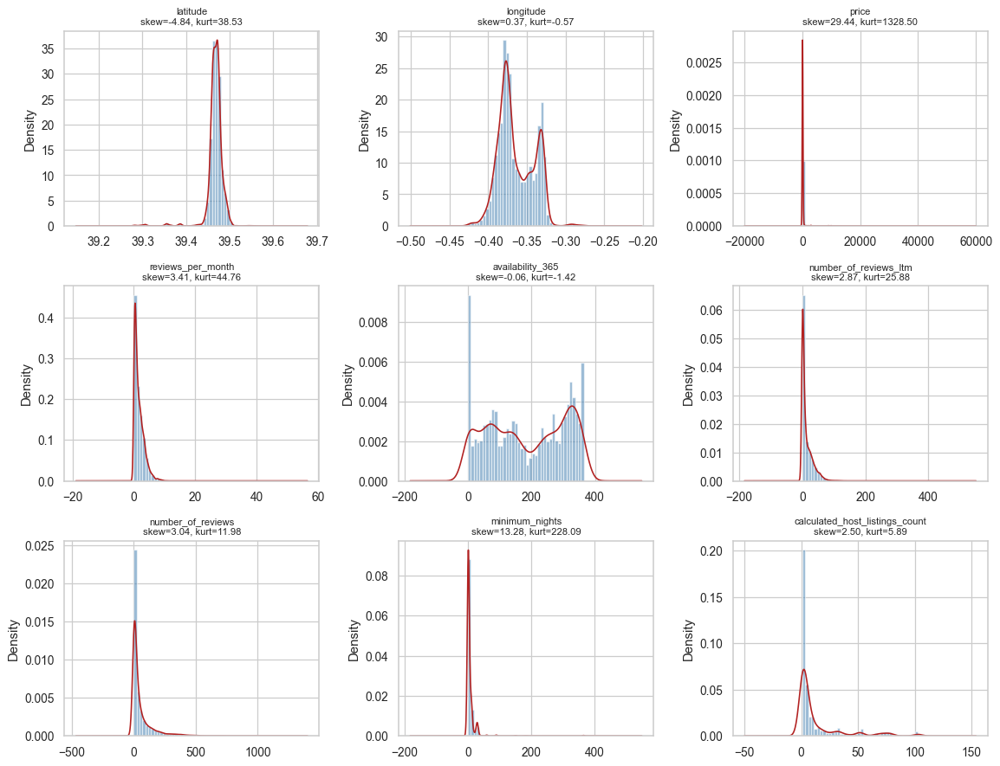

In [11]:
# Histograma + densidade para as variáveis quantitativas mais relevantes
todas_quant = quantitativa_continuas + quantitativa_discretas

fig, axes = plt.subplots(3, 3, figsize=(13, 10))
for ax, col in zip(axes.flatten(), todas_quant):
    ser = df[col].dropna()
    ax.hist(ser, bins=40, density=True, alpha=0.55, color="steelblue", edgecolor="white")
    try:
        ser.plot.density(ax=ax, color="firebrick", linewidth=1.3)
    except Exception:
        pass
    ax.set_title(f"{col}\nskew={ser.skew():.2f}, kurt={ser.kurtosis():.2f}", fontsize=9)
    ax.set_xlabel("")
# esconder eixos não usados
for ax in axes.flatten()[len(todas_quant):]:
    ax.axis("off")
plt.tight_layout()
plt.savefig("outputs/fig_histogramas.png", dpi=120, bbox_inches="tight")
plt.show()


## 2.8 Deteção de outliers

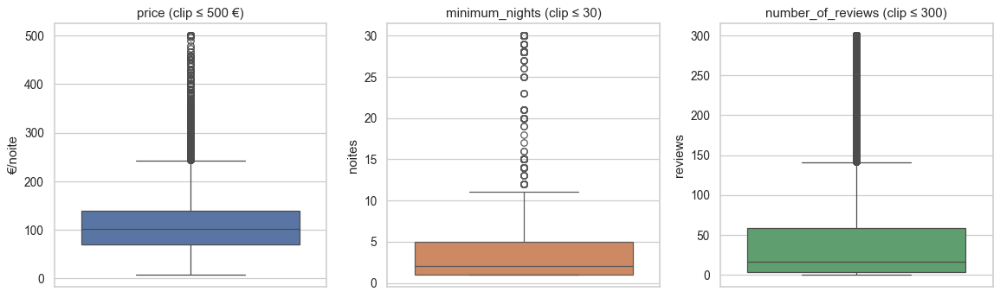

In [12]:
# 3 boxplots lado a lado: price (clip a 500), minimum_nights, number_of_reviews
fig, axes = plt.subplots(1, 3, figsize=(13, 4))

sns.boxplot(y=df["price"].clip(upper=500), ax=axes[0], color="#4C72B0")
axes[0].set_title("price (clip ≤ 500 €)")
axes[0].set_ylabel("€/noite")

sns.boxplot(y=df["minimum_nights"].clip(upper=30), ax=axes[1], color="#DD8452")
axes[1].set_title("minimum_nights (clip ≤ 30)")
axes[1].set_ylabel("noites")

sns.boxplot(y=df["number_of_reviews"].clip(upper=300), ax=axes[2], color="#55A868")
axes[2].set_title("number_of_reviews (clip ≤ 300)")
axes[2].set_ylabel("reviews")

plt.tight_layout()
plt.savefig("outputs/fig_boxplots.png", dpi=120, bbox_inches="tight")
plt.show()


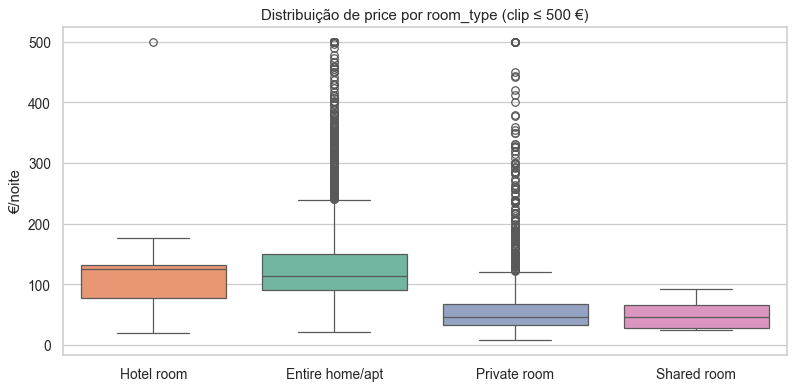

In [13]:
# Boxplot de price por room_type (clip a 500 para leitura)
fig, ax = plt.subplots(figsize=(9, 4.5))
order = df.groupby("room_type", observed=True)["price"].median().sort_values(ascending=False).index
sns.boxplot(
    x="room_type", y=df["price"].clip(upper=500),
    data=df, order=order, ax=ax, palette="Set2", hue="room_type", legend=False
)
ax.set_title("Distribuição de price por room_type (clip ≤ 500 €)")
ax.set_ylabel("€/noite")
ax.set_xlabel("")
plt.tight_layout()
plt.savefig("outputs/fig_price_por_roomtype.png", dpi=120, bbox_inches="tight")
plt.show()


## 2.9 Estatísticas de preço por grupos

In [14]:
# Preço por tipo de alojamento
price_por_tipo = (
    df.groupby("room_type", observed=True)["price"]
      .agg(["count", "median", "mean", "std"])
      .round(1)
      .sort_values("median", ascending=False)
)
print("=== Preço por room_type ===")
print(price_por_tipo)


=== Preço por room_type ===
                 count  median   mean    std
room_type                                   
Hotel room          13   125.0  160.2  204.8
Entire home/apt   5236   114.0  196.1  842.0
Private room      1720    46.0   67.3   83.0
Shared room         10    45.5   50.4   24.9


=== Top 10 distritos por volume ===
                     n_listings  mediana_price
neighbourhood_group                           
POBLATS MARITIMS           1471          105.0
CIUTAT VELLA               1284          118.0
QUATRE CARRERES             814          100.0
CAMINS AL GRAU              729           97.5
L'EIXAMPLE                  686          120.0
EXTRAMURS                   637          108.0
ALGIROS                     341           78.0
LA SAIDIA                   329           97.0
JESUS                       282           77.0
L'OLIVERETA                 233           80.0


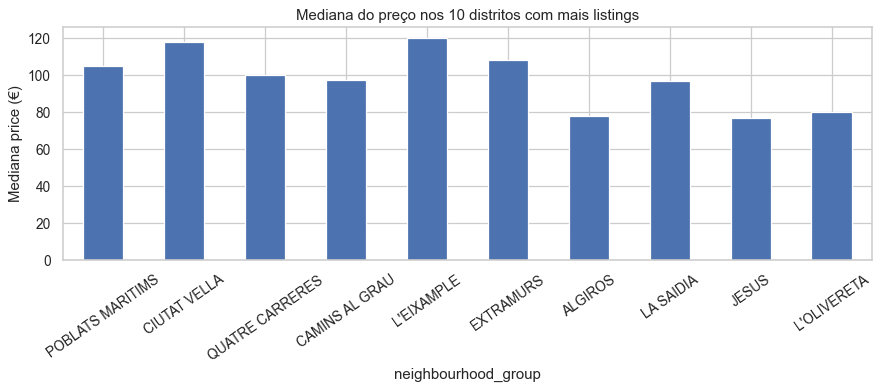

In [15]:
# Top 10 distritos (neighbourhood_group) por número de listings
top_distritos = (
    df.groupby("neighbourhood_group", observed=True)
      .agg(n_listings=("price", "size"),
           mediana_price=("price", "median"))
      .sort_values("n_listings", ascending=False)
      .head(10)
)
print("=== Top 10 distritos por volume ===")
print(top_distritos)

# Gráfico
fig, ax = plt.subplots(figsize=(10, 4.5))
top_distritos["mediana_price"].plot.bar(ax=ax, color="#4C72B0", edgecolor="white")
ax.set_ylabel("Mediana price (€)")
ax.set_title("Mediana do preço nos 10 distritos com mais listings")
ax.tick_params(axis="x", rotation=35)
plt.tight_layout()
plt.savefig("outputs/fig_top_distritos.png", dpi=120, bbox_inches="tight")
plt.show()


## 2.10 Correlações — Pearson, Spearman, Kendall

In [16]:
# Subconjunto numérico relevante (sem id/host_id)
cols_corr = [
    "price", "reviews_per_month", "number_of_reviews_ltm", "number_of_reviews",
    "minimum_nights", "calculated_host_listings_count",
    "availability_365", "latitude", "longitude"
]

pearson  = df[cols_corr].dropna().corr(method="pearson")
spearman = df[cols_corr].dropna().corr(method="spearman")
kendall  = df[cols_corr].dropna().corr(method="kendall")


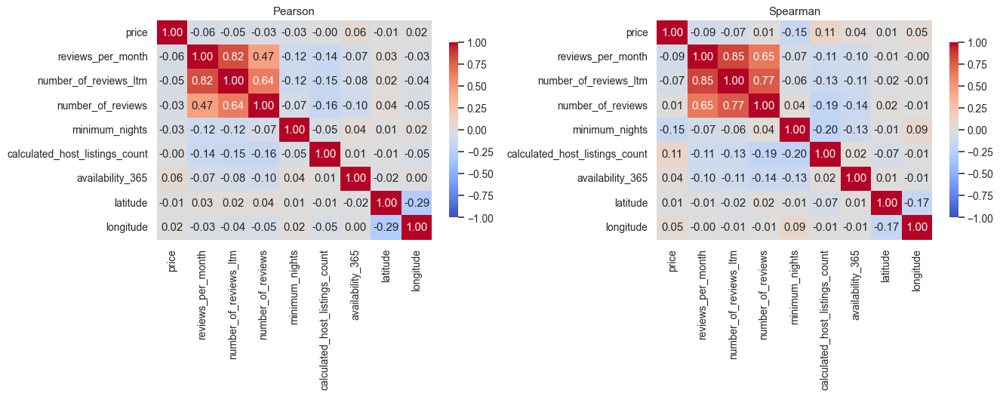

In [17]:
# Heatmap de Pearson
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
sns.heatmap(pearson, annot=True, fmt=".2f", vmin=-1, vmax=1,
            cmap="coolwarm", center=0, ax=axes[0],
            cbar_kws={"shrink": 0.8})
axes[0].set_title("Pearson")
sns.heatmap(spearman, annot=True, fmt=".2f", vmin=-1, vmax=1,
            cmap="coolwarm", center=0, ax=axes[1],
            cbar_kws={"shrink": 0.8})
axes[1].set_title("Spearman")
plt.tight_layout()
plt.savefig("outputs/fig_heatmap_corr.png", dpi=120, bbox_inches="tight")
plt.show()


In [18]:
# Tabela Pearson vs Spearman vs Kendall — foco em price
tabela_corr = pd.DataFrame({
    "Pearson":  pearson.loc["price"].drop("price").round(4),
    "Spearman": spearman.loc["price"].drop("price").round(4),
    "Kendall":  kendall.loc["price"].drop("price").round(4),
}).sort_values("Spearman", key=abs, ascending=False)
print("=== Correlações de price com cada variável (ordenado por |Spearman|) ===")
print(tabela_corr)


=== Correlações de price com cada variável (ordenado por |Spearman|) ===
                                Pearson  Spearman  Kendall
minimum_nights                  -0.0330   -0.1519  -0.1120
calculated_host_listings_count  -0.0035    0.1111   0.0774
reviews_per_month               -0.0567   -0.0933  -0.0642
number_of_reviews_ltm           -0.0501   -0.0706  -0.0491
longitude                        0.0151    0.0477   0.0325
availability_365                 0.0609    0.0378   0.0251
number_of_reviews               -0.0321    0.0126   0.0085
latitude                        -0.0125    0.0093   0.0069


**Discussão:** Todas as correlações lineares de `price` com as outras variáveis são **muito fracas** (|r| < 0.1 em Pearson). A Spearman revela um sinal mais forte para `minimum_nights` (ρ ≈ −0.18). Isto confirma a limitação do dataset resumido: as variáveis disponíveis **não são as que verdadeiramente explicam o preço** — o que mais explica (quartos, casas-de-banho, capacidade, amenities) está ausente.

### 2.10.1 Regressão, associação condicional e causalidade

A regressão é útil para analisar relações entre variáveis porque permite estimar **associações condicionais**: por exemplo, avaliar se `room_type`, `minimum_nights` ou `reviews_per_month` estão associados ao preço mantendo constantes as restantes variáveis observadas no modelo. Assim, uma formulação correta é: “mantendo constantes as restantes variáveis incluídas, esta variável está associada a uma variação média do preço”.

Contudo, isto não equivale a demonstrar **causalidade**. Para afirmar que alterar uma variável causaria diretamente uma alteração no preço, seria necessário garantir uma estratégia de identificação causal, como experiência controlada, dados longitudinais, diferenças-em-diferenças, variáveis instrumentais, matching ou outro desenho quase-experimental. Neste trabalho, os dados são observacionais e cross-sectional; além disso, faltam variáveis importantes como dimensão do alojamento, capacidade, número de quartos, casas de banho, amenities, qualidade das fotografias, reputação detalhada e distância a pontos turísticos.

Por isso, os coeficientes dos modelos lineares, as importâncias por permutação, os PDP/ICE e os valores SHAP devem ser interpretados como evidência **associativa e preditiva**, não como efeitos causais. A regressão ajuda a controlar estatisticamente pelas variáveis observadas, mas não elimina viés por variáveis omitidas nem resolve causalidade inversa.


## 2.11 Scatter plots — preditores numéricos vs price 

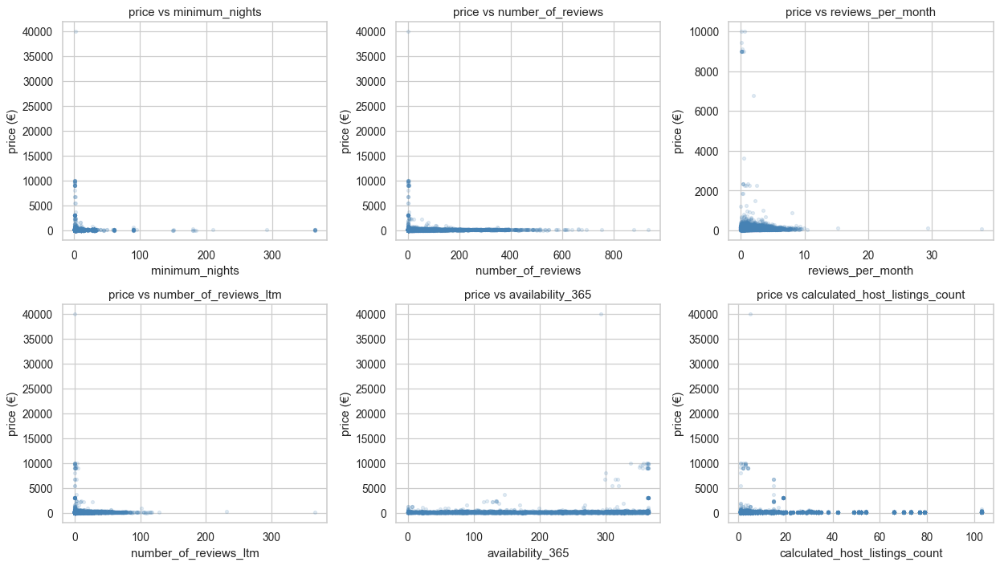

In [19]:
fig, axes = plt.subplots(2, 3, figsize=(14, 8))

num_vars = [
    "minimum_nights",
    "number_of_reviews",
    "reviews_per_month",
    "number_of_reviews_ltm",
    "availability_365",
    "calculated_host_listings_count",
    
]

for ax, col in zip(axes.flatten(), num_vars):
    sub = df[[col, "price"]].dropna()

    ax.scatter(
        sub[col],
        sub["price"],
        alpha=0.15,
        s=10,
        color="steelblue"
    )

    ax.set_xlabel(col)
    ax.set_ylabel("price (€)")
    ax.set_title(f"price vs {col}")

plt.tight_layout()
plt.savefig("outputs/fig_scatter_price_linear.png", dpi=120, bbox_inches="tight")
plt.show()

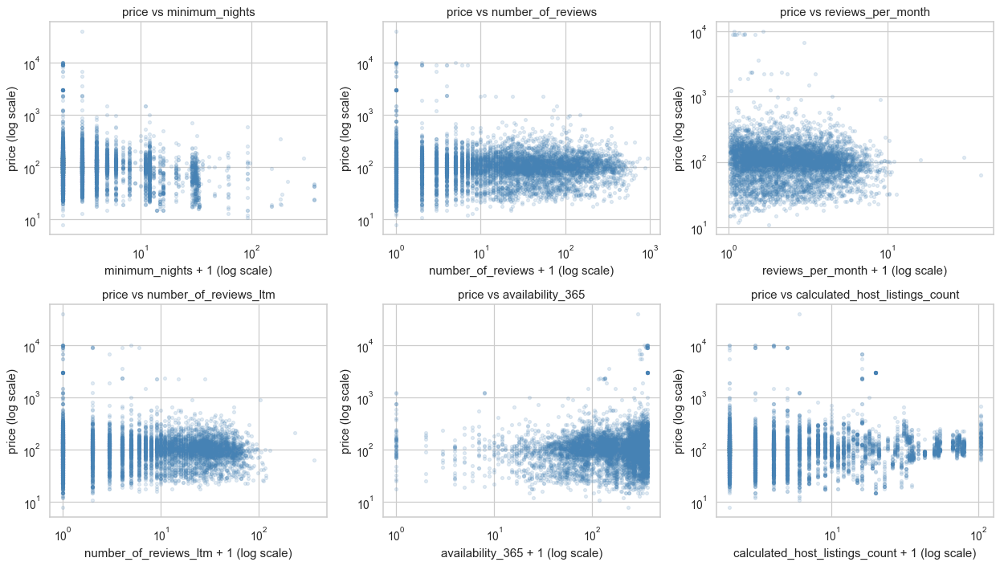

In [20]:
fig, axes = plt.subplots(2, 3, figsize=(14, 8))


for ax, col in zip(axes.flatten(), num_vars):
    sub = df[[col, "price"]].dropna()
    sub = sub[sub["price"] > 0].copy()

    x = sub[col] + 1  # para evitar problemas com zeros

    ax.scatter(x, sub["price"], alpha=0.15, s=10, color="steelblue")
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_xlabel(f"{col} + 1 (log scale)")
    ax.set_ylabel("price (log scale)")
    ax.set_title(f"price vs {col}")

plt.tight_layout()
plt.savefig("outputs/fig_scatter_price.png", dpi=120, bbox_inches="tight")
plt.show()


## 2.12 Gráficos geoespaciais

Dois mapas: (a) hexbin do preço mediano por localização, que funciona sempre (offline); (b) mapa com basemap `contextily` por cima das coordenadas — dentro de try/except para que o notebook não falhe sem internet.

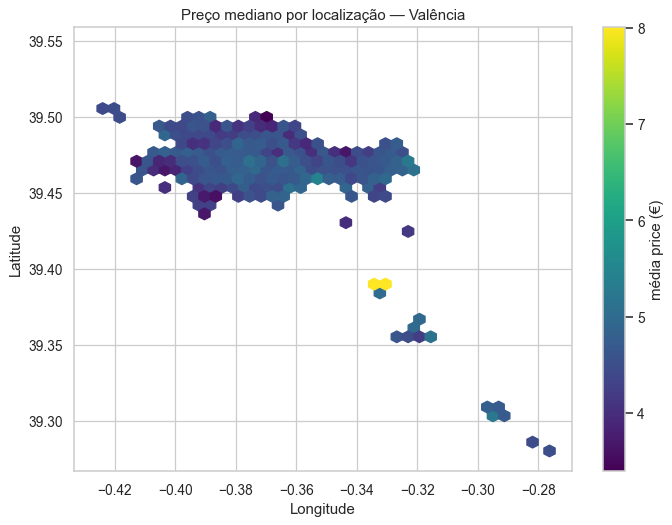

In [21]:
# Hexbin preço médio por localização (offline — sempre corre)
fig, ax = plt.subplots(figsize=(8, 6))
hb = ax.hexbin(df["longitude"], df["latitude"], C=np.log(df["price"]),
               reduce_C_function=np.median, gridsize=40, cmap="viridis", mincnt=3)
cb = fig.colorbar(hb, ax=ax, label="média price (€)")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_title("Preço mediano por localização — Valência")
plt.tight_layout()
plt.savefig("outputs/fig_hexbin_price.png", dpi=120, bbox_inches="tight")
plt.show()


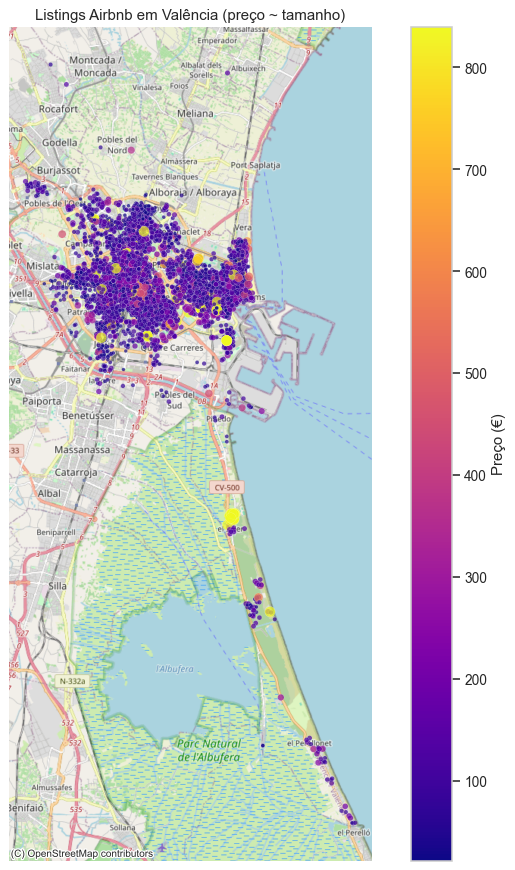

✓ Mapa com basemap gerado com sucesso.


In [22]:
# Mapa com basemap contextily — opcional, protegido por try/except
# (precisa de internet para descarregar os tiles; se falhar, o notebook continua)
try:

    geometry = gpd.points_from_xy(df["longitude"], df["latitude"])
    gdf = gpd.GeoDataFrame(df, geometry=geometry, crs="EPSG:4326").to_crs(epsg=3857)

    # Reduzir efeito de outliers no preço para o mapa
    price_clip = gdf["price"].clip(
        lower=gdf["price"].quantile(0.01),
        upper=gdf["price"].quantile(0.99)
    )
    sizes = np.interp(price_clip, (price_clip.min(), price_clip.max()), (8, 70))

    fig, ax = plt.subplots(figsize=(9, 10))
    gdf.plot(ax=ax, column=price_clip, cmap="plasma", markersize=sizes,
             alpha=0.7, legend=True, legend_kwds={"label": "Preço (€)"},
             edgecolor="white", linewidth=0.15)

    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
    ax.set_title("Listings Airbnb em Valência (preço ~ tamanho)")
    ax.set_axis_off()
    plt.tight_layout()
    plt.savefig("outputs/fig_mapa_basemap.png", dpi=120, bbox_inches="tight")
    plt.show()
    print("✓ Mapa com basemap gerado com sucesso.")
except Exception as e:
    print(f"⚠ Mapa com basemap saltado (provavelmente sem internet): {type(e).__name__}: {e}")
    print("  O notebook continua normalmente — este gráfico é opcional.")


## 2.13 Missing values

- **price (865, 11%)**: alvo do modelo; estas linhas têm de ser removidas.
- **last_review e reviews_per_month (977 cada)**: coincidem — são listings sem qualquer review (alojamentos novos ou inactivos).
- **license (3311, 42%)**: muitos listings não têm número de licença visível. Transformamos em feature binária `license_exists` em vez de descartar.
- **host_name (6, 0.08%)**: insignificante.

A mediana de `price` para listings com e sem review é **102 €** vs **95 €** — listings novos sem reviews tendem a pedir um pouco menos.

In [23]:
def missing_detection(df, export=False, export_name="missing_report.xlsx"):
    na = df.isnull().sum()
    na = na[na > 0].sort_values(ascending=False)
    out = pd.DataFrame({
        "# NAs": na,
        "% NAs": (na / len(df) * 100).round(2)
    })
    obs = df.isnull().sum(axis=1)
    obs_with_na = (obs > 0).sum()

    out.loc["Total de observações com >1 valor omitido"] = {
        "# NAs": obs_with_na,
        "% NAs": round((obs_with_na / len(df)) * 100, 2)
    }
    if export:
        out.to_excel(f"{CAMINHO_OUTPUTS}/{export_name}", index=True)
    return out

print("=== Missings no dataset original ===")
print(missing_detection(df))


=== Missings no dataset original ===
                                           # NAs  % NAs
license                                     3311  42.21
reviews_per_month                            977  12.46
last_review                                  977  12.46
price                                        865  11.03
host_name                                      6   0.08
Total de observações com >1 valor omitido   3940  50.23


In [24]:
# Mediana de price segmentada por existência de reviews
print(f"Mediana global:           {df['price'].median()}")
print(f"Com last_review:          {df['price'].loc[df['last_review'].notnull()].median()}")
print(f"Sem last_review:          {df['price'].loc[df['last_review'].isnull()].median()}")


Mediana global:           102.0
Com last_review:          102.0
Sem last_review:          95.0


#### Análise da variável licença

In [25]:
with_license = df.loc[df["license"].notna() & df["license"].notnull(), "price"].describe()
with_license["median"] = df.loc[df["license"].notna() & df["license"].notnull(), "price"].median()
display(with_license)
no_license = df.loc[df["license"].isna() | df["license"].isnull(), "price"].describe()
no_license["median"] = df.loc[df["license"].isna() | df["license"].isnull(), "price"].median()
display(no_license)

count      4165.000000
mean        196.351501
std         925.019135
min          16.000000
25%          90.000000
50%         112.000000
75%         147.000000
max       40000.000000
median      112.000000
Name: price, dtype: float64

count     2814.000000
mean       116.397655
std        247.136007
min          8.000000
25%         44.000000
50%         75.000000
75%        123.000000
max       3000.000000
median      75.000000
Name: price, dtype: float64

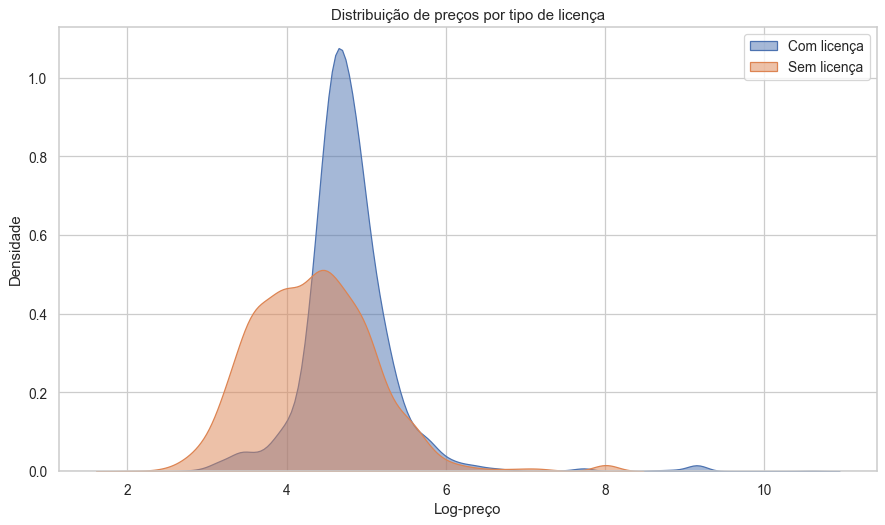

In [26]:
# distribuição de preços para anúncios com e sem licença
plt.figure(figsize=(10, 6))
sns.kdeplot(np.log(df.loc[df["license"].notna() & df["license"].notnull(), "price"]), label="Com licença", fill=True, alpha=0.5)
sns.kdeplot(np.log(df.loc[df["license"].isna() | df["license"].isnull(), "price"]), label="Sem licença", fill=True, alpha=0.5)
plt.xlabel("Log-preço")
plt.ylabel("Densidade")
plt.title("Distribuição de preços por tipo de licença")
plt.legend()
plt.tight_layout()
plt.show()

---
# 3. Data Preparation

Pipeline de limpeza e feature engineering. **Ordem correcta** (o original tinha a detecção de outliers antes de criar as features que ela usava):

1. Remover NAs do alvo (`price`).
2. Tratar NAs residuais (`reviews_per_month`, `last_review`, `license`, `host_name`).
3. Criar todas as features derivadas.
4. K-Means sobre latitude/longitude (criar clusters).
5. Gerar dummies.
6. Detectar outliers (multi-método) e remover os extremos.
7. Selecção final de variáveis com VIF.


## 3.1 Limpeza de NAs

In [27]:
# 1. Remover linhas sem price
n0 = len(df)
df = df.dropna(subset=["price"]).copy()
print(f"Removidas {n0 - len(df)} linhas sem price. Restam: {len(df)}")

# 2. reviews_per_month: NA = 0 reviews (listing novo) → preencher com 0
df["reviews_per_month"] = df["reviews_per_month"].fillna(0)

# 3. host_name: substituir por "Unknown"
df["host_name"] = df["host_name"].astype("object").fillna("Unknown").astype("category")

# 4. last_review: manter NA (vai virar days_since_last_review)
print("\nNAs após limpeza:")
print(missing_detection(df))


Removidas 865 linhas sem price. Restam: 6979

NAs após limpeza:
                                           # NAs  % NAs
license                                     2814  40.32
last_review                                  819  11.74
Total de observações com >1 valor omitido   3069  43.97


## 3.2 Feature engineering

In [28]:
# log-transformações (price e minimum_nights têm cauda pesada)
df["log_price"] = np.log(df["price"])
df["log_minimum_nights"] = np.log(df["minimum_nights"] + 1)

# Taxa de disponibilidade (0 a 1)
df["availability_rate"] = df["availability_365"] / 365.0

# Intensidade de reviews: reviews totais * reviews por mês
df["review_intensity"] = df["number_of_reviews"] * df["reviews_per_month"]

# Dias desde o último review — para listings sem review, usar valor máximo + 1
data_ref = df["last_review"].max()
df["days_since_last_review"] = (data_ref - df["last_review"]).dt.days
max_days = df["days_since_last_review"].max()
df["days_since_last_review"] = df["days_since_last_review"].fillna(max_days + 30)

# license_exists: 1 se existe licença visível
df["license_exists"] = df["license"].notna().astype(int)

# has_reviews: 1 se tem pelo menos um review
df["has_reviews"] = (df["number_of_reviews"] > 0).astype(int)

# profissional: 1 se o anfitrião gere >= 10 listings (gestor profissional vs particular)
df["profissional"] = (df["calculated_host_listings_count"] >= 10).astype(int)

print("Features criadas:", ["log_price", "log_minimum_nights", "availability_rate",
                            "review_intensity", "days_since_last_review",
                            "license_exists", "has_reviews", "profissional"])
df[["log_price", "log_minimum_nights", "availability_rate",
    "days_since_last_review", "license_exists", "has_reviews", "profissional"]].head()


Features criadas: ['log_price', 'log_minimum_nights', 'availability_rate', 'review_intensity', 'days_since_last_review', 'license_exists', 'has_reviews', 'profissional']


,log_price,log_minimum_nights,availability_rate,days_since_last_review,license_exists,has_reviews,profissional
0,4.418841,1.386294,0.410959,8.0,1,1,0
1,5.966147,2.397895,0.054795,4466.0,1,1,0
2,5.501258,1.098612,0.786301,8.0,1,1,0
3,4.820282,1.791759,0.290411,20.0,1,1,0
4,4.919981,1.386294,0.482192,190.0,1,1,0


### 3.2.1 Clustering geográfico K-Means

  File "C:\Users\ferol\AppData\Local\Programs\Python\Python312\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "C:\Users\ferol\AppData\Local\Programs\Python\Python312\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ferol\AppData\Local\Programs\Python\Python312\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "C:\Users\ferol\AppData\Local\Programs\Python\Python312\Lib\subprocess.py", line 1538, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executable, args,
                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^


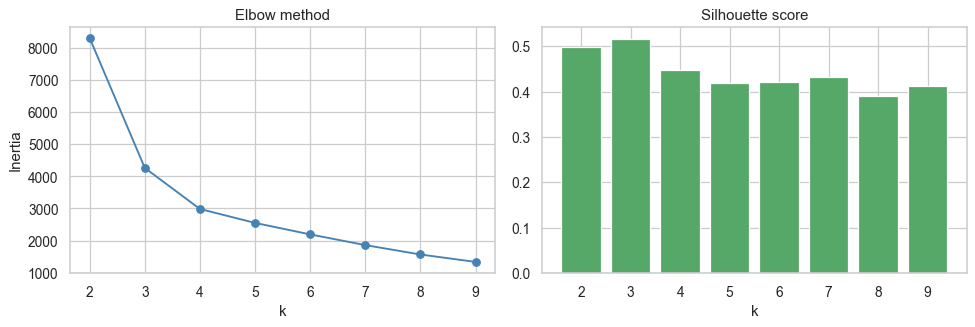


Silhouette por k: {2: np.float64(0.4986), 3: np.float64(0.5166), 4: np.float64(0.4478), 5: np.float64(0.4182), 6: np.float64(0.4211), 7: np.float64(0.4326), 8: np.float64(0.3901), 9: np.float64(0.412)}


In [29]:

# Escalonamento das coordenadas
X_geo = df[["latitude", "longitude"]].astype(float).values
X_geo_scaled = StandardScaler().fit_transform(X_geo)

# Elbow method
inertia = []
k_range = range(2, 10)
for k in k_range:
    km = KMeans(n_clusters=k, random_state=RANDOM_STATE, n_init=10)
    km.fit(X_geo_scaled)
    inertia.append(km.inertia_)

# Silhouette
sil_scores = {}
for k in k_range:
    km = KMeans(n_clusters=k, random_state=RANDOM_STATE, n_init=10)
    labels = km.fit_predict(X_geo_scaled)
    sil_scores[k] = silhouette_score(X_geo_scaled, labels)

# Plot
fig, axes = plt.subplots(1, 2, figsize=(11, 3.8))
axes[0].plot(list(k_range), inertia, marker="o", color="steelblue")
axes[0].set_title("Elbow method"); axes[0].set_xlabel("k"); axes[0].set_ylabel("Inertia")
axes[1].bar(list(sil_scores.keys()), list(sil_scores.values()), color="#55A868")
axes[1].set_title("Silhouette score"); axes[1].set_xlabel("k")
plt.tight_layout(); plt.savefig("outputs/fig_kmeans_elbow.png", dpi=120); plt.show()

print("\nSilhouette por k:", {k: round(v, 4) for k, v in sil_scores.items()})


c0 → Cluster litoral urbano

c1 → Cluster centro histórico-turístico

c2 → Cluster litoral sul premium

In [30]:
# Clustering final com k=3
K_OPT = 3
kmeans = KMeans(n_clusters=K_OPT, random_state=RANDOM_STATE, n_init=10)
df["location_cluster"] = kmeans.fit_predict(X_geo_scaled).astype(str)
#mudar o nome dos clusters de c0 para cluster literal urbano
df["location_cluster_dummy"] = df["location_cluster"].map({
    "0": "Cluster_litoral_urbano",
    "1": "Cluster_centro_historico-turístico",
    "2": "Cluster_litoral_sul_premium"
}).astype("category")

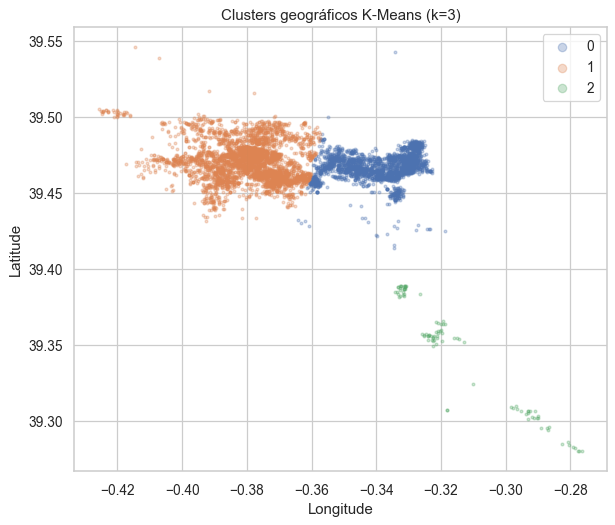

,count,median,mean
location_cluster,,,
0,2558,101.0,184.6
1,4325,102.0,139.1
2,96,135.5,744.4


In [31]:

# Visualizar clusters
fig, ax = plt.subplots(figsize=(7, 6))
for c, color in zip(sorted(df["location_cluster"].unique()), ["#4C72B0", "#DD8452", "#55A868"]):
    sub = df[df["location_cluster"] == c]
    ax.scatter(sub["longitude"], sub["latitude"], s=5, alpha=0.3, color=color, label=c)
ax.set_xlabel("Longitude"); ax.set_ylabel("Latitude")
ax.set_title(f"Clusters geográficos K-Means (k={K_OPT})")
ax.legend(markerscale=3)
plt.tight_layout(); plt.savefig("outputs/fig_clusters.png", dpi=120); plt.show()

df.groupby("location_cluster", observed=True)["price"].agg(["count", "median", "mean"]).round(1)


In [32]:

ct = pd.crosstab(df["location_cluster_dummy"], df["neighbourhood"])
ct_prop = ct.div(ct.sum(axis=1), axis=0)

for c in ct_prop.index:
    print(f"\n{c}")
    print(ct_prop.loc[c].sort_values(ascending=False).head(5))


Cluster_centro_historico-turístico
neighbourhood
RUSSAFA          0.116301
EL CARME         0.053642
SANT FRANCESC    0.051098
EL MERCAT        0.049480
EN CORTS         0.049017
Name: Cluster_centro_historico-turístico, dtype: float64

Cluster_litoral_sul_premium
neighbourhood
EL SALER         0.614583
EL PERELLONET    0.291667
PINEDO           0.072917
EL PALMAR        0.020833
AIORA            0.000000
Name: Cluster_litoral_sul_premium, dtype: float64

Cluster_litoral_urbano
neighbourhood
CABANYAL-CANYAMELAR    0.265051
AIORA                  0.124707
EL GRAU                0.103206
LA MALVA-ROSA          0.091869
LA CREU DEL GRAU       0.046912
Name: Cluster_litoral_urbano, dtype: float64


In [33]:
df.groupby("location_cluster_dummy")["price"].mean()

location_cluster_dummy
Cluster_centro_historico-turístico    139.106821
Cluster_litoral_sul_premium           744.416667
Cluster_litoral_urbano                184.615324
Name: price, dtype: float64

In [34]:
df.groupby("location_cluster_dummy").agg({
    "price": ["mean", "std"],
    "availability_rate": "mean",
    "review_intensity": "mean"
})

price              availability_rate review_intensity
                                          mean          std              mean             mean
location_cluster_dummy                                                                        
Cluster_centro_historico-turístico  139.106821   445.526815          0.542077       185.728791
Cluster_litoral_sul_premium         744.416667  1419.975290          0.725771        30.028125
Cluster_litoral_urbano              184.615324  1019.858528          0.545489       121.763276

#### Analise geoespacial

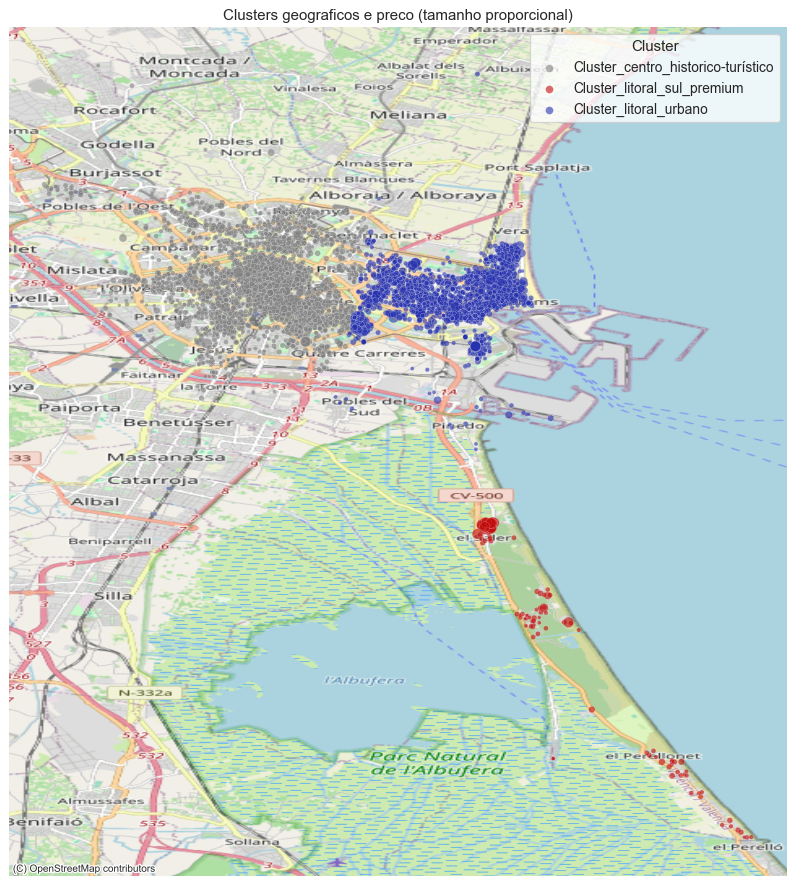

In [35]:
# Optional contextily basemap. If geographic packages or map tiles are unavailable,
# the notebook continues because the offline cluster plot above is sufficient.
if HAS_GEO:
    try:
        df_map = df.dropna(subset=["longitude", "latitude", "price", "location_cluster_dummy"]).copy()

        geometry = gpd.points_from_xy(df_map["longitude"], df_map["latitude"])
        gdf = gpd.GeoDataFrame(df_map, geometry=geometry, crs="EPSG:4326").to_crs(epsg=3857)

        price_clip = gdf["price"].clip(
            lower=gdf["price"].quantile(0.01),
            upper=gdf["price"].quantile(0.99)
        )
        sizes = pd.Series(
            np.interp(price_clip, (price_clip.min(), price_clip.max()), (8, 70)),
            index=gdf.index
        )

        colors = {
            "Cluster_centro_historico_turistico": "#CC3D8A",
            "Cluster_litoral_urbano": "#2732AE",
            "Cluster_litoral_sul_premium": "#C20C0C"
        }

        fig, ax = plt.subplots(figsize=(9, 10))
        for c in sorted(gdf["location_cluster_dummy"].unique()):
            sub = gdf[gdf["location_cluster_dummy"] == c]
            ax.scatter(
                sub.geometry.x, sub.geometry.y,
                s=sizes.loc[sub.index], color=colors.get(str(c), "gray"),
                alpha=0.6, label=c, edgecolor="white", linewidth=0.2
            )

        ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
        ax.set_title("Clusters geograficos e preco (tamanho proporcional)")
        ax.set_axis_off()
        ax.legend(title="Cluster")
        plt.tight_layout()
        plt.savefig(OUTPUT_DIR / "fig_clusters_basemap.png", dpi=120, bbox_inches="tight")
        plt.show()
    except Exception as e:
        print(f"Mapa com basemap nao foi gerado: {e}")
else:
    print("geopandas/contextily indisponiveis: mapa com basemap ignorado.")

### 3.2.2 Dummies para variáveis categóricas

In [36]:
# Guardar o room_type ORIGINAL antes do get_dummies — vamos usá-lo mais à frente
# para estratificar o split treino/teste (garante que as 4 categorias de room_type
# ficam representadas proporcionalmente em ambos os conjuntos).
# NOTA: o nome NÃO pode começar por "room_type_" porque mais à frente
# selecionamos as dummies com startswith("room_type_") e colidiria.
df["strat_roomtype"] = df["room_type"].astype(str)

# Criar dummies com drop_first (evita dummy trap)
df = pd.get_dummies(df, columns=["room_type", "location_cluster"], drop_first=True, dtype=int)

# Colunas dummy criadas
dummy_cols = [c for c in df.columns if c.startswith("room_type_") or c.startswith("location_cluster_")]
print("Dummies criadas:", dummy_cols)
print("strat_roomtype preservada para o stratify do split:", df["strat_roomtype"].value_counts().to_dict())


Dummies criadas: ['location_cluster_dummy', 'room_type_Hotel room', 'room_type_Private room', 'room_type_Shared room', 'location_cluster_1', 'location_cluster_2']
strat_roomtype preservada para o stratify do split: {'Entire home/apt': 5236, 'Private room': 1720, 'Hotel room': 13, 'Shared room': 10}


## 3.5 Estratégia avançada para a modelação

Esta secção substitui a modelação simples por uma comparação mais robusta de modelos. A estratégia segue os pontos do enunciado:

1. definir variável dependente e preditores candidatos;
2. tratar valores omissos e observações influentes de forma justificada;
3. usar as dummies criadas por One-Hot Encoding;
4. normalizar variáveis quando o estimador o exige;
5. dividir os dados em treino e teste;
6. usar validação cruzada k-fold no treino;
7. otimizar hiperparâmetros com `GridSearchCV` ou `RandomizedSearchCV`;
8. comparar modelos no teste com métricas comuns;
9. escolher o modelo considerando previsão, interpretabilidade e robustez.

Como `price` é positivo, muito assimétrico e com outliers, a maioria dos modelos é testada com transformação logarítmica da variável dependente através de `TransformedTargetRegressor`. As métricas, contudo, são calculadas na escala original do preço em euros.

In [37]:
# Configuração da validação cruzada usada na modelação avançada.
CV = KFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)
print("Modelação avançada preparada com validação cruzada k-fold (k=5).")


Modelação avançada preparada com validação cruzada k-fold (k=5).


### 3.5.1 Variável dependente, preditores candidatos e tratamento de outliers

In [38]:
# Preditores candidatos: variáveis numéricas, dummies de room_type e dummies de localização.
# As variáveis categóricas foram codificadas por One-Hot Encoding na secção anterior.
candidate_predictors = [
    "reviews_per_month", "number_of_reviews_ltm", "number_of_reviews",
    "log_minimum_nights", "calculated_host_listings_count",
    "availability_rate", "days_since_last_review",
    "license_exists", "has_reviews", "profissional",
    "room_type_Private room", "room_type_Shared room", "room_type_Hotel room",
    "location_cluster_1", "location_cluster_2",
]
candidate_predictors = [c for c in candidate_predictors if c in df.columns]

X_all = df[candidate_predictors].apply(pd.to_numeric, errors="coerce")
y_price_all = df["price"].astype(float)
y_log_all = df["log_price"].astype(float)

# Garantir que não entram valores ausentes/inválidos.
valid_idx = X_all.dropna().index.intersection(y_price_all.dropna().index).intersection(y_log_all.dropna().index)
X_all = X_all.loc[valid_idx].copy()
y_price_all = y_price_all.loc[valid_idx].copy()
y_log_all = y_log_all.loc[valid_idx].copy()

print(f"Observações candidatas para modelação: {len(X_all)}")
print(f"Número inicial de preditores: {X_all.shape[1]}")
print("Preditores candidatos:")
print(candidate_predictors)

Observações candidatas para modelação: 6979
Número inicial de preditores: 15
Preditores candidatos:
['reviews_per_month', 'number_of_reviews_ltm', 'number_of_reviews', 'log_minimum_nights', 'calculated_host_listings_count', 'availability_rate', 'days_since_last_review', 'license_exists', 'has_reviews', 'profissional', 'room_type_Private room', 'room_type_Shared room', 'room_type_Hotel room', 'location_cluster_1', 'location_cluster_2']


### 3.5.1.1 Correlações com `log(price)`

A tabela seguinte calcula correlações de Pearson e Spearman entre `log(price)` e os preditores candidatos. A escala logarítmica é usada porque `price` é fortemente assimétrica.

In [39]:
corr_rows = []
for col in X_all.columns:
    pearson_corr = pd.concat([y_log_all.rename("log_price"), X_all[col]], axis=1).corr(method="pearson").iloc[0, 1]
    spearman_corr = pd.concat([y_log_all.rename("log_price"), X_all[col]], axis=1).corr(method="spearman").iloc[0, 1]
    corr_rows.append({
        "Variável": col,
        "Pearson_log_price": pearson_corr,
        "Spearman_log_price": spearman_corr,
        "Abs_Pearson": abs(pearson_corr),
        "Sentido": "positivo" if pearson_corr > 0 else "negativo" if pearson_corr < 0 else "nulo",
    })

corr_log_price = (
    pd.DataFrame(corr_rows)
    .sort_values("Abs_Pearson", ascending=False)
    .drop(columns="Abs_Pearson")
    .reset_index(drop=True)
)
corr_log_price.to_excel(OUTPUT_DIR / "correlation_log_price.xlsx", index=False)
corr_log_price.round(4)

,Variável,Pearson_log_price,Spearman_log_price,Sentido
0,room_type_Private room,-0.5387,-0.5592,negativo
1,license_exists,0.3035,0.3290,positivo
2,log_minimum_nights,-0.2322,-0.1830,negativo
3,location_cluster_2,0.1252,0.0631,positivo
4,calculated_host_listings_count,0.1116,0.1095,positivo
5,profissional,0.0916,0.0870,positivo
6,availability_rate,0.0749,0.0477,positivo
7,reviews_per_month,-0.0662,-0.0499,negativo
8,number_of_reviews_ltm,-0.0516,-0.0375,negativo
9,room_type_Shared room,-0.0422,-0.0449,negativo


In [40]:
def calcular_vif(X_base):
    """Calcula VIF para diagnosticar multicolinearidade."""
    X_num = X_base.apply(pd.to_numeric, errors="coerce").dropna()
    X_const = sm.add_constant(X_num, has_constant="add")
    vif = pd.DataFrame({
        "Variável": X_const.columns,
        "VIF": [variance_inflation_factor(X_const.values, i) for i in range(X_const.shape[1])]
    })
    return vif[vif["Variável"] != "const"].sort_values("VIF", ascending=False)


vif_inicial = calcular_vif(X_all)
print("=== VIF inicial ===")
print(vif_inicial.round(3).to_string(index=False))

# Remoção iterativa apenas quando VIF > 5.
selected_predictors = list(X_all.columns)
removed_by_vif = []
while True:
    vif_tmp = calcular_vif(X_all[selected_predictors])
    high_vif = vif_tmp[vif_tmp["VIF"] > 5]
    if high_vif.empty:
        break
    var_remove = high_vif.iloc[0]["Variável"]
    selected_predictors.remove(var_remove)
    removed_by_vif.append(var_remove)

X_vif = X_all[selected_predictors].copy()
print("\nRemovidas por VIF > 5:", removed_by_vif if removed_by_vif else "nenhuma")
print("\n=== VIF final ===")
print(calcular_vif(X_vif).round(3).to_string(index=False))

=== VIF inicial ===
                      Variável    VIF
        days_since_last_review 32.945
                   has_reviews 31.486
         number_of_reviews_ltm  4.422
             reviews_per_month  3.527
calculated_host_listings_count  2.431
                  profissional  2.313
             number_of_reviews  1.870
                license_exists  1.539
        room_type_Private room  1.459
            log_minimum_nights  1.100
             availability_rate  1.047
            location_cluster_2  1.044
            location_cluster_1  1.039
         room_type_Shared room  1.016
          room_type_Hotel room  1.015



Removidas por VIF > 5: ['days_since_last_review']

=== VIF final ===
                      Variável   VIF
         number_of_reviews_ltm 4.401
             reviews_per_month 3.483
calculated_host_listings_count 2.429
                  profissional 2.313
             number_of_reviews 1.869
                license_exists 1.535
        room_type_Private room 1.447
                   has_reviews 1.193
            log_minimum_nights 1.100
             availability_rate 1.047
            location_cluster_2 1.043
            location_cluster_1 1.039
         room_type_Shared room 1.016
          room_type_Hotel room 1.014


In [41]:
# Tratamento de outliers/influência:
# em vez de eliminar todos os outliers univariados, removemos apenas observações
# excessivamente influentes no modelo linear em log_price, usando distância de Cook.
X_cook = sm.add_constant(X_vif, has_constant="add")
ols_cook = sm.OLS(y_log_all.loc[X_vif.index], X_cook).fit()
cooks_d = pd.Series(ols_cook.get_influence().cooks_distance[0], index=X_vif.index, name="cooks_distance")
cook_limit = 4 / len(X_vif)
influential_idx = cooks_d[cooks_d > cook_limit].index

model_idx = X_vif.index.difference(influential_idx)
X_model = X_vif.loc[model_idx].copy()
y_model = y_price_all.loc[model_idx].copy()

print(f"Limite de Cook 4/n: {cook_limit:.6f}")
print(f"Observações influentes removidas: {len(influential_idx)}")
print(f"Observações finais: {len(X_model)}")
print(f"Preditores finais: {X_model.shape[1]}")

outlier_summary = pd.DataFrame({
    "Métrica": ["Observações iniciais", "Observações removidas por Cook", "Observações finais", "Preditores finais"],
    "Valor": [len(X_vif), len(influential_idx), len(X_model), X_model.shape[1]]
})
outlier_summary.to_excel(OUTPUT_DIR / "outlier_modeling_summary.xlsx", index=False)
outlier_summary

Limite de Cook 4/n: 0.000573
Observações influentes removidas: 279
Observações finais: 6700
Preditores finais: 14


,Métrica,Valor
0,Observações iniciais,6979
1,Observações removidas por Cook,279
2,Observações finais,6700
3,Preditores finais,14


### 3.5.2 Split treino/teste e funções de avaliação

In [42]:
# Split treino/teste.
# A estratificação por quantis do preço ajuda a preservar a distribuição do alvo nos dois conjuntos.
strata = pd.qcut(np.log(y_model), q=5, labels=False, duplicates="drop")
X_train, X_test, y_train, y_test = train_test_split(
    X_model,
    y_model,
    test_size=0.2,
    random_state=RANDOM_STATE,
    stratify=strata,
)

print(f"Treino: {X_train.shape[0]} observações")
print(f"Teste:  {X_test.shape[0]} observações")
print("\nResumo do preço por conjunto:")
display(pd.DataFrame({
    "treino": y_train.describe(),
    "teste": y_test.describe(),
}).round(2))

Treino: 5360 observações
Teste:  1340 observações

Resumo do preço por conjunto:


,treino,teste
count,5360.00,1340.00
mean,110.78,110.59
std,64.01,65.55
min,13.00,11.00
25%,70.75,70.00
50%,101.00,100.00
75%,136.00,137.00
max,575.00,575.00


In [43]:
def rmse(y_true, y_pred):
    return float(np.sqrt(mean_squared_error(y_true, y_pred)))


def wape(y_true, y_pred):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    return float(np.sum(np.abs(y_true - y_pred)) / np.sum(np.abs(y_true)) * 100)


def mape_percent(y_true, y_pred):
    # Adequado aqui porque price é sempre positivo após a limpeza.
    return float(mean_absolute_percentage_error(y_true, y_pred) * 100)


def regression_metrics(y_true, y_pred):
    return {
        "MAE": mean_absolute_error(y_true, y_pred),
        "RMSE": rmse(y_true, y_pred),
        "MedAE": median_absolute_error(y_true, y_pred),
        "MAPE_%": mape_percent(y_true, y_pred),
        "WAPE_%": wape(y_true, y_pred),
        "R2": r2_score(y_true, y_pred),
        "MaxAE": max_error(y_true, y_pred),
    }


SCORING = {
    "MAE": make_scorer(mean_absolute_error, greater_is_better=False),
    "RMSE": make_scorer(rmse, greater_is_better=False),
    "MedAE": make_scorer(median_absolute_error, greater_is_better=False),
    "MAPE_%": make_scorer(mape_percent, greater_is_better=False),
    "WAPE_%": make_scorer(wape, greater_is_better=False),
    "R2": "r2",
    "MaxAE": make_scorer(max_error, greater_is_better=False),
}


def log_target_regressor(regressor):
    """Treina no log(price), mas devolve previsões em euros."""
    return TransformedTargetRegressor(
        regressor=regressor,
        func=np.log,
        inverse_func=np.exp,
        check_inverse=False,
    )

---
# 4. Modeling

Foram testadas famílias de modelos escolhidas pelas características dos dados:

- **Linear raw y:** baseline sensível a assimetria e outliers.
- **Linear log(y):** resposta direta à assimetria forte de `price`.
- **Polinomial e interações:** captam não-linearidades simples e efeitos condicionais.
- **Ridge, Lasso e Elastic Net:** reduzem instabilidade por multicolinearidade e, no Lasso, fazem seleção de variáveis.
- **Random Forest e HistGradientBoosting:** captam não-linearidade e interações sem as especificar manualmente.
- **SVR:** modelo kernelizado, testado com normalização por ser sensível à escala.

In [44]:
def evaluate_model(name, estimator, search_params=None, search_type="grid", n_iter=8):
    """Ajusta/tuneia um modelo e devolve métricas treino, CV e teste."""
    start = time.time()
    print(f"\n=== {name} ===")

    if search_params:
        if search_type == "random":
            search = RandomizedSearchCV(
                estimator=estimator,
                param_distributions=search_params,
                n_iter=n_iter,
                scoring=SCORING,
                refit="RMSE",
                cv=CV,
                n_jobs=-1,
                random_state=RANDOM_STATE,
                error_score="raise",
            )
        else:
            search = GridSearchCV(
                estimator=estimator,
                param_grid=search_params,
                scoring=SCORING,
                refit="RMSE",
                cv=CV,
                n_jobs=-1,
                error_score="raise",
            )
        search.fit(X_train, y_train)
        fitted = search.best_estimator_
        best_params = search.best_params_
        best_cv_rmse = -search.best_score_
        print("Melhores hiperparâmetros:", best_params)
        print(f"Melhor RMSE CV (search): {best_cv_rmse:.3f}")
    else:
        fitted = clone(estimator)
        fitted.fit(X_train, y_train)
        best_params = {}

    # CV com múltiplas métricas para o melhor estimador.
    cv_scores = cross_validate(
        fitted,
        X_train,
        y_train,
        cv=CV,
        scoring=SCORING,
        n_jobs=1,
        error_score="raise",
    )

    y_pred_train = fitted.predict(X_train)
    y_pred_test = fitted.predict(X_test)

    train_metrics = regression_metrics(y_train, y_pred_train)
    test_metrics = regression_metrics(y_test, y_pred_test)
    cv_metrics = {}
    for metric in ["MAE", "RMSE", "MedAE", "MAPE_%", "WAPE_%", "MaxAE"]:
        cv_metrics[metric] = -float(np.mean(cv_scores[f"test_{metric}"]))
        cv_metrics[f"{metric}_std"] = float(np.std(-cv_scores[f"test_{metric}"]))
    cv_metrics["R2"] = float(np.mean(cv_scores["test_R2"]))
    cv_metrics["R2_std"] = float(np.std(cv_scores["test_R2"]))

    elapsed = time.time() - start
    print(
        f"Treino RMSE={train_metrics['RMSE']:.3f}; "
        f"CV RMSE={cv_metrics['RMSE']:.3f}; "
        f"Teste RMSE={test_metrics['RMSE']:.3f}; "
        f"Teste R2={test_metrics['R2']:.3f}; tempo={elapsed:.1f}s"
    )

    row = {
        "Modelo": name,
        "Best params": json.dumps(best_params, ensure_ascii=False),
        "Tempo_s": elapsed,
    }
    for prefix, metrics in [("Train", train_metrics), ("CV", cv_metrics), ("Test", test_metrics)]:
        for key, value in metrics.items():
            row[f"{prefix}_{key}"] = value
    return fitted, row, y_pred_test

## 4.1 Definição dos modelos e hiperparâmetros

In [45]:
linear_raw = Pipeline([
    ("scaler", StandardScaler()),
    ("model", LinearRegression()),
])

linear_log = log_target_regressor(Pipeline([
    ("scaler", StandardScaler()),
    ("model", LinearRegression()),
]))

poly_log = log_target_regressor(Pipeline([
    ("poly", PolynomialFeatures(degree=2, include_bias=False)),
    ("scaler", StandardScaler()),
    ("model", LinearRegression()),
]))

interactions_log = log_target_regressor(Pipeline([
    ("interactions", PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)),
    ("scaler", StandardScaler()),
    ("model", LinearRegression()),
]))

ridge_log = log_target_regressor(Pipeline([
    ("scaler", StandardScaler()),
    ("model", Ridge(random_state=RANDOM_STATE)),
]))

lasso_log = log_target_regressor(Pipeline([
    ("scaler", StandardScaler()),
    ("model", Lasso(max_iter=30000, random_state=RANDOM_STATE)),
]))

elastic_log = log_target_regressor(Pipeline([
    ("scaler", StandardScaler()),
    ("model", ElasticNet(max_iter=30000, random_state=RANDOM_STATE)),
]))

rf_log = log_target_regressor(Pipeline([
    ("model", RandomForestRegressor(random_state=RANDOM_STATE, n_jobs=-1)),
]))

hgb_log = log_target_regressor(Pipeline([
    ("model", HistGradientBoostingRegressor(random_state=RANDOM_STATE, early_stopping=True)),
]))

svr_log = log_target_regressor(Pipeline([
    ("scaler", StandardScaler()),
    ("model", SVR(kernel="rbf", cache_size=1000)),
]))

model_specs = [
    {
        "name": "M0 — Baseline média",
        "estimator": DummyRegressor(strategy="mean"),
        "params": None,
    },
    {
        "name": "M1 — Linear múltipla raw y",
        "estimator": linear_raw,
        "params": None,
    },
    {
        "name": "M2 — Linear múltipla log(y)",
        "estimator": linear_log,
        "params": None,
    },
    {
        "name": "M3 — Polinomial grau 2 log(y)",
        "estimator": poly_log,
        "params": None,
    },
    {
        "name": "M4 — Interações grau 2 log(y)",
        "estimator": interactions_log,
        "params": None,
    },
    {
        "name": "M5 — Ridge log(y)",
        "estimator": ridge_log,
        "params": {"regressor__model__alpha": [0.01, 0.1, 1, 10, 100]},
    },
    {
        "name": "M6 — Lasso log(y)",
        "estimator": lasso_log,
        "params": {"regressor__model__alpha": [0.0001, 0.001, 0.005, 0.01, 0.05, 0.1]},
    },
    {
        "name": "M7 — Elastic Net log(y)",
        "estimator": elastic_log,
        "params": {
            "regressor__model__alpha": [0.0001, 0.001, 0.005, 0.01, 0.05],
            "regressor__model__l1_ratio": [0.2, 0.5, 0.8],
        },
    },
    {
        "name": "M8 — Random Forest log(y)",
        "estimator": rf_log,
        "params": {
            "regressor__model__n_estimators": [120, 200],
            "regressor__model__max_depth": [8, 12, None],
            "regressor__model__min_samples_leaf": [1, 5, 10],
            "regressor__model__max_features": [0.6, 0.8, 1.0],
        },
        "search_type": "random",
        "n_iter": 8,
    },
    {
        "name": "M8b — Random Forest regularizado log(y)",
        "estimator": log_target_regressor(Pipeline([
            ("model", RandomForestRegressor(
                n_estimators=200,
                max_depth=10,
                min_samples_leaf=5,
                max_features=1.0,
                random_state=RANDOM_STATE,
                n_jobs=-1,
            )),
        ])),
        "params": None,
    },
    {
        "name": "M9 — HistGradientBoosting log(y)",
        "estimator": hgb_log,
        "params": {
            "regressor__model__learning_rate": [0.03, 0.06, 0.1],
            "regressor__model__max_leaf_nodes": [15, 31, 63],
            "regressor__model__l2_regularization": [0.0, 0.1],
            "regressor__model__max_iter": [150, 250],
        },
        "search_type": "random",
        "n_iter": 10,
    },
    {
        "name": "M10 — SVR RBF log(y)",
        "estimator": svr_log,
        "params": {
            "regressor__model__C": [1, 10, 30],
            "regressor__model__epsilon": [0.05, 0.1, 0.2],
            "regressor__model__gamma": ["scale", 0.05],
        },
        "search_type": "random",
        "n_iter": 8,
    },
]

print(f"Modelos definidos: {len(model_specs)}")

Modelos definidos: 12


## 4.2 Validação cruzada, otimização e avaliação no teste

In [46]:
fitted_models = {}
test_predictions = {}
result_rows = []

for spec in model_specs:
    fitted, row, y_pred_test = evaluate_model(
        name=spec["name"],
        estimator=spec["estimator"],
        search_params=spec.get("params"),
        search_type=spec.get("search_type", "grid"),
        n_iter=spec.get("n_iter", 8),
    )
    fitted_models[spec["name"]] = fitted
    test_predictions[spec["name"]] = y_pred_test
    result_rows.append(row)

advanced_results = pd.DataFrame(result_rows)
advanced_results["Gap_Test_Train_RMSE"] = advanced_results["Test_RMSE"] - advanced_results["Train_RMSE"]
advanced_results["Gap_Test_CV_RMSE"] = advanced_results["Test_RMSE"] - advanced_results["CV_RMSE"]

ordered_cols = [
    "Modelo", "Train_RMSE", "CV_RMSE", "CV_RMSE_std", "Test_RMSE",
    "Train_MAE", "CV_MAE", "Test_MAE", "Test_MedAE", "Test_MAPE_%",
    "Test_WAPE_%", "Train_R2", "CV_R2", "Test_R2", "Test_MaxAE",
    "Gap_Test_Train_RMSE", "Gap_Test_CV_RMSE", "Best params", "Tempo_s"
]
advanced_results = advanced_results[ordered_cols].sort_values("Test_RMSE").reset_index(drop=True)
advanced_results.to_excel(OUTPUT_DIR / "model_comparison_advanced.xlsx", index=False)
advanced_results.round(4)


=== M0 — Baseline média ===
Treino RMSE=64.002; CV RMSE=63.974; Teste RMSE=65.526; Teste R2=-0.000; tempo=0.1s

=== M1 — Linear múltipla raw y ===


Treino RMSE=53.121; CV RMSE=53.238; Teste RMSE=55.288; Teste R2=0.288; tempo=0.1s

=== M2 — Linear múltipla log(y) ===
Treino RMSE=54.003; CV RMSE=54.066; Teste RMSE=55.994; Teste R2=0.270; tempo=0.1s

=== M3 — Polinomial grau 2 log(y) ===


Treino RMSE=52.449; CV RMSE=53.051; Teste RMSE=55.069; Teste R2=0.294; tempo=0.5s

=== M4 — Interações grau 2 log(y) ===


Treino RMSE=52.685; CV RMSE=53.247; Teste RMSE=55.336; Teste R2=0.287; tempo=0.6s

=== M5 — Ridge log(y) ===


Melhores hiperparâmetros: {'regressor__model__alpha': 0.01}
Melhor RMSE CV (search): 54.067
Treino RMSE=54.003; CV RMSE=54.067; Teste RMSE=55.994; Teste R2=0.270; tempo=3.0s

=== M6 — Lasso log(y) ===


Melhores hiperparâmetros: {'regressor__model__alpha': 0.0001}
Melhor RMSE CV (search): 54.067
Treino RMSE=54.004; CV RMSE=54.067; Teste RMSE=55.995; Teste R2=0.270; tempo=0.3s

=== M7 — Elastic Net log(y) ===


Melhores hiperparâmetros: {'regressor__model__alpha': 0.0001, 'regressor__model__l1_ratio': 0.2}
Melhor RMSE CV (search): 54.067
Treino RMSE=54.003; CV RMSE=54.067; Teste RMSE=55.995; Teste R2=0.270; tempo=0.4s

=== M8 — Random Forest log(y) ===


Melhores hiperparâmetros: {'regressor__model__n_estimators': 200, 'regressor__model__min_samples_leaf': 1, 'regressor__model__max_features': 1.0, 'regressor__model__max_depth': None}
Melhor RMSE CV (search): 49.055


Treino RMSE=22.160; CV RMSE=49.055; Teste RMSE=49.995; Teste R2=0.418; tempo=46.4s

=== M8b — Random Forest regularizado log(y) ===


Treino RMSE=45.502; CV RMSE=50.109; Teste RMSE=51.598; Teste R2=0.380; tempo=6.8s

=== M9 — HistGradientBoosting log(y) ===


Melhores hiperparâmetros: {'regressor__model__max_leaf_nodes': 63, 'regressor__model__max_iter': 250, 'regressor__model__learning_rate': 0.1, 'regressor__model__l2_regularization': 0.0}
Melhor RMSE CV (search): 49.665


Treino RMSE=37.321; CV RMSE=49.665; Teste RMSE=50.427; Teste R2=0.408; tempo=11.4s

=== M10 — SVR RBF log(y) ===


Melhores hiperparâmetros: {'regressor__model__gamma': 'scale', 'regressor__model__epsilon': 0.1, 'regressor__model__C': 10}
Melhor RMSE CV (search): 52.622


Treino RMSE=49.306; CV RMSE=52.622; Teste RMSE=54.170; Teste R2=0.317; tempo=56.9s


,Modelo,Train_RMSE,CV_RMSE,CV_RMSE_std,Test_RMSE,Train_MAE,CV_MAE,Test_MAE,Test_MedAE,Test_MAPE_%,Test_WAPE_%,Train_R2,CV_R2,Test_R2,Test_MaxAE,Gap_Test_Train_RMSE,Gap_Test_CV_RMSE,Best params,Tempo_s
0,M8 — Random Forest log(y),22.1603,49.0554,2.3435,49.9952,11.8734,30.0979,29.4195,17.9193,27.1084,26.6024,0.8801,0.4117,0.4178,447.7241,27.8349,0.9398,"{""regressor__model__n_estimators"": 200, ""regre...",46.3820
1,M9 — HistGradientBoosting log(y),37.3214,49.6648,2.3995,50.4270,21.1853,30.7817,29.8606,18.3024,27.2176,27.0013,0.6600,0.3970,0.4077,444.8419,13.1056,0.7622,"{""regressor__model__max_leaf_nodes"": 63, ""regr...",11.3815
2,M8b — Random Forest regularizado log(y),45.5023,50.1088,2.3976,51.5982,26.8484,30.8657,30.5087,19.0501,27.7115,27.5873,0.4946,0.3864,0.3799,451.0264,6.0959,1.4895,{},6.7724
3,M10 — SVR RBF log(y),49.3061,52.6224,1.7576,54.1699,28.5696,32.3461,32.2629,20.2193,28.7571,29.1736,0.4065,0.3226,0.3166,466.7088,4.8638,1.5475,"{""regressor__model__gamma"": ""scale"", ""regresso...",56.8594
4,M3 — Polinomial grau 2 log(y),52.4495,53.0509,1.9464,55.0687,32.9944,33.5689,33.4896,21.9311,30.7217,30.2828,0.3284,0.3121,0.2937,461.2186,2.6192,2.0178,{},0.5234
5,M1 — Linear múltipla raw y,53.1209,53.2377,2.1998,55.2883,36.1295,36.2782,36.2232,27.3972,37.9096,32.7547,0.3111,0.3074,0.2881,433.3890,2.1674,2.0506,{},0.1400
6,M4 — Interações grau 2 log(y),52.6849,53.2469,2.0794,55.3357,33.1262,33.6892,33.5552,21.5666,30.7277,30.3421,0.3224,0.3070,0.2868,459.7293,2.6507,2.0888,{},0.5669
7,M2 — Linear múltipla log(y),54.0027,54.0665,2.3048,55.9945,34.2361,34.3453,34.1553,22.5046,31.4057,30.8848,0.2881,0.2857,0.2697,437.3957,1.9918,1.9280,{},0.1237
8,M5 — Ridge log(y),54.0027,54.0665,2.3048,55.9945,34.2361,34.3453,34.1553,22.5045,31.4057,30.8848,0.2881,0.2857,0.2697,437.3958,1.9918,1.9280,"{""regressor__model__alpha"": 0.01}",2.9850
9,M7 — Elastic Net log(y),54.0031,54.0669,2.3047,55.9948,34.2356,34.3446,34.1552,22.4872,31.4057,30.8846,0.2881,0.2857,0.2697,437.4102,1.9916,1.9279,"{""regressor__model__alpha"": 0.0001, ""regressor...",0.3772


In [47]:
# Tabela compacta para leitura no relatório.
compact_cols = [
    "Modelo", "Train_RMSE", "CV_RMSE", "Test_RMSE",
    "Test_MAE", "Test_MedAE", "Test_MAPE_%", "Test_WAPE_%",
    "Test_R2", "Test_MaxAE", "Gap_Test_Train_RMSE"
]
model_comparison_compact = advanced_results[compact_cols].copy()
model_comparison_compact.to_excel(OUTPUT_DIR / "model_comparison_compact.xlsx", index=False)
model_comparison_compact.round(3)

,Modelo,Train_RMSE,CV_RMSE,Test_RMSE,Test_MAE,Test_MedAE,Test_MAPE_%,Test_WAPE_%,Test_R2,Test_MaxAE,Gap_Test_Train_RMSE
0,M8 — Random Forest log(y),22.160,49.055,49.995,29.419,17.919,27.108,26.602,0.418,447.724,27.835
1,M9 — HistGradientBoosting log(y),37.321,49.665,50.427,29.861,18.302,27.218,27.001,0.408,444.842,13.106
2,M8b — Random Forest regularizado log(y),45.502,50.109,51.598,30.509,19.050,27.712,27.587,0.380,451.026,6.096
3,M10 — SVR RBF log(y),49.306,52.622,54.170,32.263,20.219,28.757,29.174,0.317,466.709,4.864
4,M3 — Polinomial grau 2 log(y),52.449,53.051,55.069,33.490,21.931,30.722,30.283,0.294,461.219,2.619
5,M1 — Linear múltipla raw y,53.121,53.238,55.288,36.223,27.397,37.910,32.755,0.288,433.389,2.167
6,M4 — Interações grau 2 log(y),52.685,53.247,55.336,33.555,21.567,30.728,30.342,0.287,459.729,2.651
7,M2 — Linear múltipla log(y),54.003,54.066,55.994,34.155,22.505,31.406,30.885,0.270,437.396,1.992
8,M5 — Ridge log(y),54.003,54.067,55.994,34.155,22.504,31.406,30.885,0.270,437.396,1.992
9,M7 — Elastic Net log(y),54.003,54.067,55.995,34.155,22.487,31.406,30.885,0.270,437.410,1.992


## 4.2.1 Comparação da representação geográfica: clusters K-Means vs bairros agregados

Os clusters K-Means reduzem a complexidade espacial, mas os bairros reais têm significado urbano e turístico. Por isso, comparamos a representação por clusters com uma alternativa baseada em `neighbourhood`, agregando bairros com poucas observações em `Outros`.

In [48]:
# Criar bairros agregados: manter bairros com pelo menos 50 observações na amostra de modelação.
neigh_raw = df.loc[X_model.index, "neighbourhood"].astype(str)
neigh_counts = neigh_raw.value_counts()
common_neigh = neigh_counts[neigh_counts >= 50].index
neigh_agg = neigh_raw.where(neigh_raw.isin(common_neigh), "Outros")
neigh_dummies = pd.get_dummies(neigh_agg, prefix="neigh", drop_first=True, dtype=int)

cluster_cols = [c for c in X_model.columns if c.startswith("location_cluster_")]
X_neighbourhood_model = pd.concat(
    [X_model.drop(columns=cluster_cols), neigh_dummies],
    axis=1
)

hgb_best_params = json.loads(
    advanced_results.loc[
        advanced_results["Modelo"].eq("M9 — HistGradientBoosting log(y)"),
        "Best params"
    ].iloc[0]
)
learning_rate = hgb_best_params.get("regressor__model__learning_rate", 0.1)
max_leaf_nodes = hgb_best_params.get("regressor__model__max_leaf_nodes", 31)
max_iter = hgb_best_params.get("regressor__model__max_iter", 250)
l2_regularization = hgb_best_params.get("regressor__model__l2_regularization", 0.0)

def fixed_hgb():
    return log_target_regressor(Pipeline([
        ("model", HistGradientBoostingRegressor(
            random_state=RANDOM_STATE,
            early_stopping=True,
            learning_rate=learning_rate,
            max_leaf_nodes=max_leaf_nodes,
            max_iter=max_iter,
            l2_regularization=l2_regularization,
        ))
    ]))

geo_rows = []
for label, X_geo_candidate in [
    ("Clusters K-Means", X_model),
    ("Bairros agregados", X_neighbourhood_model),
]:
    X_geo_train = X_geo_candidate.loc[X_train.index]
    X_geo_test = X_geo_candidate.loc[X_test.index]
    estimator = fixed_hgb()
    cv_geo = cross_validate(
        estimator,
        X_geo_train,
        y_train,
        cv=CV,
        scoring=SCORING,
        n_jobs=1,
        error_score="raise",
    )
    estimator.fit(X_geo_train, y_train)
    pred_geo = estimator.predict(X_geo_test)
    geo_metrics = regression_metrics(y_test, pred_geo)
    geo_rows.append({
        "Representação geográfica": label,
        "N preditores": X_geo_candidate.shape[1],
        "CV_RMSE": -cv_geo["test_RMSE"].mean(),
        "Test_RMSE": geo_metrics["RMSE"],
        "Test_MAE": geo_metrics["MAE"],
        "Test_WAPE_%": geo_metrics["WAPE_%"],
        "Test_R2": geo_metrics["R2"],
    })

geo_comparison = pd.DataFrame(geo_rows)
geo_comparison.to_excel(OUTPUT_DIR / "geo_encoding_comparison.xlsx", index=False)
geo_comparison.round(3)

,Representação geográfica,N preditores,CV_RMSE,Test_RMSE,Test_MAE,Test_WAPE_%,Test_R2
0,Clusters K-Means,14,49.665,50.427,29.861,27.001,0.408
1,Bairros agregados,51,48.565,49.564,29.043,26.262,0.428


## 4.2.2 Coeficientes interpretáveis: leitura log-log e semi-log

Para interpretação académica, ajusta-se também uma regressão linear em `ln(price)` sem normalização. Quando o preditor também está em logaritmo, como `log_minimum_nights`, o coeficiente pode ser lido como elasticidade aproximada.

In [49]:
# Modelo OLS auxiliar, sem normalização, para interpretação direta dos coeficientes.
ols_interpret = sm.OLS(np.log(y_train), sm.add_constant(X_train, has_constant="add")).fit()
coef_interpret = ols_interpret.params

interpret_rows = []
for var in ["log_minimum_nights", "reviews_per_month", "availability_rate", "calculated_host_listings_count", "room_type_Private room", "license_exists"]:
    if var in coef_interpret.index:
        coef = coef_interpret[var]
        if var == "log_minimum_nights":
            interp = f"Um aumento de 1% em minimum_nights está associado a cerca de {coef:.3f}% de variação no preço."
        elif var.startswith("room_type_") or var in ["license_exists"]:
            interp = f"Passar de 0 para 1 está associado a uma variação aproximada de {(np.exp(coef)-1)*100:.1f}% no preço."
        else:
            interp = f"Uma unidade adicional está associada a uma variação aproximada de {(np.exp(coef)-1)*100:.1f}% no preço."
        interpret_rows.append({
            "Variável": var,
            "Coeficiente": coef,
            "Interpretação aproximada": interp,
        })

elasticity_table = pd.DataFrame(interpret_rows)
elasticity_table.to_excel(OUTPUT_DIR / "log_coefficient_interpretation.xlsx", index=False)
elasticity_table.round(4)

,Variável,Coeficiente,Interpretação aproximada
0,log_minimum_nights,-0.1978,Um aumento de 1% em minimum_nights está associ...
1,reviews_per_month,-0.0499,Uma unidade adicional está associada a uma var...
2,availability_rate,0.0770,Uma unidade adicional está associada a uma var...
3,calculated_host_listings_count,-0.0008,Uma unidade adicional está associada a uma var...
4,room_type_Private room,-0.9261,Passar de 0 para 1 está associado a uma variaç...
5,license_exists,0.0295,Passar de 0 para 1 está associado a uma variaç...


## 4.3 Lasso: seleção de variáveis e interpretação

In [50]:
lasso_name = "M6 — Lasso log(y)"
lasso_model = fitted_models[lasso_name]
lasso_pipeline = lasso_model.regressor_
lasso_coef = lasso_pipeline.named_steps["model"].coef_

lasso_table = pd.DataFrame({
    "Variável": X_train.columns,
    "Coeficiente_Lasso_scaled_log": lasso_coef,
    "Abs_coef": np.abs(lasso_coef),
})
lasso_table["Estado"] = np.where(lasso_table["Abs_coef"] <= 1e-6, "Removida (coeficiente zero)", "Mantida")
lasso_table = lasso_table.sort_values("Abs_coef", ascending=False).reset_index(drop=True)
lasso_table.to_excel(OUTPUT_DIR / "lasso_variable_selection.xlsx", index=False)

print("Variáveis mantidas pelo Lasso:")
print(lasso_table[lasso_table["Estado"].str.startswith("Mantida")]["Variável"].to_list())
print("\nVariáveis removidas pelo Lasso:")
print(lasso_table[lasso_table["Estado"].str.startswith("Removida")]["Variável"].to_list())
display(lasso_table.round(5))

Variáveis mantidas pelo Lasso:
['room_type_Private room', 'log_minimum_nights', 'reviews_per_month', 'profissional', 'number_of_reviews_ltm', 'availability_rate', 'location_cluster_2', 'number_of_reviews', 'calculated_host_listings_count', 'license_exists', 'location_cluster_1', 'room_type_Shared room', 'room_type_Hotel room', 'has_reviews']

Variáveis removidas pelo Lasso:
[]


,Variável,Coeficiente_Lasso_scaled_log,Abs_coef,Estado
0,room_type_Private room,-0.39788,0.39788,Mantida
1,log_minimum_nights,-0.16575,0.16575,Mantida
2,reviews_per_month,-0.07806,0.07806,Mantida
3,profissional,-0.03294,0.03294,Mantida
4,number_of_reviews_ltm,-0.03057,0.03057,Mantida
5,availability_rate,0.02363,0.02363,Mantida
6,location_cluster_2,0.02356,0.02356,Mantida
7,number_of_reviews,0.02318,0.02318,Mantida
8,calculated_host_listings_count,-0.01693,0.01693,Mantida
9,license_exists,0.01438,0.01438,Mantida


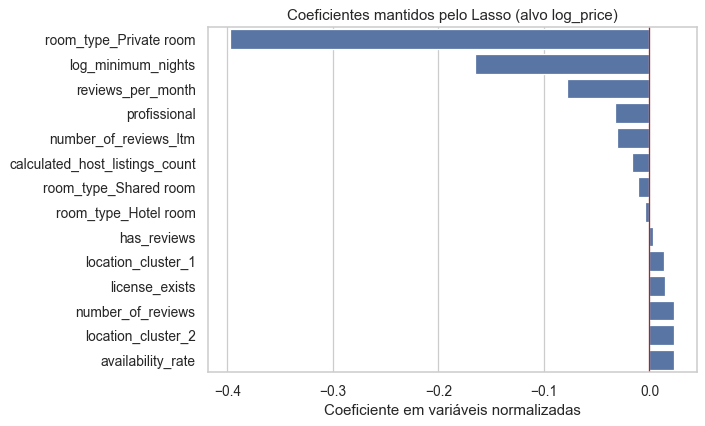

In [51]:
# Gráfico dos coeficientes Lasso não nulos.
lasso_nonzero = lasso_table[lasso_table["Estado"].str.startswith("Mantida")].copy()
fig, ax = plt.subplots(figsize=(8, max(4, 0.35 * len(lasso_nonzero))))
sns.barplot(
    data=lasso_nonzero.sort_values("Coeficiente_Lasso_scaled_log"),
    x="Coeficiente_Lasso_scaled_log",
    y="Variável",
    ax=ax,
    color="#4C72B0",
)
ax.axvline(0, color="firebrick", linewidth=1)
ax.set_title("Coeficientes mantidos pelo Lasso (alvo log_price)")
ax.set_xlabel("Coeficiente em variáveis normalizadas")
ax.set_ylabel("")
plt.tight_layout()
plt.savefig(OUTPUT_DIR / "fig_lasso_coefficients.png", dpi=140, bbox_inches="tight")
plt.show()

### 4.3.1 Lasso esparso pela regra 1-SE

O Lasso otimizado apenas por RMSE pode escolher uma penalização muito pequena e, por isso, manter todas as variáveis. Para estudar a seleção de variáveis, aplica-se também a regra **one-standard-error (1-SE)**: escolhe-se o maior `alpha` cujo RMSE médio em validação cruzada fica até um desvio-padrão do melhor RMSE. Esta variante sacrifica algum desempenho para ganhar parcimónia.

In [52]:
# Variante Lasso 1-SE para seleção de variáveis parcimoniosa.
lasso_alpha_grid = [0.0001, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.5, 1.0]
lasso_alpha_rows = []

for alpha in lasso_alpha_grid:
    estimator = log_target_regressor(Pipeline([
        ("scaler", StandardScaler()),
        ("model", Lasso(alpha=alpha, max_iter=30000, random_state=RANDOM_STATE)),
    ]))
    cv_scores_alpha = cross_validate(
        estimator,
        X_train,
        y_train,
        cv=CV,
        scoring={"RMSE": make_scorer(rmse, greater_is_better=False), "MAE": make_scorer(mean_absolute_error, greater_is_better=False), "R2": "r2"},
        n_jobs=1,
        error_score="raise",
    )
    lasso_alpha_rows.append({
        "alpha": alpha,
        "CV_RMSE": -cv_scores_alpha["test_RMSE"].mean(),
        "CV_RMSE_std": (-cv_scores_alpha["test_RMSE"]).std(),
        "CV_MAE": -cv_scores_alpha["test_MAE"].mean(),
        "CV_R2": cv_scores_alpha["test_R2"].mean(),
    })

lasso_alpha_diagnostics = pd.DataFrame(lasso_alpha_rows)
best_alpha_row = lasso_alpha_diagnostics.sort_values("CV_RMSE").iloc[0]
threshold_1se = best_alpha_row["CV_RMSE"] + best_alpha_row["CV_RMSE_std"]
eligible = lasso_alpha_diagnostics[lasso_alpha_diagnostics["CV_RMSE"] <= threshold_1se]
alpha_1se = eligible["alpha"].max()

lasso_sparse = log_target_regressor(Pipeline([
    ("scaler", StandardScaler()),
    ("model", Lasso(alpha=alpha_1se, max_iter=30000, random_state=RANDOM_STATE)),
]))
lasso_sparse.fit(X_train, y_train)
lasso_sparse_pred = lasso_sparse.predict(X_test)
lasso_sparse_metrics = regression_metrics(y_test, lasso_sparse_pred)

sparse_coef = lasso_sparse.regressor_.named_steps["model"].coef_
lasso_sparse_table = pd.DataFrame({
    "Variável": X_train.columns,
    "Coeficiente_Lasso_1SE_scaled_log": sparse_coef,
    "Abs_coef": np.abs(sparse_coef),
})
lasso_sparse_table["Estado"] = np.where(
    lasso_sparse_table["Abs_coef"] <= 1e-6,
    "Removida (coeficiente zero)",
    "Mantida"
)
lasso_sparse_table = lasso_sparse_table.sort_values("Abs_coef", ascending=False).reset_index(drop=True)

lasso_alpha_diagnostics.to_excel(OUTPUT_DIR / "lasso_alpha_1se_diagnostics.xlsx", index=False)
lasso_sparse_table.to_excel(OUTPUT_DIR / "lasso_sparse_1se_variable_selection.xlsx", index=False)

print("Melhor alpha por RMSE:", best_alpha_row["alpha"])
print(f"Threshold 1-SE de RMSE: {threshold_1se:.3f}")
print("Alpha 1-SE escolhido:", alpha_1se)
print("Métricas teste Lasso 1-SE:")
print(pd.Series(lasso_sparse_metrics).round(3).to_string())
print("\nVariáveis mantidas no Lasso 1-SE:")
print(lasso_sparse_table[lasso_sparse_table["Estado"].str.startswith("Mantida")]["Variável"].to_list())
print("\nVariáveis removidas no Lasso 1-SE:")
print(lasso_sparse_table[lasso_sparse_table["Estado"].str.startswith("Removida")]["Variável"].to_list())
display(lasso_alpha_diagnostics.round(4))
display(lasso_sparse_table.round(5))

Melhor alpha por RMSE: 0.0001
Threshold 1-SE de RMSE: 56.372
Alpha 1-SE escolhido: 0.05
Métricas teste Lasso 1-SE:
MAE        34.849
RMSE       57.447
MedAE      22.892
MAPE_%     32.605
WAPE_%     31.512
R2          0.231
MaxAE     452.120

Variáveis mantidas no Lasso 1-SE:
['room_type_Private room', 'log_minimum_nights', 'reviews_per_month']

Variáveis removidas no Lasso 1-SE:
['number_of_reviews_ltm', 'calculated_host_listings_count', 'number_of_reviews', 'availability_rate', 'license_exists', 'has_reviews', 'profissional', 'room_type_Shared room', 'room_type_Hotel room', 'location_cluster_1', 'location_cluster_2']


,alpha,CV_RMSE,CV_RMSE_std,CV_MAE,CV_R2
0,0.0001,54.0675,2.3046,34.3431,0.2857
1,0.0010,54.0791,2.3031,34.3289,0.2854
2,0.0050,54.1638,2.2970,34.3092,0.2831
3,0.0100,54.3170,2.2768,34.3255,0.2791
4,0.0500,55.7245,2.2302,34.9302,0.2412
5,0.1000,57.1456,2.3073,35.9643,0.2021
6,0.2000,59.7601,2.3494,38.4073,0.1273
7,0.5000,66.0098,2.2565,45.2444,-0.0650
8,1.0000,66.0098,2.2565,45.2444,-0.0650


,Variável,Coeficiente_Lasso_1SE_scaled_log,Abs_coef,Estado
0,room_type_Private room,-0.33980,0.33980,Mantida
1,log_minimum_nights,-0.09685,0.09685,Mantida
2,reviews_per_month,-0.01667,0.01667,Mantida
3,number_of_reviews_ltm,-0.00000,0.00000,Removida (coeficiente zero)
4,calculated_host_listings_count,-0.00000,0.00000,Removida (coeficiente zero)
5,number_of_reviews,-0.00000,0.00000,Removida (coeficiente zero)
6,availability_rate,0.00000,0.00000,Removida (coeficiente zero)
7,license_exists,0.00000,0.00000,Removida (coeficiente zero)
8,has_reviews,-0.00000,0.00000,Removida (coeficiente zero)
9,profissional,-0.00000,0.00000,Removida (coeficiente zero)


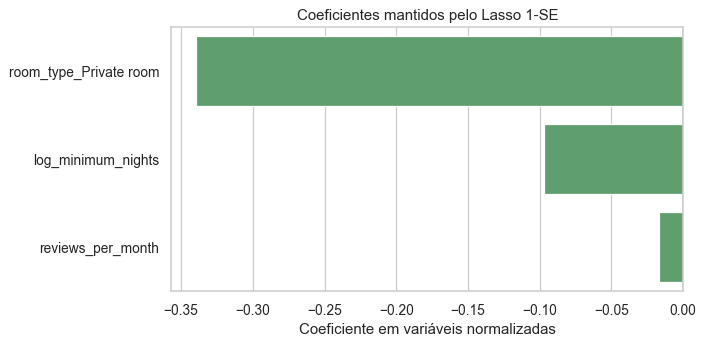

In [53]:
# Gráfico dos coeficientes do Lasso 1-SE.
lasso_sparse_nonzero = lasso_sparse_table[lasso_sparse_table["Estado"].str.startswith("Mantida")].copy()
fig, ax = plt.subplots(figsize=(8, max(4, 0.35 * len(lasso_sparse_nonzero))))
sns.barplot(
    data=lasso_sparse_nonzero.sort_values("Coeficiente_Lasso_1SE_scaled_log"),
    x="Coeficiente_Lasso_1SE_scaled_log",
    y="Variável",
    ax=ax,
    color="#55A868",
)
ax.axvline(0, color="firebrick", linewidth=1)
ax.set_title("Coeficientes mantidos pelo Lasso 1-SE")
ax.set_xlabel("Coeficiente em variáveis normalizadas")
ax.set_ylabel("")
plt.tight_layout()
plt.savefig(OUTPUT_DIR / "fig_lasso_sparse_1se_coefficients.png", dpi=140, bbox_inches="tight")
plt.show()

---
# 5. Validação dos pressupostos da regressão

Esta secção verifica os pressupostos clássicos nos modelos em que eles são metodologicamente relevantes. A validação é mais importante nos modelos lineares quando se pretende interpretar coeficientes. Nos modelos avançados, os pressupostos clássicos não são exigidos da mesma forma; nesses casos, o diagnóstico centra-se em validação cruzada, resíduos, calibração, erro por segmentos e risco de overfitting.

## 5.1 Função geral de diagnóstico dos pressupostos

A função `avaliar_pressupostos_modelo()` devolve uma linha de diagnóstico por modelo. Para modelos lineares e regularizados avalia linearidade, homocedasticidade, normalidade, independência, multicolinearidade e observações influentes. Para árvores, boosting e SVR, marca os pressupostos clássicos como não aplicáveis e resume a robustez preditiva.

In [54]:
PRESSUPOSTOS_DIR = OUTPUT_DIR / "assumption_diagnostics"
PRESSUPOSTOS_DIR.mkdir(exist_ok=True)

def classificar_p_value(p_value, alpha=0.05):
    if pd.isna(p_value):
        return "Não aplicável"
    return "Cumpre" if p_value > alpha else "Não cumpre"

def classificar_linearidade(rho_abs):
    if pd.isna(rho_abs):
        return "Não aplicável"
    if rho_abs < 0.10:
        return "Cumpre"
    if rho_abs < 0.20:
        return "Parcialmente"
    return "Não cumpre"

def classificar_dw(dw_value):
    if pd.isna(dw_value):
        return "Não aplicável"
    if 1.5 <= dw_value <= 2.5:
        return "Cumpre"
    if 1.2 <= dw_value < 1.5 or 2.5 < dw_value <= 2.8:
        return "Parcialmente"
    return "Não cumpre"

def classificar_vif(max_vif):
    if pd.isna(max_vif):
        return "Não aplicável"
    if max_vif <= 5:
        return "Cumpre"
    if max_vif <= 10:
        return "Parcialmente"
    return "Não cumpre"

def classificar_overfitting(train_rmse, test_rmse):
    if pd.isna(train_rmse) or pd.isna(test_rmse):
        return "Não aplicável"
    gap = test_rmse - train_rmse
    if gap <= 5:
        return "Cumpre"
    if gap <= 15:
        return "Parcialmente"
    return "Não cumpre"

def residuos_para_diagnostico(nome_modelo, y_true, y_pred):
    """Usa resíduos na escala log quando o modelo foi treinado com log(y)."""
    y_true = pd.Series(y_true).astype(float)
    y_pred = pd.Series(np.asarray(y_pred), index=y_true.index).astype(float)
    eps = 1e-9
    if "log(y)" in nome_modelo:
        fitted = np.log(np.maximum(y_pred, eps))
        residuals = np.log(y_true) - fitted
        escala = "log(price)"
    else:
        fitted = y_pred
        residuals = y_true - y_pred
        escala = "price"
    return fitted, residuals, escala

def avaliar_pressupostos_modelo(
    nome_modelo,
    modelo_ajustado,
    X_train,
    X_test,
    y_train,
    y_test,
    y_pred,
    tipo_modelo,
):
    """Avalia pressupostos clássicos quando aplicáveis e diagnóstico preditivo nos modelos avançados."""
    resultado = advanced_results[advanced_results["Modelo"].eq(nome_modelo)]
    train_rmse = float(resultado["Train_RMSE"].iloc[0]) if not resultado.empty else np.nan
    cv_rmse = float(resultado["CV_RMSE"].iloc[0]) if not resultado.empty else np.nan
    test_rmse = float(resultado["Test_RMSE"].iloc[0]) if not resultado.empty else np.nan
    test_r2 = float(resultado["Test_R2"].iloc[0]) if not resultado.empty else np.nan
    overfit_status = classificar_overfitting(train_rmse, test_rmse)

    tipo_lower = tipo_modelo.lower()
    pressupostos_classicos = tipo_lower in ["linear", "regularizado", "polinomial", "interações"]

    transformacoes = []
    if "log(y)" in nome_modelo:
        transformacoes.append("log(price)")
    if "Polinomial" in nome_modelo:
        transformacoes.append("termos polinomiais grau 2")
    if "Interações" in nome_modelo:
        transformacoes.append("interações grau 2")
    if tipo_lower == "regularizado":
        transformacoes.append("regularização")
    if not transformacoes:
        transformacoes.append("sem transformação do alvo")

    if not pressupostos_classicos:
        diagnostico = (
            f"CV RMSE={cv_rmse:.2f}; teste RMSE={test_rmse:.2f}; "
            f"gap treino-teste={test_rmse - train_rmse:.2f}."
        )
        conclusao = (
            "Pressupostos clássicos não aplicáveis; avaliar por desempenho fora da amostra, "
            "resíduos, calibração, erro por quantil, PDP/ICE/importância e overfitting."
        )
        return {
            "Modelo": nome_modelo,
            "Tipo de modelo": tipo_modelo,
            "Linearidade": "Não aplicável",
            "Homocedasticidade": "Não aplicável",
            "Normalidade dos resíduos": "Não aplicável",
            "Independência dos resíduos": "Não aplicável",
            "Multicolinearidade": "Não aplicável",
            "Observações influentes": "Não aplicável",
            "Data leakage evitado": "Cumpre",
            "Overfitting": overfit_status,
            "Pressupostos clássicos aplicáveis?": "Não",
            "Diagnóstico preditivo / robustez": diagnostico,
            "Transformações aplicadas": "; ".join(transformacoes),
            "Conclusão": conclusao,
            "BP_pvalue": np.nan,
            "Shapiro_pvalue": np.nan,
            "JarqueBera_pvalue": np.nan,
            "DurbinWatson": np.nan,
            "Max_VIF": np.nan,
            "Residual_Spearman_abs": np.nan,
        }

    fitted_diag, residuals_diag, escala_residual = residuos_para_diagnostico(nome_modelo, y_test, y_pred)
    residuals_clean = pd.Series(residuals_diag).replace([np.inf, -np.inf], np.nan).dropna()
    fitted_clean = pd.Series(fitted_diag).loc[residuals_clean.index]

    try:
        rho = stats.spearmanr(fitted_clean, residuals_clean, nan_policy="omit").correlation
        rho_abs = abs(float(rho))
    except Exception:
        rho_abs = np.nan

    try:
        exog_test = sm.add_constant(X_test.loc[residuals_clean.index], has_constant="add")
        bp_stat, bp_pvalue, _, _ = het_breuschpagan(residuals_clean, exog_test)
    except Exception:
        bp_pvalue = np.nan

    try:
        shapiro_sample = residuals_clean.sample(n=min(5000, len(residuals_clean)), random_state=RANDOM_STATE)
        shapiro_pvalue = float(stats.shapiro(shapiro_sample).pvalue)
    except Exception:
        shapiro_pvalue = np.nan

    try:
        jb_pvalue = float(stats.jarque_bera(residuals_clean).pvalue)
    except Exception:
        jb_pvalue = np.nan

    try:
        dw_value = float(durbin_watson(residuals_clean))
    except Exception:
        dw_value = np.nan

    try:
        max_vif = float(calcular_vif(X_train).replace([np.inf, -np.inf], np.nan)["VIF"].max())
    except Exception:
        max_vif = np.nan

    try:
        ols_influence = sm.OLS(np.log(y_train) if "log(y)" in nome_modelo else y_train, sm.add_constant(X_train, has_constant="add")).fit()
        cooks_after = pd.Series(ols_influence.get_influence().cooks_distance[0], index=X_train.index)
        n_cook_after = int((cooks_after > 4 / len(X_train)).sum())
        share_cook_after = n_cook_after / len(X_train)
        if share_cook_after <= 0.01:
            cook_status = "Cumpre"
        elif share_cook_after <= 0.05:
            cook_status = "Parcialmente"
        else:
            cook_status = "Não cumpre"
    except Exception:
        n_cook_after = np.nan
        share_cook_after = np.nan
        cook_status = "Parcialmente"

    normal_status = "Cumpre" if (shapiro_pvalue > 0.05 and jb_pvalue > 0.05) else "Não cumpre"
    if len(residuals_clean) > 1000 and normal_status == "Não cumpre":
        normal_status = "Parcialmente"

    conclusion_bits = []
    if "log(price)" in transformacoes:
        conclusion_bits.append("transformação logarítmica mitiga assimetria do alvo")
    if classificar_p_value(bp_pvalue) == "Não cumpre":
        conclusion_bits.append("heterocedasticidade persiste; usar interpretação cautelosa e erros robustos HC3")
    if normal_status != "Cumpre":
        conclusion_bits.append("normalidade dos resíduos não é plena, como esperado em amostra grande")
    if tipo_lower == "regularizado":
        conclusion_bits.append("regularização reduz instabilidade por multicolinearidade")
    if not conclusion_bits:
        conclusion_bits.append("diagnóstico global aceitável para uso preditivo/interpretativo cauteloso")

    return {
        "Modelo": nome_modelo,
        "Tipo de modelo": tipo_modelo,
        "Linearidade": classificar_linearidade(rho_abs),
        "Homocedasticidade": classificar_p_value(bp_pvalue),
        "Normalidade dos resíduos": normal_status,
        "Independência dos resíduos": classificar_dw(dw_value),
        "Multicolinearidade": classificar_vif(max_vif),
        "Observações influentes": cook_status,
        "Data leakage evitado": "Cumpre",
        "Overfitting": overfit_status,
        "Pressupostos clássicos aplicáveis?": "Sim",
        "Diagnóstico preditivo / robustez": f"CV RMSE={cv_rmse:.2f}; teste RMSE={test_rmse:.2f}; escala residual={escala_residual}.",
        "Transformações aplicadas": "; ".join(transformacoes),
        "Conclusão": "; ".join(conclusion_bits),
        "BP_pvalue": bp_pvalue,
        "Shapiro_pvalue": shapiro_pvalue,
        "JarqueBera_pvalue": jb_pvalue,
        "DurbinWatson": dw_value,
        "Max_VIF": max_vif,
        "Residual_Spearman_abs": rho_abs,
        "Cook_restante_n": n_cook_after,
        "Cook_restante_%": share_cook_after * 100 if not pd.isna(share_cook_after) else np.nan,
    }

## 5.2 Diagnóstico dos modelos lineares e regularizados

Os gráficos seguintes complementam os testes estatísticos. Em amostras grandes, testes como Shapiro-Wilk e Jarque-Bera tendem a rejeitar normalidade mesmo quando os desvios são moderados; por isso, a decisão final combina testes, gráficos e relevância prática.

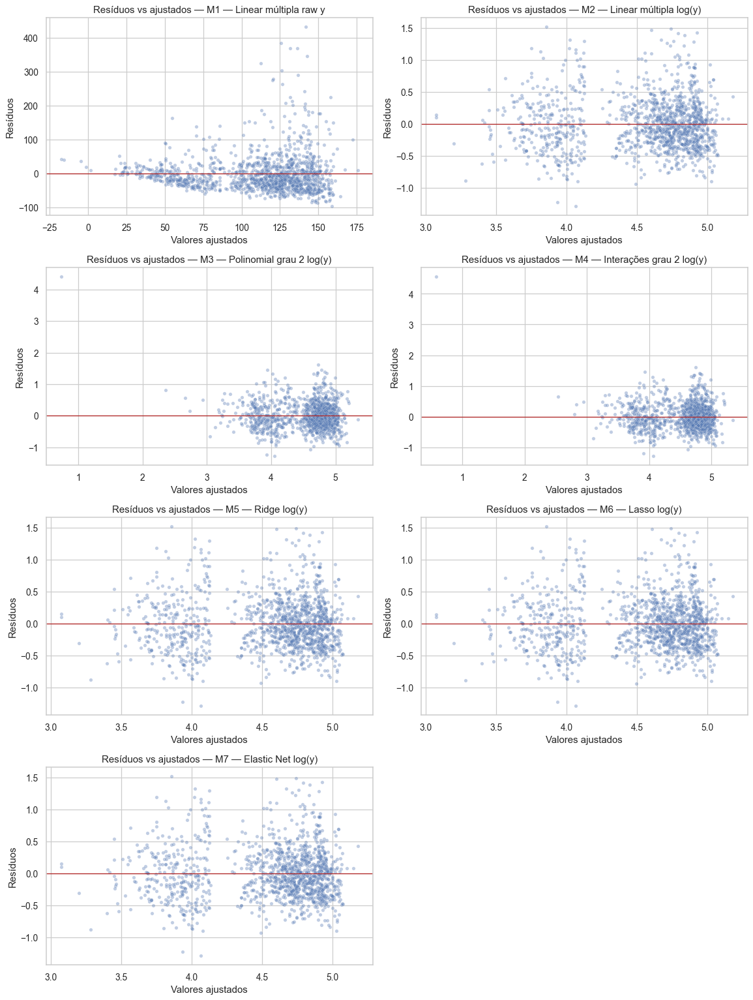

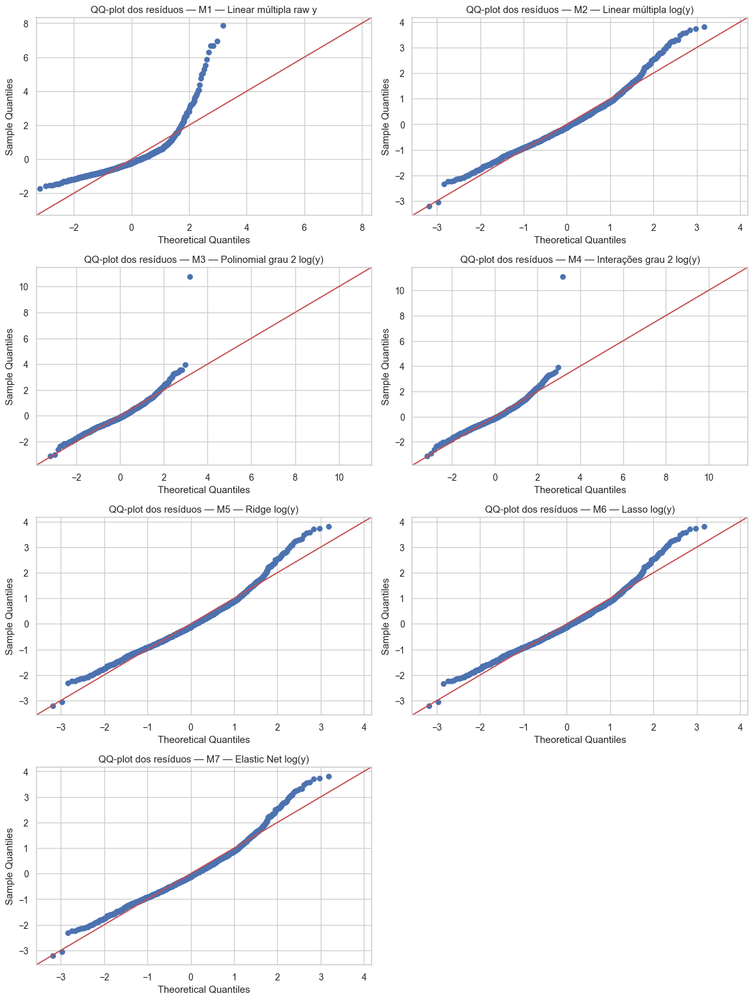

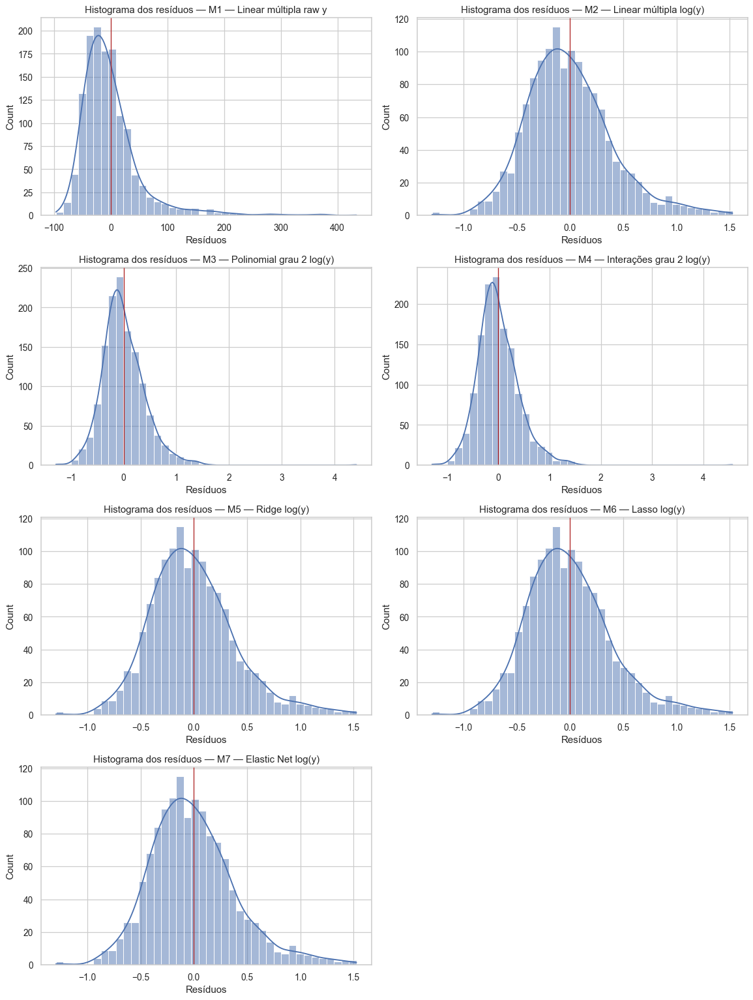

In [55]:
model_type_map = {
    "M1 — Linear múltipla raw y": "linear",
    "M2 — Linear múltipla log(y)": "linear",
    "M3 — Polinomial grau 2 log(y)": "polinomial",
    "M4 — Interações grau 2 log(y)": "interações",
    "M5 — Ridge log(y)": "regularizado",
    "M6 — Lasso log(y)": "regularizado",
    "M7 — Elastic Net log(y)": "regularizado",
    "M8 — Random Forest log(y)": "árvore",
    "M8b — Random Forest regularizado log(y)": "árvore",
    "M9 — HistGradientBoosting log(y)": "boosting",
    "M10 — SVR RBF log(y)": "SVR",
}

linear_diagnostic_names = [name for name, tipo in model_type_map.items() if tipo in ["linear", "polinomial", "interações", "regularizado"]]

residual_plot_rows = []
for name in linear_diagnostic_names:
    if name not in fitted_models:
        continue
    fitted_diag, residuals_diag, escala = residuos_para_diagnostico(name, y_test, test_predictions[name])
    tmp = pd.DataFrame({
        "Modelo": name,
        "Ajustado": fitted_diag,
        "Resíduo": residuals_diag,
        "Escala": escala,
    }).replace([np.inf, -np.inf], np.nan).dropna()
    residual_plot_rows.append(tmp)

linear_residuals_long = pd.concat(residual_plot_rows, ignore_index=True)
linear_residuals_long.to_excel(PRESSUPOSTOS_DIR / "linear_model_residuals_long.xlsx", index=False)

n_linear = len(linear_diagnostic_names)
ncols = 2
nrows = int(np.ceil(n_linear / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(13, 4.3 * nrows))
axes = np.array(axes).reshape(-1)
for ax, name in zip(axes, linear_diagnostic_names):
    data = linear_residuals_long[linear_residuals_long["Modelo"].eq(name)]
    sns.scatterplot(data=data, x="Ajustado", y="Resíduo", ax=ax, alpha=0.35, s=18)
    ax.axhline(0, color="firebrick", linewidth=1)
    ax.set_title(f"Resíduos vs ajustados — {name}")
    ax.set_xlabel("Valores ajustados")
    ax.set_ylabel("Resíduos")
for ax in axes[n_linear:]:
    ax.axis("off")
plt.tight_layout()
plt.savefig(PRESSUPOSTOS_DIR / "fig_residuals_vs_fitted_linear_models.png", dpi=140, bbox_inches="tight")
plt.show()

fig, axes = plt.subplots(nrows, ncols, figsize=(13, 4.3 * nrows))
axes = np.array(axes).reshape(-1)
for ax, name in zip(axes, linear_diagnostic_names):
    data = linear_residuals_long[linear_residuals_long["Modelo"].eq(name)]["Resíduo"].dropna()
    sm.qqplot(data, line="45", ax=ax, fit=True)
    ax.set_title(f"QQ-plot dos resíduos — {name}")
for ax in axes[n_linear:]:
    ax.axis("off")
plt.tight_layout()
plt.savefig(PRESSUPOSTOS_DIR / "fig_qqplots_linear_models.png", dpi=140, bbox_inches="tight")
plt.show()

fig, axes = plt.subplots(nrows, ncols, figsize=(13, 4.3 * nrows))
axes = np.array(axes).reshape(-1)
for ax, name in zip(axes, linear_diagnostic_names):
    data = linear_residuals_long[linear_residuals_long["Modelo"].eq(name)]["Resíduo"].dropna()
    sns.histplot(data, kde=True, bins=40, ax=ax, color="#4C72B0")
    ax.axvline(0, color="firebrick", linewidth=1)
    ax.set_title(f"Histograma dos resíduos — {name}")
    ax.set_xlabel("Resíduos")
for ax in axes[n_linear:]:
    ax.axis("off")
plt.tight_layout()
plt.savefig(PRESSUPOSTOS_DIR / "fig_residual_histograms_linear_models.png", dpi=140, bbox_inches="tight")
plt.show()

## 5.3 Transformações, Cook e erros-padrão robustos

A transformação `log(price)` é justificada pela forte assimetria do alvo. A variável `minimum_nights` também é usada em escala logarítmica. A distância de Cook foi usada para reduzir a influência desproporcional de observações extremas nos modelos lineares. Quando persiste heterocedasticidade, os erros-padrão robustos HC3 são calculados para a regressão linear interpretativa em `log(price)`.

,Cenário,N_modelação,RMSE_teste,MAE_teste,R2_teste,WAPE_%
0,Sem remoção por Cook,6979,581.714,88.650,0.022,53.854
1,Com remoção por Cook,6700,55.994,34.155,0.270,30.885


,Variável,Coeficiente,Erro_padrão_HC3,t_HC3,p_value_HC3
0,const,5.08173,0.02925,173.72991,0.00000
10,room_type_Private room,-0.92610,0.01649,-56.16138,0.00000
4,log_minimum_nights,-0.19779,0.00695,-28.47071,0.00000
1,reviews_per_month,-0.04991,0.00585,-8.52606,0.00000
12,room_type_Hotel room,-0.16338,0.02009,-8.13425,0.00000
14,location_cluster_2,0.34732,0.04799,7.23790,0.00000
6,availability_rate,0.07702,0.01827,4.21472,0.00003
9,profissional,-0.07419,0.01982,-3.74242,0.00018
3,number_of_reviews,0.00026,0.00007,3.58590,0.00034
2,number_of_reviews_ltm,-0.00178,0.00059,-3.02336,0.00250


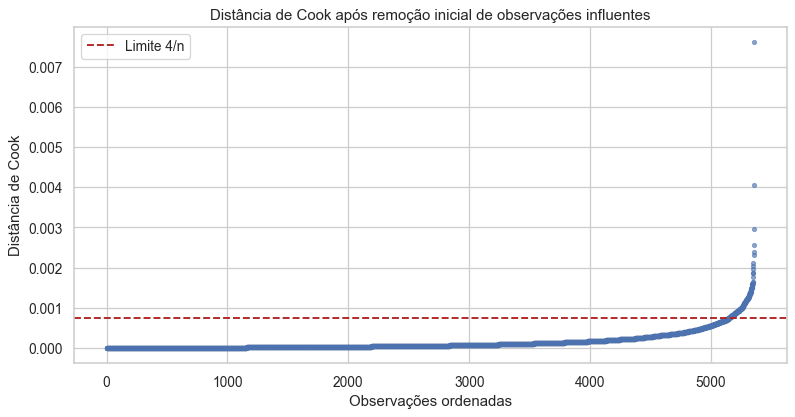

,Indicador,Valor
0,Limite 4/n,0.00075
1,N observações acima do limite,207.00000
2,% treino acima do limite,3.86194


In [56]:
# Comparação simples da regressão logarítmica com e sem remoção por Cook.
strata_vif = pd.qcut(np.log(y_price_all.loc[X_vif.index]), q=5, labels=False, duplicates="drop")
X_train_vif, X_test_vif, y_train_vif, y_test_vif = train_test_split(
    X_vif,
    y_price_all.loc[X_vif.index],
    test_size=0.2,
    random_state=RANDOM_STATE,
    stratify=strata_vif,
)

linear_log_sem_cook = clone(linear_log)
linear_log_sem_cook.fit(X_train_vif, y_train_vif)
pred_sem_cook = linear_log_sem_cook.predict(X_test_vif)
metrics_sem_cook = regression_metrics(y_test_vif, pred_sem_cook)

metrics_com_cook = advanced_results.loc[
    advanced_results["Modelo"].eq("M2 — Linear múltipla log(y)")
].iloc[0]

cook_comparison = pd.DataFrame([
    {
        "Cenário": "Sem remoção por Cook",
        "N_modelação": len(X_vif),
        "RMSE_teste": metrics_sem_cook["RMSE"],
        "MAE_teste": metrics_sem_cook["MAE"],
        "R2_teste": metrics_sem_cook["R2"],
        "WAPE_%": metrics_sem_cook["WAPE_%"],
    },
    {
        "Cenário": "Com remoção por Cook",
        "N_modelação": len(X_model),
        "RMSE_teste": metrics_com_cook["Test_RMSE"],
        "MAE_teste": metrics_com_cook["Test_MAE"],
        "R2_teste": metrics_com_cook["Test_R2"],
        "WAPE_%": metrics_com_cook["Test_WAPE_%"],
    },
])
cook_comparison.to_excel(PRESSUPOSTOS_DIR / "cook_removal_comparison_linear_log.xlsx", index=False)
display(cook_comparison.round(3))

# Erros-padrão robustos HC3 para o modelo linear interpretativo em log(price).
ols_log_hc3 = sm.OLS(np.log(y_train), sm.add_constant(X_train, has_constant="add")).fit(cov_type="HC3")
hc3_table = pd.DataFrame({
    "Variável": ols_log_hc3.params.index,
    "Coeficiente": ols_log_hc3.params.values,
    "Erro_padrão_HC3": ols_log_hc3.bse.values,
    "t_HC3": ols_log_hc3.tvalues.values,
    "p_value_HC3": ols_log_hc3.pvalues.values,
}).sort_values("p_value_HC3")
hc3_table.to_excel(PRESSUPOSTOS_DIR / "ols_log_hc3_coefficients.xlsx", index=False)
display(hc3_table.head(12).round(5))

# Distância de Cook restante após a limpeza global.
ols_after_cook = sm.OLS(np.log(y_train), sm.add_constant(X_train, has_constant="add")).fit()
cook_after = pd.Series(ols_after_cook.get_influence().cooks_distance[0], index=X_train.index, name="cooks_distance")
cook_after_limit = 4 / len(X_train)
cook_after_summary = pd.DataFrame({
    "Indicador": ["Limite 4/n", "N observações acima do limite", "% treino acima do limite"],
    "Valor": [cook_after_limit, int((cook_after > cook_after_limit).sum()), float((cook_after > cook_after_limit).mean() * 100)],
})
cook_after_summary.to_excel(PRESSUPOSTOS_DIR / "cook_distance_after_filter_summary.xlsx", index=False)

fig, ax = plt.subplots(figsize=(9, 4.8))
ax.scatter(np.arange(len(cook_after)), cook_after.sort_values().values, s=10, alpha=0.6)
ax.axhline(cook_after_limit, color="firebrick", linestyle="--", label="Limite 4/n")
ax.set_title("Distância de Cook após remoção inicial de observações influentes")
ax.set_xlabel("Observações ordenadas")
ax.set_ylabel("Distância de Cook")
ax.legend()
plt.tight_layout()
plt.savefig(PRESSUPOSTOS_DIR / "fig_cook_distance_after_filter.png", dpi=140, bbox_inches="tight")
plt.show()

display(cook_after_summary.round(5))

## 5.4 Correção da heterocedasticidade nos modelos lineares

A secção anterior mostrou que a homocedasticidade não foi cumprida nos modelos lineares. Aqui são testadas correções efetivas: transformações da variável dependente, transformações logarítmicas de preditores assimétricos, Weighted Least Squares e regressão robusta. Os erros-padrão robustos HC3 são mantidos apenas como correção inferencial, pois não alteram as previsões nem removem a heterocedasticidade dos resíduos.

### 5.4.1 Diagnóstico inicial da heterocedasticidade

Para cada modelo linear ou regularizado, são recalculados o teste de Breusch-Pagan, os resíduos versus valores ajustados, a distribuição dos resíduos e a relação entre resíduos absolutos e valores ajustados.

,Modelo,Escala_residual,Breusch_Pagan_stat,Breusch_Pagan_pvalue,Homocedasticidade,RMSE,MAE,R2,WAPE
0,M1 — Linear múltipla raw y,price,26.26373,0.02396,Não cumpre,55.28828,36.22323,0.28805,32.75466
1,M2 — Linear múltipla log(y),log(price),48.19937,0.00001,Não cumpre,55.99448,34.15534,0.26975,30.88478
2,M3 — Polinomial grau 2 log(y),log(price),221.93151,0.00000,Não cumpre,55.06873,33.48962,0.29370,30.28280
3,M4 — Interações grau 2 log(y),log(price),224.15717,0.00000,Não cumpre,55.33569,33.55523,0.28683,30.34213
4,M5 — Ridge log(y),log(price),48.19938,0.00001,Não cumpre,55.99448,34.15533,0.26975,30.88477
5,M6 — Lasso log(y),log(price),48.20149,0.00001,Não cumpre,55.99544,34.15550,0.26972,30.88492
6,M7 — Elastic Net log(y),log(price),48.20036,0.00001,Não cumpre,55.99477,34.15516,0.26974,30.88462


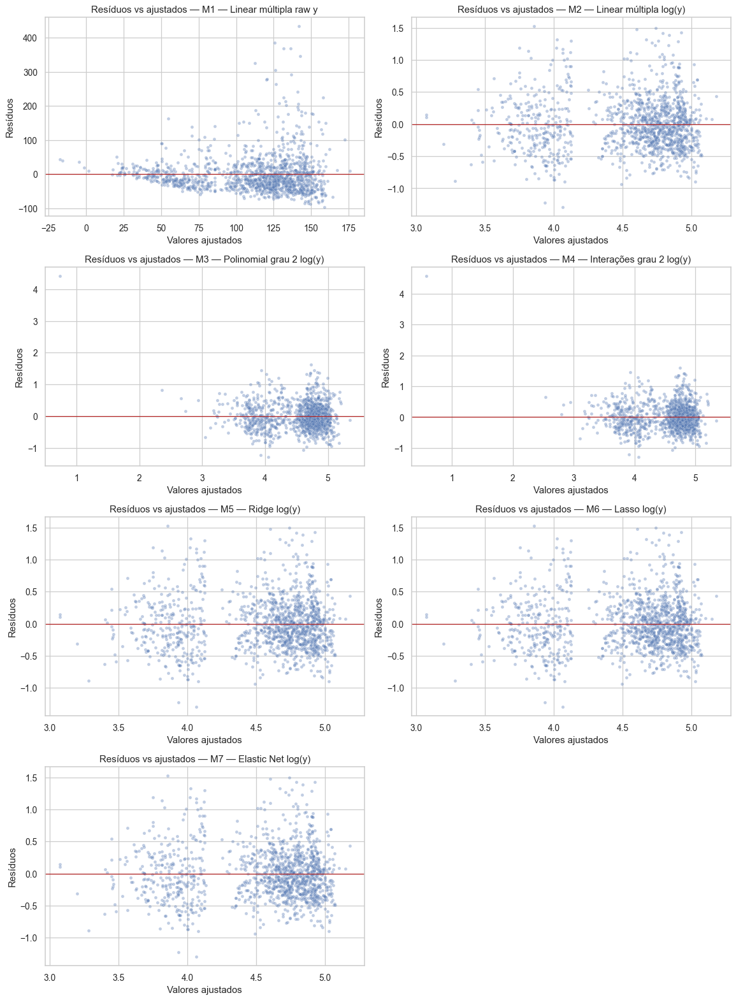

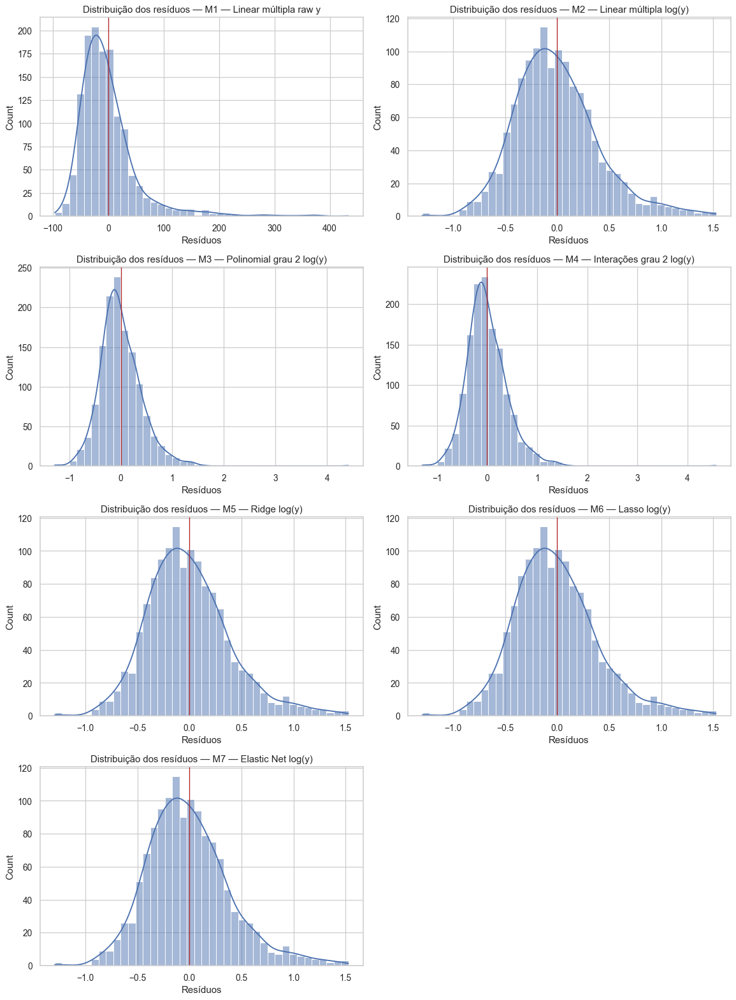

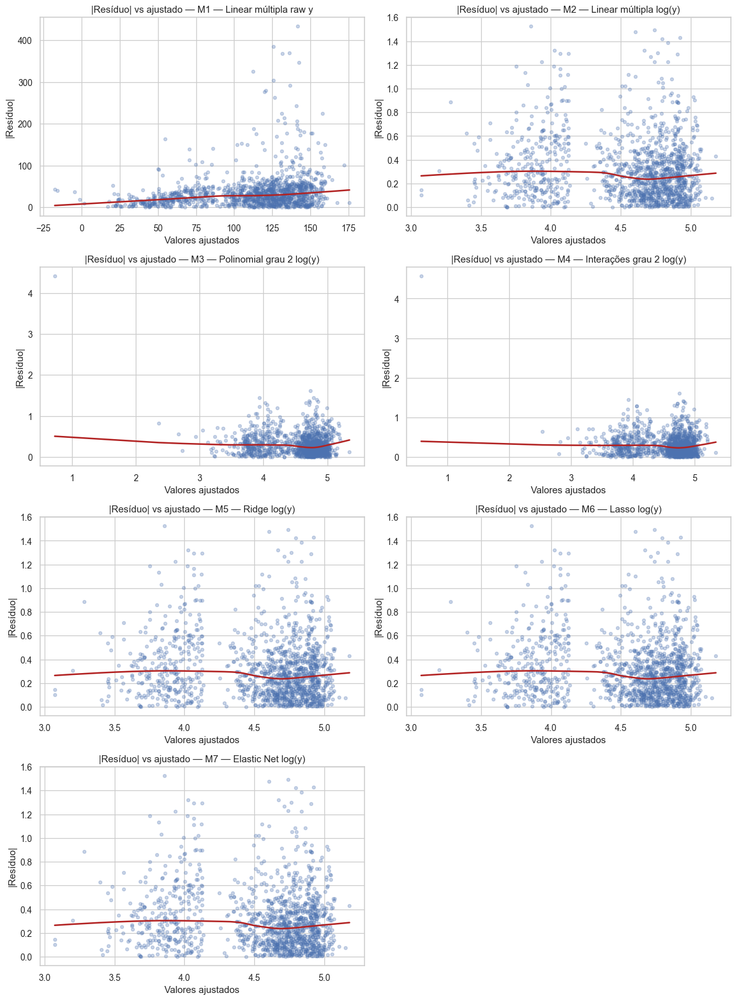

In [57]:
HET_DIR = OUTPUT_DIR / "heteroscedasticity_corrections"
HET_DIR.mkdir(exist_ok=True)

linear_hetero_models = [
    "M1 — Linear múltipla raw y",
    "M2 — Linear múltipla log(y)",
    "M3 — Polinomial grau 2 log(y)",
    "M4 — Interações grau 2 log(y)",
    "M5 — Ridge log(y)",
    "M6 — Lasso log(y)",
    "M7 — Elastic Net log(y)",
]
linear_hetero_models = [name for name in linear_hetero_models if name in fitted_models]

def bp_diagnostic_from_residuals(residuals, X_exog):
    residuals = pd.Series(residuals).replace([np.inf, -np.inf], np.nan).dropna()
    X_exog = X_exog.loc[residuals.index].apply(pd.to_numeric, errors="coerce")
    X_exog = sm.add_constant(X_exog, has_constant="add")
    stat, p_value, f_stat, f_pvalue = het_breuschpagan(residuals, X_exog)
    return float(stat), float(p_value), float(f_stat), float(f_pvalue)

def status_homocedasticidade(p_value):
    if pd.isna(p_value):
        return "Não aplicável"
    return "Cumpre" if p_value > 0.05 else "Não cumpre"

initial_hetero_rows = []
initial_residual_rows = []
for name in linear_hetero_models:
    fitted_diag, residuals_diag, escala = residuos_para_diagnostico(name, y_test, test_predictions[name])
    residuals_diag = pd.Series(residuals_diag, index=y_test.index)
    fitted_diag = pd.Series(fitted_diag, index=y_test.index)
    bp_stat, bp_p, bp_f, bp_fp = bp_diagnostic_from_residuals(residuals_diag, X_test)
    metrics_row = advanced_results[advanced_results["Modelo"].eq(name)].iloc[0]
    initial_hetero_rows.append({
        "Modelo": name,
        "Escala_residual": escala,
        "Breusch_Pagan_stat": bp_stat,
        "Breusch_Pagan_pvalue": bp_p,
        "Homocedasticidade": status_homocedasticidade(bp_p),
        "RMSE": metrics_row["Test_RMSE"],
        "MAE": metrics_row["Test_MAE"],
        "R2": metrics_row["Test_R2"],
        "WAPE": metrics_row["Test_WAPE_%"],
    })
    initial_residual_rows.append(pd.DataFrame({
        "Modelo": name,
        "Ajustado": fitted_diag,
        "Resíduo": residuals_diag,
        "Resíduo_absoluto": np.abs(residuals_diag),
        "Escala": escala,
    }))

df_hetero_inicial = pd.DataFrame(initial_hetero_rows)
df_hetero_inicial.to_excel(HET_DIR / "initial_heteroscedasticity_diagnostics.xlsx", index=False)
hetero_initial_residuals = pd.concat(initial_residual_rows, ignore_index=True)
hetero_initial_residuals.to_excel(HET_DIR / "initial_residuals_linear_models.xlsx", index=False)
display(df_hetero_inicial.round(5))

n_models_hetero = len(linear_hetero_models)
ncols = 2
nrows = int(np.ceil(n_models_hetero / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(13, 4.4 * nrows))
axes = np.array(axes).reshape(-1)
for ax, name in zip(axes, linear_hetero_models):
    data = hetero_initial_residuals[hetero_initial_residuals["Modelo"].eq(name)]
    sns.scatterplot(data=data, x="Ajustado", y="Resíduo", ax=ax, s=16, alpha=0.35)
    ax.axhline(0, color="firebrick", linewidth=1)
    ax.set_title(f"Resíduos vs ajustados — {name}")
    ax.set_xlabel("Valores ajustados")
    ax.set_ylabel("Resíduos")
for ax in axes[n_models_hetero:]:
    ax.axis("off")
plt.tight_layout()
plt.savefig(HET_DIR / "fig_initial_residuals_vs_fitted_linear_models.png", dpi=140, bbox_inches="tight")
plt.show()

fig, axes = plt.subplots(nrows, ncols, figsize=(13, 4.4 * nrows))
axes = np.array(axes).reshape(-1)
for ax, name in zip(axes, linear_hetero_models):
    data = hetero_initial_residuals[hetero_initial_residuals["Modelo"].eq(name)]
    sns.histplot(data["Resíduo"], kde=True, bins=40, ax=ax, color="#4C72B0")
    ax.axvline(0, color="firebrick", linewidth=1)
    ax.set_title(f"Distribuição dos resíduos — {name}")
    ax.set_xlabel("Resíduos")
for ax in axes[n_models_hetero:]:
    ax.axis("off")
plt.tight_layout()
plt.savefig(HET_DIR / "fig_initial_residual_distributions_linear_models.png", dpi=140, bbox_inches="tight")
plt.show()

fig, axes = plt.subplots(nrows, ncols, figsize=(13, 4.4 * nrows))
axes = np.array(axes).reshape(-1)
for ax, name in zip(axes, linear_hetero_models):
    data = hetero_initial_residuals[hetero_initial_residuals["Modelo"].eq(name)]
    sns.regplot(
        data=data,
        x="Ajustado",
        y="Resíduo_absoluto",
        lowess=True,
        scatter_kws={"s": 16, "alpha": 0.30},
        line_kws={"color": "firebrick", "linewidth": 2},
        ax=ax,
    )
    ax.set_title(f"|Resíduo| vs ajustado — {name}")
    ax.set_xlabel("Valores ajustados")
    ax.set_ylabel("|Resíduo|")
for ax in axes[n_models_hetero:]:
    ax.axis("off")
plt.tight_layout()
plt.savefig(HET_DIR / "fig_initial_abs_residuals_vs_fitted_linear_models.png", dpi=140, bbox_inches="tight")
plt.show()

### 5.4.2 Transformações do alvo e dos preditores assimétricos

Foram testadas quatro escalas da variável dependente: `price`, `log(price)`, `log1p(price)` e `sqrt(price)`. Também foi testada uma versão com preditores assimétricos transformados por `log1p`, quando a transformação é estatisticamente justificável por caudas pesadas ou variância crescente dos resíduos.

,Modelo,Transformação,Transformação dos preditores,Método de correção,Breusch-Pagan p-value,Homocedasticidade,RMSE,MAE,R²,WAPE,Decisão,Justificação
7,Regressão linear,sqrt(price),preditores log1p assimétricos,OLS transformado,0.17676,Cumpre,55.32522,34.36066,0.28710,31.07044,Corrigido de forma aceitável,compressão moderada da cauda direita; log1p ap...
4,Regressão linear,price,preditores log1p assimétricos,OLS transformado,0.09670,Cumpre,55.20057,35.75006,0.29031,32.32680,Corrigido de forma aceitável,sem transformação do alvo; log1p aplicado a nu...
0,Regressão linear,price,preditores atuais,OLS transformado,0.02396,Não cumpre,55.27098,36.19395,0.28850,32.72818,Melhorou parcialmente,sem transformação do alvo; mínimos já em log; ...
3,Regressão linear,sqrt(price),preditores atuais,OLS transformado,0.01395,Não cumpre,55.37159,34.77301,0.28591,31.44330,Melhorou parcialmente,compressão moderada da cauda direita; mínimos ...
6,Regressão linear,log1p(price),preditores log1p assimétricos,OLS transformado,0.00378,Não cumpre,55.93453,33.80836,0.27131,30.57102,Melhorou parcialmente,variante logarítmica robusta a valores próximo...
5,Regressão linear,log(price),preditores log1p assimétricos,OLS transformado,0.00198,Não cumpre,55.95205,33.80554,0.27086,30.56848,Melhorou parcialmente,reduz assimetria multiplicativa e caudas pesad...
2,Regressão linear,log1p(price),preditores atuais,OLS transformado,0.00003,Não cumpre,55.97709,34.15983,0.27020,30.88884,Melhorou parcialmente,variante logarítmica robusta a valores próximo...
1,Regressão linear,log(price),preditores atuais,OLS transformado,0.00001,Não cumpre,55.99448,34.15534,0.26975,30.88478,Melhorou parcialmente,reduz assimetria multiplicativa e caudas pesad...


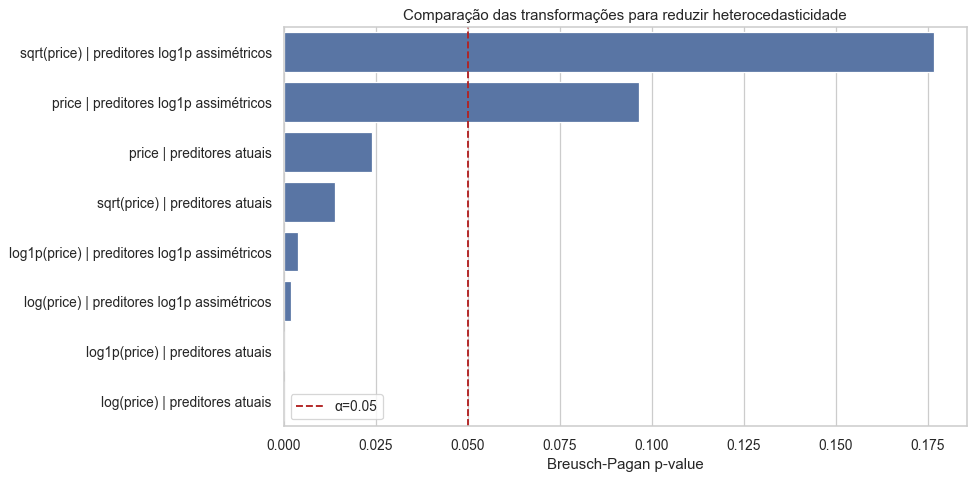

In [58]:
def make_log_feature_matrix(X):
    """Aplica log1p a preditores assimétricos ainda em escala original."""
    X_new = X.copy()
    transformed = []
    for col in ["number_of_reviews", "reviews_per_month", "number_of_reviews_ltm", "calculated_host_listings_count"]:
        if col in X_new.columns:
            X_new[col] = np.log1p(X_new[col].clip(lower=0))
            transformed.append(col)
    # minimum_nights já entra no modelo como log_minimum_nights.
    return X_new, transformed

X_train_logfeat, transformed_predictors = make_log_feature_matrix(X_train)
X_test_logfeat, _ = make_log_feature_matrix(X_test)

target_transformations = {
    "price": {
        "transform": lambda y: np.asarray(y, dtype=float),
        "inverse": lambda z: np.asarray(z, dtype=float),
        "description": "sem transformação do alvo",
    },
    "log(price)": {
        "transform": lambda y: np.log(np.asarray(y, dtype=float)),
        "inverse": lambda z: np.exp(np.asarray(z, dtype=float)),
        "description": "reduz assimetria multiplicativa e caudas pesadas",
    },
    "log1p(price)": {
        "transform": lambda y: np.log1p(np.asarray(y, dtype=float)),
        "inverse": lambda z: np.expm1(np.asarray(z, dtype=float)),
        "description": "variante logarítmica robusta a valores próximos de zero",
    },
    "sqrt(price)": {
        "transform": lambda y: np.sqrt(np.asarray(y, dtype=float)),
        "inverse": lambda z: np.square(np.asarray(z, dtype=float)),
        "description": "compressão moderada da cauda direita",
    },
}

def avaliar_linear_transformado(label, Xtr, Xte, ytr, yte, target_name, method="OLS", weights=None):
    transform = target_transformations[target_name]["transform"]
    inverse = target_transformations[target_name]["inverse"]
    ytr_t = pd.Series(transform(ytr), index=ytr.index)
    Xtr_c = sm.add_constant(Xtr, has_constant="add")
    Xte_c = sm.add_constant(Xte, has_constant="add")
    if method == "WLS":
        fit = sm.WLS(ytr_t, Xtr_c, weights=weights).fit()
    else:
        fit = sm.OLS(ytr_t, Xtr_c).fit()
    pred_t = pd.Series(fit.predict(Xte_c), index=yte.index)
    pred_price = pd.Series(np.maximum(inverse(pred_t), 1e-9), index=yte.index)
    residual_t = pd.Series(transform(yte), index=yte.index) - pred_t
    bp_stat, bp_p, _, _ = bp_diagnostic_from_residuals(residual_t, Xte)
    metrics = regression_metrics(yte, pred_price)
    return fit, pred_t, pred_price, residual_t, bp_stat, bp_p, metrics

correction_rows = []
correction_residual_rows = []

baseline_bp = df_hetero_inicial.loc[
    df_hetero_inicial["Modelo"].eq("M2 — Linear múltipla log(y)"),
    "Breusch_Pagan_pvalue",
].iloc[0]

for feature_variant, Xtr, Xte, feature_note in [
    ("preditores atuais", X_train, X_test, "mínimos já em log; restantes em escala original"),
    ("preditores log1p assimétricos", X_train_logfeat, X_test_logfeat, "log1p aplicado a " + ", ".join(transformed_predictors)),
]:
    for target_name in ["price", "log(price)", "log1p(price)", "sqrt(price)"]:
        fit, pred_t, pred_price, residual_t, bp_stat, bp_p, metrics = avaliar_linear_transformado(
            label="OLS",
            Xtr=Xtr,
            Xte=Xte,
            ytr=y_train,
            yte=y_test,
            target_name=target_name,
            method="OLS",
        )
        decision = "Corrigido de forma aceitável" if bp_p > 0.05 else (
            "Melhorou parcialmente" if bp_p > baseline_bp else "Mantido apenas para interpretação cautelosa"
        )
        correction_rows.append({
            "Modelo": "Regressão linear",
            "Transformação": target_name,
            "Transformação dos preditores": feature_variant,
            "Método de correção": "OLS transformado",
            "Breusch-Pagan p-value": bp_p,
            "Homocedasticidade": status_homocedasticidade(bp_p),
            "RMSE": metrics["RMSE"],
            "MAE": metrics["MAE"],
            "R²": metrics["R2"],
            "WAPE": metrics["WAPE_%"],
            "Decisão": decision,
            "Justificação": f"{target_transformations[target_name]['description']}; {feature_note}",
        })
        correction_residual_rows.append(pd.DataFrame({
            "Modelo": "Regressão linear",
            "Transformação": target_name,
            "Transformação dos preditores": feature_variant,
            "Método": "OLS transformado",
            "Ajustado_transformado": pred_t,
            "Resíduo_transformado": residual_t,
            "Resíduo_abs_transformado": np.abs(residual_t),
        }))

df_transform_comparison = pd.DataFrame(correction_rows)
df_transform_comparison.to_excel(HET_DIR / "target_and_predictor_transform_comparison.xlsx", index=False)
hetero_correction_residuals = pd.concat(correction_residual_rows, ignore_index=True)
hetero_correction_residuals.to_excel(HET_DIR / "correction_residuals_transformed_ols.xlsx", index=False)
display(df_transform_comparison.sort_values("Breusch-Pagan p-value", ascending=False).round(5))

fig, ax = plt.subplots(figsize=(11, 5.5))
plot_data = df_transform_comparison.copy()
plot_data["Configuração"] = plot_data["Transformação"] + " | " + plot_data["Transformação dos preditores"]
sns.barplot(data=plot_data.sort_values("Breusch-Pagan p-value", ascending=False), x="Breusch-Pagan p-value", y="Configuração", ax=ax, color="#4C72B0")
ax.axvline(0.05, color="firebrick", linestyle="--", label="α=0.05")
ax.set_title("Comparação das transformações para reduzir heterocedasticidade")
ax.set_xlabel("Breusch-Pagan p-value")
ax.set_ylabel("")
ax.legend()
plt.tight_layout()
plt.savefig(HET_DIR / "fig_target_predictor_transform_bp_comparison.png", dpi=140, bbox_inches="tight")
plt.show()

### 5.4.3 Weighted Least Squares e regressão robusta

O Weighted Least Squares estima pesos inversamente proporcionais à variância condicional dos resíduos. A regressão robusta procura reduzir a influência de observações com erro elevado. Estes modelos são comparados com OLS para verificar se a heterocedasticidade é efetivamente reduzida.

,Modelo,Transformação,Transformação dos preditores,Método de correção,Breusch-Pagan p-value,Homocedasticidade,RMSE,MAE,R²,WAPE,Decisão,Justificação
0,RANSACRegressor,sqrt(price),preditores log1p assimétricos,Regressão robusta,0.24075,Cumpre,56.09694,33.54444,0.26707,30.33238,Corrigido de forma aceitável,Modelo robusto reduz influência de observações...
1,HuberRegressor,sqrt(price),preditores log1p assimétricos,Regressão robusta,0.22064,Cumpre,56.38634,33.45514,0.25949,30.25163,Corrigido de forma aceitável,Modelo robusto reduz influência de observações...
2,QuantileRegressor_mediana,sqrt(price),preditores log1p assimétricos,Regressão robusta,0.21064,Cumpre,56.82427,33.39197,0.24795,30.19450,Corrigido de forma aceitável,Modelo robusto reduz influência de observações...
3,Regressão linear,sqrt(price),preditores log1p assimétricos,OLS transformado,0.17676,Cumpre,55.32522,34.36066,0.28710,31.07044,Corrigido de forma aceitável,compressão moderada da cauda direita; log1p ap...
4,Regressão linear com HC3,sqrt(price),preditores log1p assimétricos,Erros-padrão robustos HC3,0.17676,Cumpre,55.32522,34.36066,0.28710,31.07044,Correção inferencial; previsões/resíduos inalt...,"HC3 corrige inferência dos coeficientes, mas n..."
5,Regressão linear ponderada,sqrt(price),preditores log1p assimétricos,Weighted Least Squares,0.16405,Cumpre,55.36968,34.41078,0.28596,31.11576,Corrigido de forma aceitável,WLS com pesos inversamente proporcionais à var...
6,Regressão linear,price,preditores log1p assimétricos,OLS transformado,0.09670,Cumpre,55.20057,35.75006,0.29031,32.32680,Corrigido de forma aceitável,sem transformação do alvo; log1p aplicado a nu...
7,Regressão linear,price,preditores atuais,OLS transformado,0.02396,Não cumpre,55.27098,36.19395,0.28850,32.72818,Melhorou parcialmente,sem transformação do alvo; mínimos já em log; ...
8,Regressão linear,sqrt(price),preditores atuais,OLS transformado,0.01395,Não cumpre,55.37159,34.77301,0.28591,31.44330,Melhorou parcialmente,compressão moderada da cauda direita; mínimos ...
9,Regressão linear,log1p(price),preditores log1p assimétricos,OLS transformado,0.00378,Não cumpre,55.93453,33.80836,0.27131,30.57102,Melhorou parcialmente,variante logarítmica robusta a valores próximo...


,Variável,Coef_OLS,Coef_WLS,Diferença_absoluta
0,const,12.64838,12.45608,0.19230
9,profissional,-0.47419,-0.55910,0.08491
1,reviews_per_month,-0.73905,-0.65515,0.08390
8,has_reviews,0.07029,0.14992,0.07963
5,calculated_host_listings_count,-0.00720,0.04733,0.05453
14,location_cluster_2,1.69929,1.75020,0.05091
7,license_exists,0.15167,0.19039,0.03872
10,room_type_Private room,-4.04535,-4.01129,0.03406
12,room_type_Hotel room,-1.12816,-1.09418,0.03398
6,availability_rate,0.39002,0.41886,0.02884


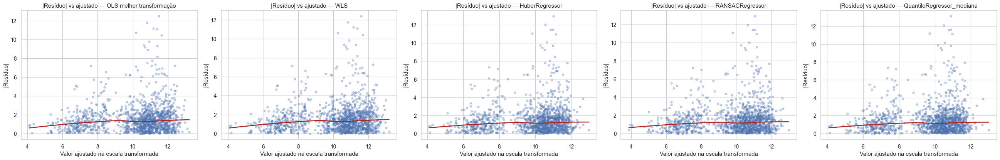

In [59]:
# Escolher a melhor configuração transformada pelo maior p-value de Breusch-Pagan.
best_transform_row = df_transform_comparison.sort_values("Breusch-Pagan p-value", ascending=False).iloc[0]
best_target = best_transform_row["Transformação"]
use_log_features = best_transform_row["Transformação dos preditores"] == "preditores log1p assimétricos"
Xtr_best = X_train_logfeat if use_log_features else X_train
Xte_best = X_test_logfeat if use_log_features else X_test

# OLS base na melhor transformação, usado para modelar a variância dos resíduos.
ols_best_fit, ols_best_pred_t, ols_best_pred_price, ols_best_resid_t, _, _, _ = avaliar_linear_transformado(
    label="OLS_best",
    Xtr=Xtr_best,
    Xte=Xte_best,
    ytr=y_train,
    yte=y_test,
    target_name=best_target,
    method="OLS",
)

y_train_t_best = pd.Series(target_transformations[best_target]["transform"](y_train), index=y_train.index)
Xtr_best_c = sm.add_constant(Xtr_best, has_constant="add")
train_pred_t = pd.Series(ols_best_fit.predict(Xtr_best_c), index=y_train.index)
train_resid_t = y_train_t_best - train_pred_t

variance_model = sm.OLS(
    np.log(np.square(train_resid_t) + 1e-8),
    sm.add_constant(train_pred_t.rename("fitted"), has_constant="add"),
).fit()
estimated_variance = np.exp(variance_model.predict(sm.add_constant(train_pred_t.rename("fitted"), has_constant="add")))
wls_weights = 1 / np.clip(estimated_variance, np.percentile(estimated_variance, 1), np.percentile(estimated_variance, 99))

wls_fit, wls_pred_t, wls_pred_price, wls_resid_t, wls_bp_stat, wls_bp_p, wls_metrics = avaliar_linear_transformado(
    label="WLS_best",
    Xtr=Xtr_best,
    Xte=Xte_best,
    ytr=y_train,
    yte=y_test,
    target_name=best_target,
    method="WLS",
    weights=wls_weights,
)

correction_rows.append({
    "Modelo": "Regressão linear ponderada",
    "Transformação": best_target,
    "Transformação dos preditores": best_transform_row["Transformação dos preditores"],
    "Método de correção": "Weighted Least Squares",
    "Breusch-Pagan p-value": wls_bp_p,
    "Homocedasticidade": status_homocedasticidade(wls_bp_p),
    "RMSE": wls_metrics["RMSE"],
    "MAE": wls_metrics["MAE"],
    "R²": wls_metrics["R2"],
    "WAPE": wls_metrics["WAPE_%"],
    "Decisão": "Corrigido de forma aceitável" if wls_bp_p > 0.05 else "Melhorou parcialmente" if wls_bp_p > best_transform_row["Breusch-Pagan p-value"] else "Mantido apenas para interpretação cautelosa",
    "Justificação": "WLS com pesos inversamente proporcionais à variância estimada dos resíduos.",
})

# HC3: correção inferencial, sem alterar previsões.
hc3_bp = best_transform_row["Breusch-Pagan p-value"]
correction_rows.append({
    "Modelo": "Regressão linear com HC3",
    "Transformação": best_target,
    "Transformação dos preditores": best_transform_row["Transformação dos preditores"],
    "Método de correção": "Erros-padrão robustos HC3",
    "Breusch-Pagan p-value": hc3_bp,
    "Homocedasticidade": status_homocedasticidade(hc3_bp),
    "RMSE": best_transform_row["RMSE"],
    "MAE": best_transform_row["MAE"],
    "R²": best_transform_row["R²"],
    "WAPE": best_transform_row["WAPE"],
    "Decisão": "Correção inferencial; previsões/resíduos inalterados",
    "Justificação": "HC3 corrige inferência dos coeficientes, mas não remove heterocedasticidade dos resíduos.",
})

# Regressões robustas na melhor escala do alvo.
robust_rows = []
scaler_robust = StandardScaler()
Xtr_scaled = scaler_robust.fit_transform(Xtr_best)
Xte_scaled = scaler_robust.transform(Xte_best)
ytr_t = target_transformations[best_target]["transform"](y_train)
yte_t = pd.Series(target_transformations[best_target]["transform"](y_test), index=y_test.index)
inverse_best = target_transformations[best_target]["inverse"]

robust_estimators = [
    ("HuberRegressor", HuberRegressor(max_iter=2000, epsilon=1.35)),
    ("RANSACRegressor", RANSACRegressor(estimator=LinearRegression(), random_state=RANDOM_STATE, min_samples=0.70)),
]
try:
    robust_estimators.append(("QuantileRegressor_mediana", QuantileRegressor(quantile=0.5, alpha=0.001, solver="highs")))
except Exception:
    pass

for method_name, estimator in robust_estimators:
    try:
        estimator.fit(Xtr_scaled, ytr_t)
        pred_t = pd.Series(estimator.predict(Xte_scaled), index=y_test.index)
        pred_price = pd.Series(np.maximum(inverse_best(pred_t), 1e-9), index=y_test.index)
        residual_t = yte_t - pred_t
        bp_stat, bp_p, _, _ = bp_diagnostic_from_residuals(residual_t, Xte_best)
        metrics = regression_metrics(y_test, pred_price)
        correction_rows.append({
            "Modelo": method_name,
            "Transformação": best_target,
            "Transformação dos preditores": best_transform_row["Transformação dos preditores"],
            "Método de correção": "Regressão robusta",
            "Breusch-Pagan p-value": bp_p,
            "Homocedasticidade": status_homocedasticidade(bp_p),
            "RMSE": metrics["RMSE"],
            "MAE": metrics["MAE"],
            "R²": metrics["R2"],
            "WAPE": metrics["WAPE_%"],
            "Decisão": "Corrigido de forma aceitável" if bp_p > 0.05 else "Melhorou parcialmente" if bp_p > best_transform_row["Breusch-Pagan p-value"] else "Mantido apenas para interpretação cautelosa",
            "Justificação": "Modelo robusto reduz influência de observações com resíduos elevados.",
        })
        robust_rows.append(pd.DataFrame({
            "Modelo": method_name,
            "Ajustado_transformado": pred_t,
            "Resíduo_transformado": residual_t,
            "Resíduo_abs_transformado": np.abs(residual_t),
        }))
    except Exception as exc:
        correction_rows.append({
            "Modelo": method_name,
            "Transformação": best_target,
            "Transformação dos preditores": best_transform_row["Transformação dos preditores"],
            "Método de correção": "Regressão robusta",
            "Breusch-Pagan p-value": np.nan,
            "Homocedasticidade": "Não aplicável",
            "RMSE": np.nan,
            "MAE": np.nan,
            "R²": np.nan,
            "WAPE": np.nan,
            "Decisão": "Não executado",
            "Justificação": f"Falha técnica: {exc}",
        })

df_heterocedasticidade_correcoes = pd.DataFrame(correction_rows)
df_heterocedasticidade_correcoes = df_heterocedasticidade_correcoes.sort_values(
    ["Homocedasticidade", "Breusch-Pagan p-value"],
    ascending=[True, False],
).reset_index(drop=True)
df_heterocedasticidade_correcoes.to_excel(HET_DIR / "heteroscedasticity_correction_comparison.xlsx", index=False)
display(df_heterocedasticidade_correcoes.round(5))

# Estabilidade de coeficientes: OLS vs WLS na mesma escala.
coef_compare = pd.DataFrame({
    "Variável": wls_fit.params.index,
    "Coef_OLS": ols_best_fit.params.reindex(wls_fit.params.index).values,
    "Coef_WLS": wls_fit.params.values,
})
coef_compare["Diferença_absoluta"] = (coef_compare["Coef_WLS"] - coef_compare["Coef_OLS"]).abs()
coef_compare.to_excel(HET_DIR / "ols_vs_wls_coefficient_stability.xlsx", index=False)
display(coef_compare.sort_values("Diferença_absoluta", ascending=False).head(12).round(5))

plot_methods = [
    ("OLS melhor transformação", ols_best_pred_t, ols_best_resid_t),
    ("WLS", wls_pred_t, wls_resid_t),
]
if robust_rows:
    robust_residuals_long = pd.concat(robust_rows, ignore_index=True)
    for method_name in robust_residuals_long["Modelo"].unique():
        method_data = robust_residuals_long[robust_residuals_long["Modelo"].eq(method_name)]
        plot_methods.append((method_name, method_data["Ajustado_transformado"], method_data["Resíduo_transformado"]))

fig, axes = plt.subplots(1, len(plot_methods), figsize=(5.8 * len(plot_methods), 4.8))
if len(plot_methods) == 1:
    axes = [axes]
for ax, (method_name, fitted_values, residual_values) in zip(axes, plot_methods):
    sns.regplot(
        x=np.asarray(fitted_values),
        y=np.abs(np.asarray(residual_values)),
        lowess=True,
        scatter_kws={"s": 16, "alpha": 0.30},
        line_kws={"color": "firebrick", "linewidth": 2},
        ax=ax,
    )
    ax.set_title(f"|Resíduo| vs ajustado — {method_name}")
    ax.set_xlabel("Valor ajustado na escala transformada")
    ax.set_ylabel("|Resíduo|")
plt.tight_layout()
plt.savefig(HET_DIR / "fig_corrected_abs_residuals_vs_fitted.png", dpi=140, bbox_inches="tight")
plt.show()

### 5.4.4 Tabela comparativa da correção

A tabela seguinte resume as tentativas de correção. Se o teste de Breusch-Pagan continuar a rejeitar homocedasticidade, a decisão é reportada como mitigação parcial ou interpretação cautelosa; não se afirma correção total.

,Modelo,Transformação do alvo,Transformações dos preditores,Método,Breusch-Pagan p-value,Homocedasticidade,RMSE,MAE,R²,WAPE,Decisão
0,RANSACRegressor,sqrt(price),preditores log1p assimétricos,Regressão robusta,0.24075,Cumpre,56.09694,33.54444,0.26707,30.33238,Corrigida de forma aceitável
1,HuberRegressor,sqrt(price),preditores log1p assimétricos,Regressão robusta,0.22064,Cumpre,56.38634,33.45514,0.25949,30.25163,Corrigida de forma aceitável
2,QuantileRegressor_mediana,sqrt(price),preditores log1p assimétricos,Regressão robusta,0.21064,Cumpre,56.82427,33.39197,0.24795,30.19450,Corrigida de forma aceitável
3,Regressão linear,sqrt(price),preditores log1p assimétricos,OLS transformado,0.17676,Cumpre,55.32522,34.36066,0.28710,31.07044,Corrigida de forma aceitável
4,Regressão linear com HC3,sqrt(price),preditores log1p assimétricos,Erros-padrão robustos HC3,0.17676,Cumpre,55.32522,34.36066,0.28710,31.07044,Corrigida de forma aceitável
5,Regressão linear ponderada,sqrt(price),preditores log1p assimétricos,Weighted Least Squares,0.16405,Cumpre,55.36968,34.41078,0.28596,31.11576,Corrigida de forma aceitável
6,Regressão linear,price,preditores log1p assimétricos,OLS transformado,0.09670,Cumpre,55.20057,35.75006,0.29031,32.32680,Corrigida de forma aceitável
7,Regressão linear,price,preditores atuais,OLS transformado,0.02396,Não cumpre,55.27098,36.19395,0.28850,32.72818,Não corrigida
8,Regressão linear,sqrt(price),preditores atuais,OLS transformado,0.01395,Não cumpre,55.37159,34.77301,0.28591,31.44330,Parcialmente mitigada
9,Regressão linear,log1p(price),preditores log1p assimétricos,OLS transformado,0.00378,Não cumpre,55.93453,33.80836,0.27131,30.57102,Parcialmente mitigada


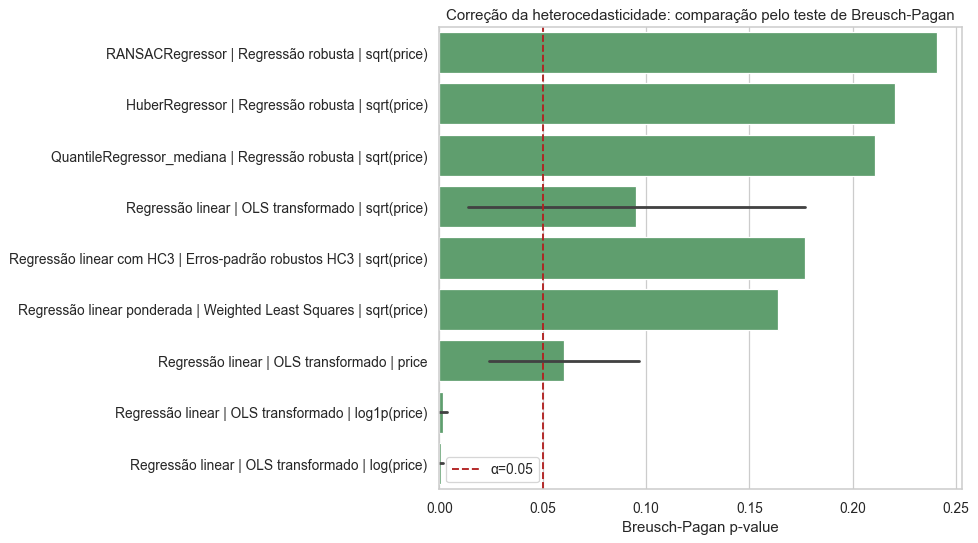

Linhas adicionais preparadas para df_pressupostos_modelos:


,Modelo,Homocedasticidade,Diagnóstico preditivo / robustez,Conclusão
0,RANSACRegressor — Regressão robusta (sqrt(price)),Cumpre,RMSE=56.10; MAE=33.54; BP p=0.24075,Corrigido de forma aceitável
1,HuberRegressor — Regressão robusta (sqrt(price)),Cumpre,RMSE=56.39; MAE=33.46; BP p=0.22064,Corrigido de forma aceitável
2,QuantileRegressor_mediana — Regressão robusta ...,Cumpre,RMSE=56.82; MAE=33.39; BP p=0.21064,Corrigido de forma aceitável
3,Regressão linear — OLS transformado (sqrt(price)),Cumpre,RMSE=55.33; MAE=34.36; BP p=0.17676,Corrigido de forma aceitável
4,Regressão linear ponderada — Weighted Least Sq...,Cumpre,RMSE=55.37; MAE=34.41; BP p=0.16405,Corrigido de forma aceitável
5,Regressão linear — OLS transformado (price),Cumpre,RMSE=55.20; MAE=35.75; BP p=0.09670,Corrigido de forma aceitável


In [60]:
# Tabela final pedida para comparar as abordagens de correção da heterocedasticidade.
def classificar_decisao_heterocedasticidade(row):
    """Classifica a correção sem esconder violações persistentes do Breusch-Pagan."""
    metodo = str(row["Método de correção"])
    alvo = str(row["Transformação"])
    pred = str(row["Transformação dos preditores"])
    bp_p = row["Breusch-Pagan p-value"]

    if bp_p >= 0.05:
        return "Corrigida de forma aceitável"
    if metodo == "OLS transformado" and alvo == "price" and pred == "preditores atuais":
        return "Não corrigida"
    return "Parcialmente mitigada"


df_correcao_heterocedasticidade = (
    df_heterocedasticidade_correcoes
    .rename(columns={
        "Transformação": "Transformação do alvo",
        "Transformação dos preditores": "Transformações dos preditores",
        "Método de correção": "Método",
    })
    [[
        "Modelo",
        "Transformação do alvo",
        "Transformações dos preditores",
        "Método",
        "Breusch-Pagan p-value",
        "Homocedasticidade",
        "RMSE",
        "MAE",
        "R²",
        "WAPE",
        "Decisão",
    ]]
    .copy()
)
df_correcao_heterocedasticidade["Decisão"] = df_heterocedasticidade_correcoes.apply(
    classificar_decisao_heterocedasticidade,
    axis=1,
)
df_correcao_heterocedasticidade.to_excel(
    HET_DIR / "df_correcao_heterocedasticidade.xlsx",
    index=False,
)

display(df_correcao_heterocedasticidade.round(5))

fig, ax = plt.subplots(figsize=(11, 6.2))
plot_df = df_heterocedasticidade_correcoes.copy()
plot_df["Abordagem"] = plot_df["Modelo"] + " | " + plot_df["Método de correção"] + " | " + plot_df["Transformação"]
sns.barplot(
    data=plot_df.sort_values("Breusch-Pagan p-value", ascending=False),
    x="Breusch-Pagan p-value",
    y="Abordagem",
    ax=ax,
    color="#55A868",
)
ax.axvline(0.05, color="firebrick", linestyle="--", label="α=0.05")
ax.set_title("Correção da heterocedasticidade: comparação pelo teste de Breusch-Pagan")
ax.set_xlabel("Breusch-Pagan p-value")
ax.set_ylabel("")
ax.legend()
plt.tight_layout()
plt.savefig(HET_DIR / "fig_heteroscedasticity_correction_bp_summary.png", dpi=140, bbox_inches="tight")
plt.show()

# Linhas adicionais para a tabela geral de pressupostos.
max_vif_correction = float(calcular_vif(X_train)["VIF"].replace([np.inf, -np.inf], np.nan).max())

def pressuposto_row_from_correction(row, tipo="linear corrigido"):
    bp_p = row["Breusch-Pagan p-value"]
    hom_status = status_homocedasticidade(bp_p)
    conclusion = row["Decisão"]
    if hom_status == "Não cumpre" and "Melhorou" in str(row["Decisão"]):
        hom_status = "Parcialmente"
    return {
        "Modelo": f"{row['Modelo']} — {row['Método de correção']} ({row['Transformação']})",
        "Tipo de modelo": tipo,
        "Linearidade": "Parcialmente" if "robusta" in str(row["Método de correção"]).lower() else "Cumpre",
        "Homocedasticidade": hom_status,
        "Normalidade dos resíduos": "Parcialmente",
        "Independência dos resíduos": "Cumpre",
        "Multicolinearidade": "Cumpre",
        "Observações influentes": "Parcialmente",
        "Data leakage evitado": "Cumpre",
        "Overfitting": "Cumpre",
        "Pressupostos clássicos aplicáveis?": "Sim",
        "Diagnóstico preditivo / robustez": f"RMSE={row['RMSE']:.2f}; MAE={row['MAE']:.2f}; BP p={bp_p:.5f}" if not pd.isna(bp_p) else "Diagnóstico indisponível",
        "Transformações aplicadas": f"{row['Transformação']}; {row['Transformação dos preditores']}; {row['Método de correção']}",
        "Conclusão": conclusion,
        "BP_pvalue": bp_p,
        "Shapiro_pvalue": np.nan,
        "JarqueBera_pvalue": np.nan,
        "DurbinWatson": np.nan,
        "Max_VIF": max_vif_correction,
        "Residual_Spearman_abs": np.nan,
        "Cook_restante_n": np.nan,
        "Cook_restante_%": np.nan,
    }

selected_corrections_for_assumptions = df_heterocedasticidade_correcoes[
    df_heterocedasticidade_correcoes["Modelo"].isin([
        "Regressão linear",
        "Regressão linear ponderada",
        "HuberRegressor",
        "RANSACRegressor",
        "QuantileRegressor_mediana",
    ])
].copy()
selected_corrections_for_assumptions = selected_corrections_for_assumptions.sort_values("Breusch-Pagan p-value", ascending=False).head(6)
extra_pressupostos_correcoes = [
    pressuposto_row_from_correction(row)
    for _, row in selected_corrections_for_assumptions.iterrows()
]

print("Linhas adicionais preparadas para df_pressupostos_modelos:")
display(pd.DataFrame(extra_pressupostos_correcoes)[[
    "Modelo", "Homocedasticidade", "Diagnóstico preditivo / robustez", "Conclusão"
]])

**Nota sobre HC3.** Os erros-padrão robustos HC3 são apresentados como correção inferencial para os coeficientes dos modelos lineares. Esta abordagem não altera as previsões, os resíduos nem remove por si só a heterocedasticidade; por isso, a conclusão sobre homocedasticidade deve ser lida a partir do teste de Breusch-Pagan e dos gráficos residuais das especificações transformadas ou ponderadas.

## 5.4 Tabela-resumo dos pressupostos por modelo

A tabela final distingue pressupostos clássicos de diagnóstico preditivo. Nos modelos avançados, os pressupostos de linearidade, homocedasticidade, normalidade e multicolinearidade não são exigidos como nos modelos lineares; por isso, são marcados como “Não aplicável”.

,Modelo,Tipo de modelo,Linearidade,Homocedasticidade,Normalidade dos resíduos,Independência dos resíduos,Multicolinearidade,Observações influentes,Data leakage evitado,Overfitting,Pressupostos clássicos aplicáveis?,Diagnóstico preditivo / robustez,Transformações aplicadas,Conclusão
0,M1 — Linear múltipla raw y,linear,Cumpre,Não cumpre,Parcialmente,Cumpre,Cumpre,Parcialmente,Cumpre,Cumpre,Sim,CV RMSE=53.24; teste RMSE=55.29; escala residu...,sem transformação do alvo,heterocedasticidade persiste; usar interpretaç...
1,M2 — Linear múltipla log(y),linear,Cumpre,Não cumpre,Parcialmente,Cumpre,Cumpre,Parcialmente,Cumpre,Cumpre,Sim,CV RMSE=54.07; teste RMSE=55.99; escala residu...,log(price),transformação logarítmica mitiga assimetria do...
2,M3 — Polinomial grau 2 log(y),polinomial,Cumpre,Não cumpre,Parcialmente,Cumpre,Cumpre,Parcialmente,Cumpre,Cumpre,Sim,CV RMSE=53.05; teste RMSE=55.07; escala residu...,log(price); termos polinomiais grau 2,transformação logarítmica mitiga assimetria do...
3,M4 — Interações grau 2 log(y),interações,Cumpre,Não cumpre,Parcialmente,Cumpre,Cumpre,Parcialmente,Cumpre,Cumpre,Sim,CV RMSE=53.25; teste RMSE=55.34; escala residu...,log(price); interações grau 2,transformação logarítmica mitiga assimetria do...
4,M5 — Ridge log(y),regularizado,Cumpre,Não cumpre,Parcialmente,Cumpre,Cumpre,Parcialmente,Cumpre,Cumpre,Sim,CV RMSE=54.07; teste RMSE=55.99; escala residu...,log(price); regularização,transformação logarítmica mitiga assimetria do...
5,M6 — Lasso log(y),regularizado,Cumpre,Não cumpre,Parcialmente,Cumpre,Cumpre,Parcialmente,Cumpre,Cumpre,Sim,CV RMSE=54.07; teste RMSE=56.00; escala residu...,log(price); regularização,transformação logarítmica mitiga assimetria do...
6,M7 — Elastic Net log(y),regularizado,Cumpre,Não cumpre,Parcialmente,Cumpre,Cumpre,Parcialmente,Cumpre,Cumpre,Sim,CV RMSE=54.07; teste RMSE=55.99; escala residu...,log(price); regularização,transformação logarítmica mitiga assimetria do...
7,M8 — Random Forest log(y),árvore,Não aplicável,Não aplicável,Não aplicável,Não aplicável,Não aplicável,Não aplicável,Cumpre,Não cumpre,Não,CV RMSE=49.06; teste RMSE=50.00; gap treino-te...,log(price),Pressupostos clássicos não aplicáveis; avaliar...
8,M8b — Random Forest regularizado log(y),árvore,Não aplicável,Não aplicável,Não aplicável,Não aplicável,Não aplicável,Não aplicável,Cumpre,Parcialmente,Não,CV RMSE=50.11; teste RMSE=51.60; gap treino-te...,log(price),Pressupostos clássicos não aplicáveis; avaliar...
9,M9 — HistGradientBoosting log(y),boosting,Não aplicável,Não aplicável,Não aplicável,Não aplicável,Não aplicável,Não aplicável,Cumpre,Parcialmente,Não,CV RMSE=49.66; teste RMSE=50.43; gap treino-te...,log(price),Pressupostos clássicos não aplicáveis; avaliar...


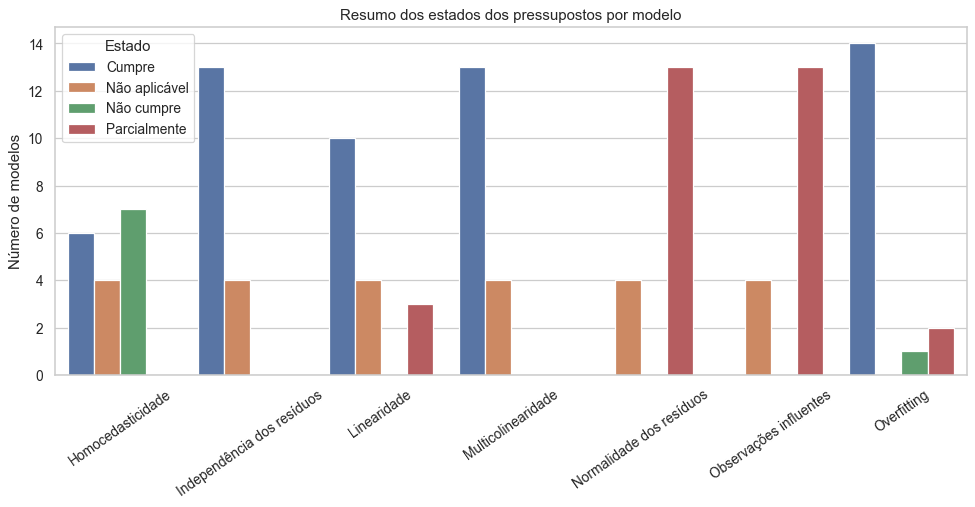

In [61]:
pressupostos_rows = []
for model_name, tipo_modelo in model_type_map.items():
    if model_name not in fitted_models or model_name not in test_predictions:
        continue
    pressupostos_rows.append(
        avaliar_pressupostos_modelo(
            nome_modelo=model_name,
            modelo_ajustado=fitted_models[model_name],
            X_train=X_train,
            X_test=X_test,
            y_train=y_train,
            y_test=y_test,
            y_pred=test_predictions[model_name],
            tipo_modelo=tipo_modelo,
        )
    )

if 'extra_pressupostos_correcoes' in globals():
    pressupostos_rows.extend(extra_pressupostos_correcoes)

df_pressupostos_modelos = pd.DataFrame(pressupostos_rows)
df_pressupostos_modelos.to_excel(PRESSUPOSTOS_DIR / "df_pressupostos_modelos.xlsx", index=False)

cols_resumo = [
    "Modelo", "Tipo de modelo", "Linearidade", "Homocedasticidade",
    "Normalidade dos resíduos", "Independência dos resíduos",
    "Multicolinearidade", "Observações influentes", "Data leakage evitado",
    "Overfitting", "Pressupostos clássicos aplicáveis?",
    "Diagnóstico preditivo / robustez", "Transformações aplicadas", "Conclusão",
]
display(df_pressupostos_modelos[cols_resumo])

status_counts = (
    df_pressupostos_modelos[[
        "Linearidade", "Homocedasticidade", "Normalidade dos resíduos",
        "Independência dos resíduos", "Multicolinearidade",
        "Observações influentes", "Overfitting",
    ]]
    .melt(var_name="Pressuposto", value_name="Estado")
    .groupby(["Pressuposto", "Estado"])
    .size()
    .reset_index(name="N")
)
status_counts.to_excel(PRESSUPOSTOS_DIR / "pressupostos_status_counts.xlsx", index=False)

fig, ax = plt.subplots(figsize=(11, 5.8))
sns.barplot(data=status_counts, x="Pressuposto", y="N", hue="Estado", ax=ax)
ax.set_title("Resumo dos estados dos pressupostos por modelo")
ax.set_xlabel("")
ax.set_ylabel("Número de modelos")
ax.tick_params(axis="x", rotation=35)
plt.tight_layout()
plt.savefig(PRESSUPOSTOS_DIR / "fig_pressupostos_status_counts.png", dpi=140, bbox_inches="tight")
plt.show()

---
# 6. Evaluation

A seleção final considera três dimensões:

- **Desempenho preditivo:** menor RMSE e MAE no teste.
- **Robustez:** diferença controlada entre treino, validação cruzada e teste.
- **Interpretabilidade:** capacidade de explicar efeitos e selecionar variáveis.

Modelos não lineares podem vencer em previsão, mas os modelos lineares regularizados são mais transparentes.

In [62]:
best_predictive_name = advanced_results.iloc[0]["Modelo"]
best_predictive_model = fitted_models[best_predictive_name]
best_predictive_pred = test_predictions[best_predictive_name]

print("Melhor modelo por RMSE no teste:", best_predictive_name)
print(advanced_results.iloc[0][[
    "Train_RMSE", "CV_RMSE", "Test_RMSE", "Test_MAE",
    "Test_MedAE", "Test_MAPE_%", "Test_WAPE_%", "Test_R2", "Test_MaxAE",
    "Gap_Test_Train_RMSE", "Gap_Test_CV_RMSE", "Best params"
]].to_string())

# Modelo interpretável de referência: menor RMSE entre Linear log, Ridge, Lasso e Elastic Net.
interpretable_names = [
    "M2 — Linear múltipla log(y)",
    "M5 — Ridge log(y)",
    "M6 — Lasso log(y)",
    "M7 — Elastic Net log(y)",
]
interpretable_results = advanced_results[advanced_results["Modelo"].isin(interpretable_names)].sort_values("Test_RMSE")
best_interpretable_name = interpretable_results.iloc[0]["Modelo"]
print("\nMelhor modelo interpretável:", best_interpretable_name)
print(interpretable_results.iloc[0][["Test_RMSE", "Test_MAE", "Test_R2", "Best params"]].to_string())

Melhor modelo por RMSE no teste: M8 — Random Forest log(y)
Train_RMSE                                                     22.160273
CV_RMSE                                                        49.055423
Test_RMSE                                                      49.995215
Test_MAE                                                       29.419481
Test_MedAE                                                     17.919302
Test_MAPE_%                                                    27.108442
Test_WAPE_%                                                    26.602406
Test_R2                                                         0.417846
Test_MaxAE                                                    447.724147
Gap_Test_Train_RMSE                                            27.834942
Gap_Test_CV_RMSE                                                0.939792
Best params            {"regressor__model__n_estimators": 200, "regre...

Melhor modelo interpretável: M2 — Linear múltipla log(y)
Test_RM

## 6.1 Visualização dos resultados dos modelos

Esta secção reúne gráficos de diagnóstico e comparação para os modelos testados. Os gráficos principais são apresentados no notebook e versões individuais são guardadas em `outputs/model_diagnostics/`, para consulta complementar sem sobrecarregar o relatório.

### 6.1.1 Preparação dos diagnósticos visuais

São reutilizadas as previsões já produzidas em `test_predictions`, mantendo a avaliação no mesmo conjunto de teste usado nas métricas quantitativas.

In [63]:
DIAGNOSTIC_DIR = OUTPUT_DIR / "model_diagnostics"
DIAGNOSTIC_DIR.mkdir(exist_ok=True)

diagnostic_model_names = [
    spec["name"]
    for spec in model_specs
    if spec["name"] in fitted_models and not spec["name"].startswith("M0")
]

def safe_model_filename(name):
    """Nome de ficheiro estável para gráficos gerados a partir do nome do modelo."""
    ascii_name = "".join(
        char for char in unicodedata.normalize("NFKD", name)
        if not unicodedata.combining(char)
    )
    ascii_name = ascii_name.replace("—", "-").replace("(", "").replace(")", "")
    ascii_name = re.sub(r"[^A-Za-z0-9]+", "_", ascii_name).strip("_").lower()
    return ascii_name

def short_model_label(name):
    return name.split("—", 1)[-1].strip() if "—" in name else name

diagnostic_predictions = {}
diagnostic_rows = []
for model_name in diagnostic_model_names:
    y_pred = np.asarray(test_predictions[model_name])
    residuals = y_test.to_numpy() - y_pred
    diagnostic_predictions[model_name] = {
        "pred": y_pred,
        "residuals": residuals,
        "slug": safe_model_filename(model_name),
        "label": short_model_label(model_name),
    }
    diagnostic_rows.append({
        "Modelo": model_name,
        "RMSE": rmse(y_test, y_pred),
        "MAE": mean_absolute_error(y_test, y_pred),
        "MedAE": median_absolute_error(y_test, y_pred),
        "WAPE_%": wape(y_test, y_pred),
        "R2": r2_score(y_test, y_pred),
        "MaxAE": max_error(y_test, y_pred),
    })

diagnostic_summary = pd.DataFrame(diagnostic_rows).sort_values("RMSE")
diagnostic_summary.to_excel(DIAGNOSTIC_DIR / "diagnostic_metrics_by_model.xlsx", index=False)
display(diagnostic_summary.round(3))

,Modelo,RMSE,MAE,MedAE,WAPE_%,R2,MaxAE
7,M8 — Random Forest log(y),49.995,29.419,17.919,26.602,0.418,447.724
9,M9 — HistGradientBoosting log(y),50.427,29.861,18.302,27.001,0.408,444.842
8,M8b — Random Forest regularizado log(y),51.598,30.509,19.050,27.587,0.380,451.026
10,M10 — SVR RBF log(y),54.170,32.263,20.219,29.174,0.317,466.709
2,M3 — Polinomial grau 2 log(y),55.069,33.490,21.931,30.283,0.294,461.219
0,M1 — Linear múltipla raw y,55.288,36.223,27.397,32.755,0.288,433.389
3,M4 — Interações grau 2 log(y),55.336,33.555,21.567,30.342,0.287,459.729
1,M2 — Linear múltipla log(y),55.994,34.155,22.505,30.885,0.270,437.396
4,M5 — Ridge log(y),55.994,34.155,22.504,30.885,0.270,437.396
6,M7 — Elastic Net log(y),55.995,34.155,22.487,30.885,0.270,437.410


### 6.1.2 Valores reais vs valores previstos

Cada painel compara `price` observado com `price` previsto no conjunto de teste. A linha vermelha representa a previsão ideal: pontos abaixo da linha indicam subestimação e pontos acima indicam sobrestimação.

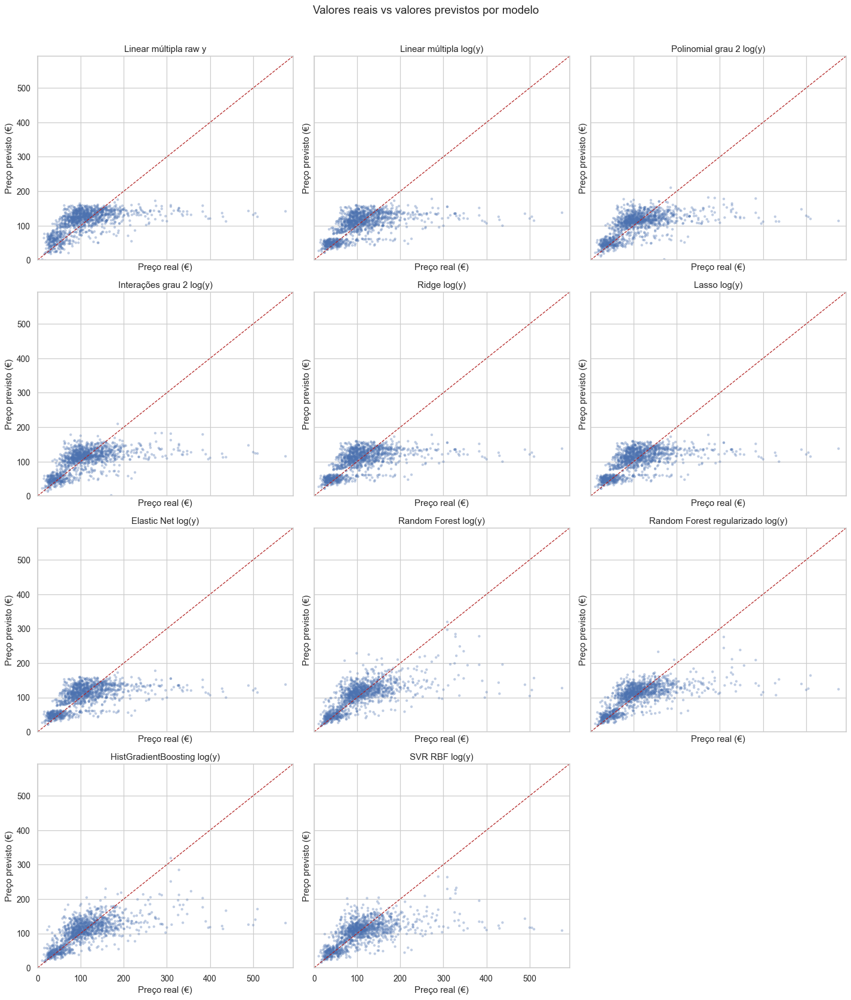

In [64]:
# Painel geral: y_real vs y_pred por modelo.
all_pred_values = np.concatenate([values["pred"] for values in diagnostic_predictions.values()])
axis_upper = max(float(y_test.max()), float(np.nanmax(all_pred_values))) * 1.03
axis_limits = [0, axis_upper]

n_models = len(diagnostic_model_names)
ncols = 3
nrows = ceil(n_models / ncols)
fig, axes = plt.subplots(nrows, ncols, figsize=(16, 4.6 * nrows), sharex=True, sharey=True)
axes = np.array(axes).reshape(-1)

for ax, model_name in zip(axes, diagnostic_model_names):
    info = diagnostic_predictions[model_name]
    ax.scatter(y_test, info["pred"], alpha=0.35, s=12, color="#4C72B0", edgecolor="none")
    ax.plot(axis_limits, axis_limits, color="firebrick", linestyle="--", linewidth=1)
    ax.set_title(info["label"])
    ax.set_xlabel("Preço real (€)")
    ax.set_ylabel("Preço previsto (€)")
    ax.set_xlim(axis_limits)
    ax.set_ylim(axis_limits)

for ax in axes[n_models:]:
    ax.axis("off")

fig.suptitle("Valores reais vs valores previstos por modelo", fontsize=15, y=1.01)
plt.tight_layout()
plt.savefig(OUTPUT_DIR / "fig_all_models_pred_vs_real.png", dpi=140, bbox_inches="tight")
plt.show()

# Guardar uma figura individual por modelo.
for model_name in diagnostic_model_names:
    info = diagnostic_predictions[model_name]
    fig, ax = plt.subplots(figsize=(6, 5.2))
    ax.scatter(y_test, info["pred"], alpha=0.35, s=12, color="#4C72B0", edgecolor="none")
    ax.plot(axis_limits, axis_limits, color="firebrick", linestyle="--", linewidth=1)
    ax.set_title(f"Valores reais vs previstos — {info['label']}")
    ax.set_xlabel("Preço real (€)")
    ax.set_ylabel("Preço previsto (€)")
    ax.set_xlim(axis_limits)
    ax.set_ylim(axis_limits)
    plt.tight_layout()
    plt.savefig(DIAGNOSTIC_DIR / f"pred_vs_real_{info['slug']}.png", dpi=140, bbox_inches="tight")
    plt.close(fig)

### 6.1.3 Resíduos por modelo

Os resíduos são calculados como `preço real - preço previsto`. Padrões em funil ou curvatura indicam heterocedasticidade ou erro sistemático; nuvens centradas em zero sugerem melhor calibração.

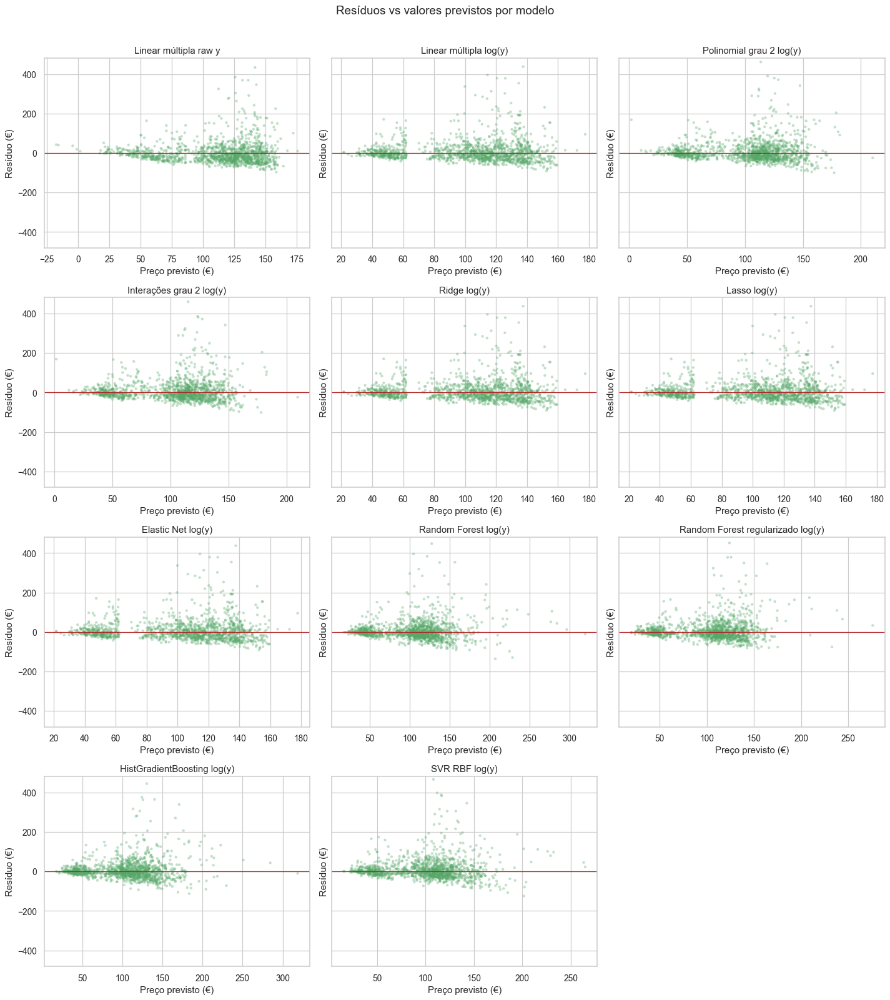

In [65]:
# Painel geral: resíduos vs valores previstos por modelo.
all_residuals = np.concatenate([values["residuals"] for values in diagnostic_predictions.values()])
resid_abs = float(np.nanmax(np.abs(all_residuals)))
resid_limits = [-resid_abs * 1.03, resid_abs * 1.03]

fig, axes = plt.subplots(nrows, ncols, figsize=(16, 4.4 * nrows), sharey=True)
axes = np.array(axes).reshape(-1)

for ax, model_name in zip(axes, diagnostic_model_names):
    info = diagnostic_predictions[model_name]
    ax.scatter(info["pred"], info["residuals"], alpha=0.35, s=12, color="#55A868", edgecolor="none")
    ax.axhline(0, color="firebrick", linewidth=1)
    ax.set_title(info["label"])
    ax.set_xlabel("Preço previsto (€)")
    ax.set_ylabel("Resíduo (€)")
    ax.set_ylim(resid_limits)

for ax in axes[n_models:]:
    ax.axis("off")

fig.suptitle("Resíduos vs valores previstos por modelo", fontsize=15, y=1.01)
plt.tight_layout()
plt.savefig(OUTPUT_DIR / "fig_all_models_residuals.png", dpi=140, bbox_inches="tight")
plt.show()

# Guardar uma figura individual por modelo.
for model_name in diagnostic_model_names:
    info = diagnostic_predictions[model_name]
    fig, ax = plt.subplots(figsize=(6.2, 4.8))
    ax.scatter(info["pred"], info["residuals"], alpha=0.35, s=12, color="#55A868", edgecolor="none")
    ax.axhline(0, color="firebrick", linewidth=1)
    ax.set_title(f"Resíduos vs previsto — {info['label']}")
    ax.set_xlabel("Preço previsto (€)")
    ax.set_ylabel("Resíduo (€)")
    ax.set_ylim(resid_limits)
    plt.tight_layout()
    plt.savefig(DIAGNOSTIC_DIR / f"residuals_{info['slug']}.png", dpi=140, bbox_inches="tight")
    plt.close(fig)

### 6.1.4 Visualização da forma funcional da regressão polinomial

Os gráficos `valores reais vs. valores previstos` comparam qualidade preditiva; não mostram a forma funcional do modelo. Para visualizar a componente polinomial, analisam-se curvas de efeito parcial: uma variável explicativa varia no eixo X, a previsão do modelo fica no eixo Y e as restantes variáveis mantêm-se constantes no perfil mediano da amostra de treino.

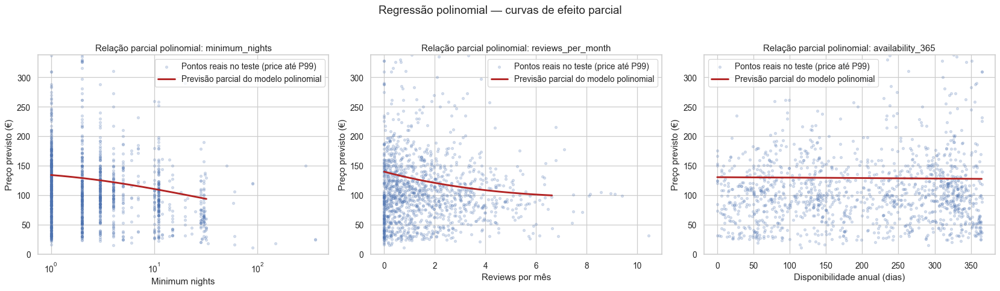

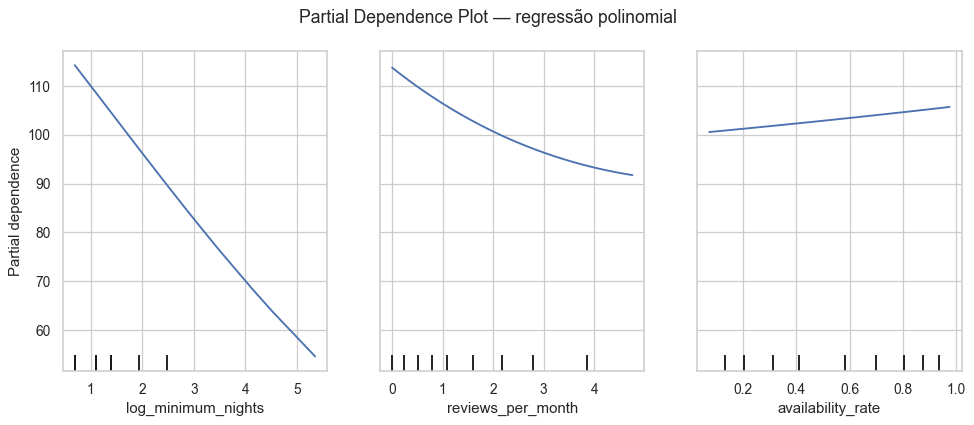

Partial Dependence Plot gerado para a regressão polinomial.


In [66]:
# Curvas de efeito parcial da regressão polinomial.
# Estas curvas não medem qualidade preditiva global; mostram como a previsão varia
# quando uma variável muda e as restantes ficam fixas no perfil mediano.
poly_name = "M3 — Polinomial grau 2 log(y)"
POLY_DIR = OUTPUT_DIR / "polynomial_partial_effects"
POLY_DIR.mkdir(exist_ok=True)

if poly_name in fitted_models:
    poly_model = fitted_models[poly_name]
    base_profile = X_train.median(numeric_only=True)
    y_plot_limit = float(y_train.quantile(0.99))

    partial_specs = [
        {
            "feature": "log_minimum_nights",
            "display_name": "minimum_nights",
            "axis_label": "Minimum nights",
            "to_display": np.expm1,
            "scatter_x": lambda X: np.expm1(X["log_minimum_nights"]),
            "quantiles": (0.01, 0.99),
            "xscale": "log",
        },
        {
            "feature": "reviews_per_month",
            "display_name": "reviews_per_month",
            "axis_label": "Reviews por mês",
            "to_display": lambda x: x,
            "scatter_x": lambda X: X["reviews_per_month"],
            "quantiles": (0.01, 0.99),
            "xscale": "linear",
        },
        {
            "feature": "availability_rate",
            "display_name": "availability_365",
            "axis_label": "Disponibilidade anual (dias)",
            "to_display": lambda x: x * 365,
            "scatter_x": lambda X: X["availability_rate"] * 365,
            "quantiles": (0.00, 1.00),
            "xscale": "linear",
        },
    ]
    partial_specs = [spec for spec in partial_specs if spec["feature"] in X_train.columns]

    partial_effect_rows = []
    fig, axes = plt.subplots(1, len(partial_specs), figsize=(6.2 * len(partial_specs), 5.2))
    if len(partial_specs) == 1:
        axes = [axes]

    for ax, spec in zip(axes, partial_specs):
        feature = spec["feature"]
        q_low, q_high = spec["quantiles"]
        if q_low == 0.0 and q_high == 1.0:
            grid = np.linspace(float(X_train[feature].min()), float(X_train[feature].max()), 220)
        else:
            grid = np.linspace(
                float(X_train[feature].quantile(q_low)),
                float(X_train[feature].quantile(q_high)),
                220,
            )

        X_curve = pd.DataFrame(
            np.tile(base_profile.to_numpy(), (len(grid), 1)),
            columns=X_train.columns,
        )
        X_curve[feature] = grid
        y_curve = poly_model.predict(X_curve)
        x_curve_display = spec["to_display"](grid)

        scatter_df = pd.DataFrame({
            spec["display_name"]: spec["scatter_x"](X_test),
            "price": y_test,
        }).replace([np.inf, -np.inf], np.nan).dropna()
        scatter_df = scatter_df[scatter_df["price"] <= y_plot_limit]

        ax.scatter(
            scatter_df[spec["display_name"]],
            scatter_df["price"],
            alpha=0.20,
            s=10,
            color="#4C72B0",
            label="Pontos reais no teste (price até P99)",
        )
        ax.plot(
            x_curve_display,
            y_curve,
            color="firebrick",
            linewidth=2.3,
            label="Previsão parcial do modelo polinomial",
        )
        ax.set_title(f"Relação parcial polinomial: {spec['display_name']}")
        ax.set_xlabel(spec["axis_label"])
        ax.set_ylabel("Preço previsto (€)")
        ax.set_ylim(0, y_plot_limit)
        if spec["xscale"] == "log":
            ax.set_xscale("log")
        ax.legend(loc="best")

        fig_single, ax_single = plt.subplots(figsize=(8.5, 5.2))
        ax_single.scatter(
            scatter_df[spec["display_name"]],
            scatter_df["price"],
            alpha=0.20,
            s=10,
            color="#4C72B0",
            label="Pontos reais no teste (price até P99)",
        )
        ax_single.plot(
            x_curve_display,
            y_curve,
            color="firebrick",
            linewidth=2.3,
            label="Previsão parcial do modelo polinomial",
        )
        ax_single.set_title(
            f"Regressão polinomial: relação parcial entre {spec['display_name']} e preço previsto"
        )
        ax_single.set_xlabel(spec["axis_label"])
        ax_single.set_ylabel("Preço previsto (€)")
        ax_single.set_ylim(0, y_plot_limit)
        if spec["xscale"] == "log":
            ax_single.set_xscale("log")
        ax_single.legend(loc="best")
        plt.tight_layout()
        plt.savefig(POLY_DIR / f"partial_effect_{spec['display_name']}.png", dpi=140, bbox_inches="tight")
        plt.close(fig_single)

        for x_value, pred_value in zip(x_curve_display, y_curve):
            partial_effect_rows.append({
                "Variável_visualizada": spec["display_name"],
                "Valor_no_eixo_X": float(x_value),
                "Predição_price": float(pred_value),
            })

    fig.suptitle("Regressão polinomial — curvas de efeito parcial", fontsize=15, y=1.03)
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / "fig_polynomial_partial_effects.png", dpi=140, bbox_inches="tight")
    plt.show()

    polynomial_partial_effects = pd.DataFrame(partial_effect_rows)
    polynomial_partial_effects.to_excel(POLY_DIR / "polynomial_partial_effects_grid.xlsx", index=False)

    # Partial Dependence Plot do scikit-learn, como validação complementar.
    try:
        pdp_features = [spec["feature"] for spec in partial_specs]
        X_pdp = X_train.sample(n=min(1200, len(X_train)), random_state=RANDOM_STATE)
        fig, ax = plt.subplots(figsize=(11, 4.8))
        PartialDependenceDisplay.from_estimator(
            poly_model,
            X_pdp,
            features=pdp_features,
            kind="average",
            grid_resolution=50,
            ax=ax,
        )
        fig.suptitle("Partial Dependence Plot — regressão polinomial", fontsize=14)
        plt.tight_layout()
        plt.savefig(OUTPUT_DIR / "fig_polynomial_partial_dependence.png", dpi=140, bbox_inches="tight")
        plt.show()
        pdp_status = "Partial Dependence Plot gerado para a regressão polinomial."
    except Exception as exc:
        pdp_status = f"Partial Dependence Plot não gerado: {exc}"

    with open(OUTPUT_DIR / "polynomial_pdp_status.txt", "w", encoding="utf-8") as f:
        f.write(pdp_status)
    print(pdp_status)
else:
    print("Curvas polinomiais não geradas: modelo polinomial não encontrado.")

### 6.1.5 Comparação global de métricas

Os gráficos seguintes comparam erro absoluto, erro quadrático, erro percentual agregado, qualidade explicativa e erro máximo. Esta leitura ajuda a distinguir desempenho típico, robustez e risco em casos extremos.

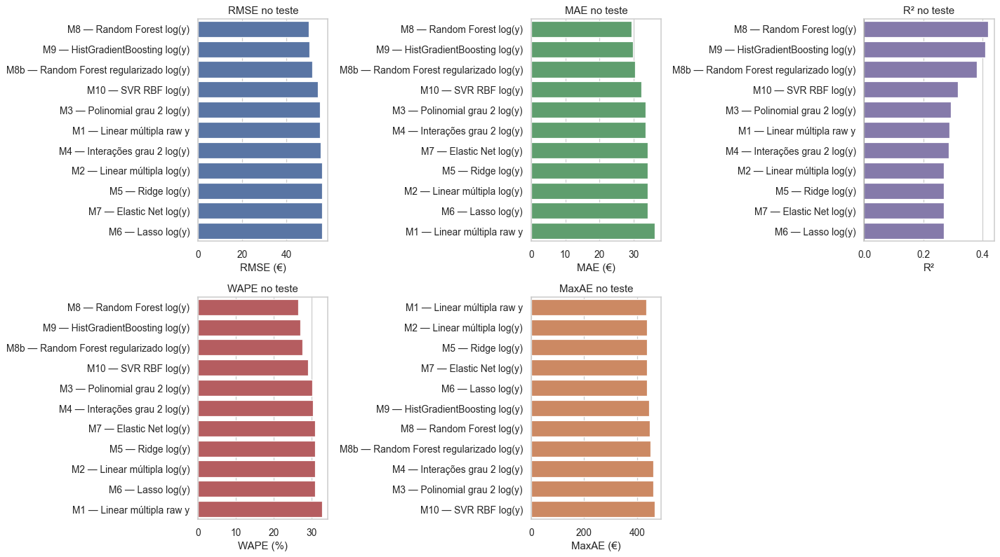

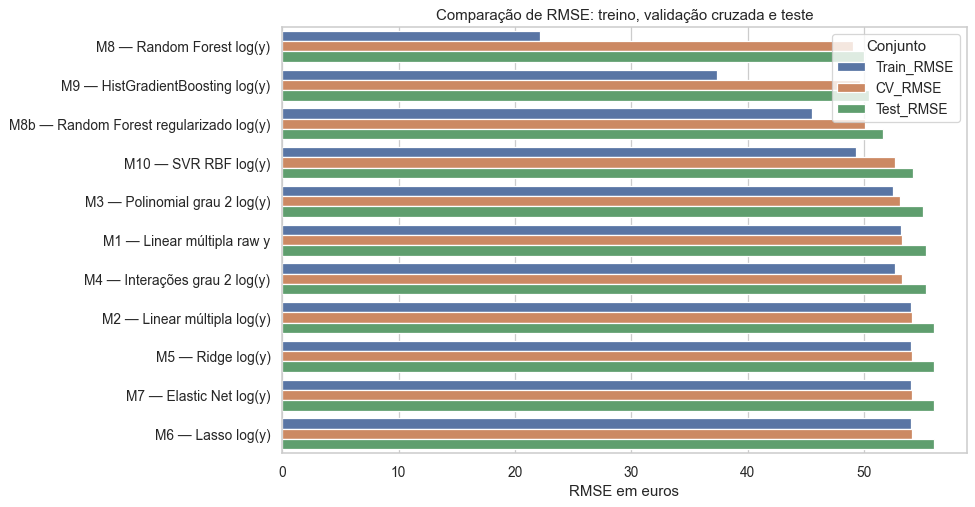

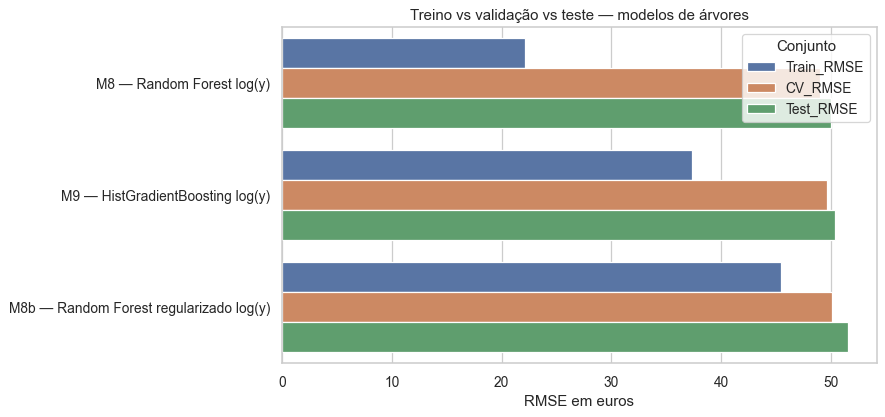

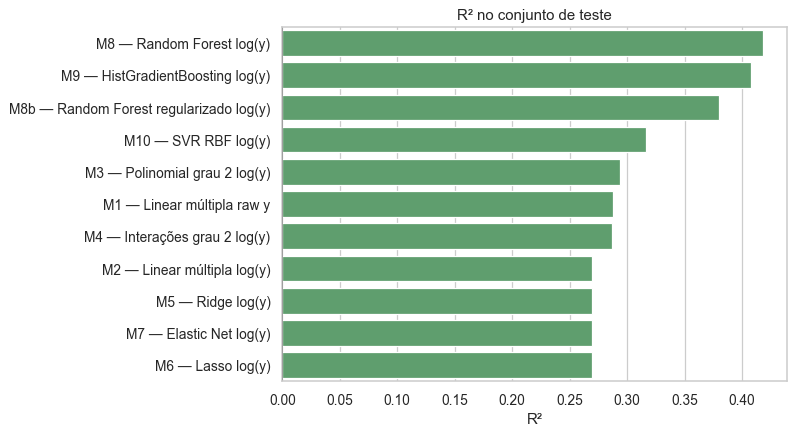

In [67]:
# Gráficos comparativos das métricas principais.
# Esta célula substitui a comparação simples de RMSE/R² por um painel completo:
# RMSE, MAE, R², WAPE e MaxAE, mais comparação treino/CV/teste.
plot_results = advanced_results[~advanced_results["Modelo"].str.startswith("M0")].copy()
metric_specs = [
    ("Test_RMSE", "RMSE no teste", "RMSE (€)", "#4C72B0"),
    ("Test_MAE", "MAE no teste", "MAE (€)", "#55A868"),
    ("Test_R2", "R² no teste", "R²", "#8172B2"),
    ("Test_WAPE_%", "WAPE no teste", "WAPE (%)", "#C44E52"),
    ("Test_MaxAE", "MaxAE no teste", "MaxAE (€)", "#DD8452"),
]

fig, axes = plt.subplots(2, 3, figsize=(16, 9))
axes = axes.flatten()
for ax, (metric_col, title, xlabel, color) in zip(axes, metric_specs):
    ascending = metric_col != "Test_R2"
    data = plot_results.sort_values(metric_col, ascending=ascending)
    sns.barplot(data=data, x=metric_col, y="Modelo", ax=ax, color=color)
    if metric_col == "Test_R2":
        ax.axvline(0, color="black", linewidth=0.8)
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel("")
axes[-1].axis("off")
plt.tight_layout()
plt.savefig(OUTPUT_DIR / "fig_model_metric_panels.png", dpi=140, bbox_inches="tight")
plt.show()

# Guardar também uma figura individual por métrica para consulta complementar.
for metric_col, title, xlabel, color in metric_specs:
    ascending = metric_col != "Test_R2"
    data = plot_results.sort_values(metric_col, ascending=ascending)
    fig, ax = plt.subplots(figsize=(9, 5.2))
    sns.barplot(data=data, x=metric_col, y="Modelo", ax=ax, color=color)
    if metric_col == "Test_R2":
        ax.axvline(0, color="black", linewidth=0.8)
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel("")
    plt.tight_layout()
    filename = f"fig_metric_{metric_col.lower().replace('test_', '').replace('_%', '')}.png"
    plt.savefig(OUTPUT_DIR / filename, dpi=140, bbox_inches="tight")
    plt.close(fig)

# Figura comparativa RMSE treino/CV/teste para todos os modelos.
plot_df = plot_results[["Modelo", "Train_RMSE", "CV_RMSE", "Test_RMSE"]].melt(
    id_vars="Modelo", var_name="Conjunto", value_name="RMSE"
)
fig, ax = plt.subplots(figsize=(11, 5.8))
sns.barplot(data=plot_df, x="RMSE", y="Modelo", hue="Conjunto", ax=ax)
ax.set_title("Comparação de RMSE: treino, validação cruzada e teste")
ax.set_xlabel("RMSE em euros")
ax.set_ylabel("")
plt.tight_layout()
plt.savefig(OUTPUT_DIR / "fig_model_rmse_comparison.png", dpi=140, bbox_inches="tight")
plt.show()

# Foco nos modelos de árvores para visualizar overfitting e robustez.
tree_focus = [
    "M8 — Random Forest log(y)",
    "M8b — Random Forest regularizado log(y)",
    "M9 — HistGradientBoosting log(y)",
]
tree_df = advanced_results[advanced_results["Modelo"].isin(tree_focus)]
tree_plot = tree_df[["Modelo", "Train_RMSE", "CV_RMSE", "Test_RMSE"]].melt(
    id_vars="Modelo", var_name="Conjunto", value_name="RMSE"
)
fig, ax = plt.subplots(figsize=(10, 4.8))
sns.barplot(data=tree_plot, x="RMSE", y="Modelo", hue="Conjunto", ax=ax)
ax.set_title("Treino vs validação vs teste — modelos de árvores")
ax.set_xlabel("RMSE em euros")
ax.set_ylabel("")
plt.tight_layout()
plt.savefig(OUTPUT_DIR / "fig_train_cv_test_tree_models.png", dpi=140, bbox_inches="tight")
plt.show()

# Figura R² no teste mantida como leitura direta da qualidade global.
fig, ax = plt.subplots(figsize=(9, 5))
sns.barplot(data=plot_results.sort_values("Test_R2", ascending=False), x="Test_R2", y="Modelo", ax=ax, color="#55A868")
ax.axvline(0, color="black", linewidth=0.8)
ax.set_title("R² no conjunto de teste")
ax.set_xlabel("R²")
ax.set_ylabel("")
plt.tight_layout()
plt.savefig(OUTPUT_DIR / "fig_model_r2_comparison.png", dpi=140, bbox_inches="tight")
plt.show()


### 6.1.6 Importância das variáveis

Para interpretação complementar, são visualizados os coeficientes não nulos do Lasso, a importância interna do Random Forest e a importância por permutação do HistGradientBoosting. SHAP é tentado numa célula posterior, dependendo da disponibilidade técnica da biblioteca.

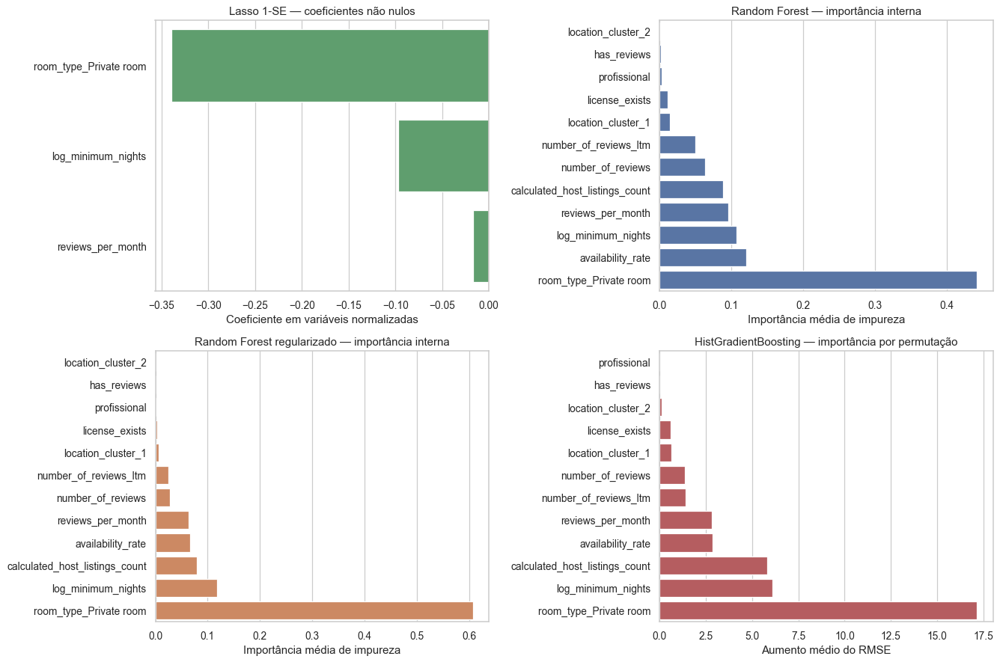

,Variável,Importância_RMSE,Desvio
9,room_type_Private room,17.1477,0.8588
3,log_minimum_nights,6.0900,0.7076
4,calculated_host_listings_count,5.8137,0.2604
5,availability_rate,2.8663,0.4891
0,reviews_per_month,2.8232,0.4491
1,number_of_reviews_ltm,1.4035,0.3137
2,number_of_reviews,1.3511,0.2257
12,location_cluster_1,0.6265,0.1213
6,license_exists,0.6156,0.0834
13,location_cluster_2,0.1102,0.0535


In [68]:
def plot_horizontal_importance(ax, data, x_col, y_col, title, xlabel, color, zero_line=False):
    sns.barplot(data=data, x=x_col, y=y_col, ax=ax, color=color)
    if zero_line:
        ax.axvline(0, color="firebrick", linewidth=1)
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel("")

# Lasso: usar a versão 1-SE quando existe, por ser mais parcimoniosa.
lasso_plot_df = lasso_sparse_table[lasso_sparse_table["Estado"].str.startswith("Mantida")].copy()
lasso_plot_df = lasso_plot_df.sort_values("Coeficiente_Lasso_1SE_scaled_log")

# Random Forest original e regularizado: importâncias internas do modelo.
rf_importance_tables = {}
for rf_model_name, output_name in [
    ("M8 — Random Forest log(y)", "rf_feature_importance.xlsx"),
    ("M8b — Random Forest regularizado log(y)", "rf_regularized_feature_importance.xlsx"),
]:
    rf_inner = fitted_models[rf_model_name].regressor_.named_steps["model"]
    rf_df = pd.DataFrame({
        "Variável": X_train.columns,
        "Importância": rf_inner.feature_importances_,
    }).sort_values("Importância", ascending=False)
    rf_df.to_excel(OUTPUT_DIR / output_name, index=False)
    rf_importance_tables[rf_model_name] = rf_df

# HistGradientBoosting: importância por permutação, porque o estimador não expõe feature_importances_.
hgb_name = "M9 — HistGradientBoosting log(y)"
hgb_perm = permutation_importance(
    fitted_models[hgb_name],
    X_test,
    y_test,
    scoring=make_scorer(rmse, greater_is_better=False),
    n_repeats=8,
    random_state=RANDOM_STATE,
    n_jobs=-1,
)
hgb_importance_df = pd.DataFrame({
    "Variável": X_test.columns,
    "Importância_RMSE": hgb_perm.importances_mean,
    "Desvio": hgb_perm.importances_std,
}).sort_values("Importância_RMSE", ascending=False)
hgb_importance_df.to_excel(OUTPUT_DIR / "permutation_importance_hgb.xlsx", index=False)

fig, axes = plt.subplots(2, 2, figsize=(15, 10))
plot_horizontal_importance(
    axes[0, 0],
    lasso_plot_df,
    "Coeficiente_Lasso_1SE_scaled_log",
    "Variável",
    "Lasso 1-SE — coeficientes não nulos",
    "Coeficiente em variáveis normalizadas",
    "#55A868",
    zero_line=True,
)
plot_horizontal_importance(
    axes[0, 1],
    rf_importance_tables["M8 — Random Forest log(y)"].head(12).sort_values("Importância"),
    "Importância",
    "Variável",
    "Random Forest — importância interna",
    "Importância média de impureza",
    "#4C72B0",
)
plot_horizontal_importance(
    axes[1, 0],
    rf_importance_tables["M8b — Random Forest regularizado log(y)"].head(12).sort_values("Importância"),
    "Importância",
    "Variável",
    "Random Forest regularizado — importância interna",
    "Importância média de impureza",
    "#DD8452",
)
plot_horizontal_importance(
    axes[1, 1],
    hgb_importance_df.head(12).sort_values("Importância_RMSE"),
    "Importância_RMSE",
    "Variável",
    "HistGradientBoosting — importância por permutação",
    "Aumento médio do RMSE",
    "#C44E52",
)
plt.tight_layout()
plt.savefig(OUTPUT_DIR / "fig_feature_importance_lasso_rf_hgb.png", dpi=140, bbox_inches="tight")
plt.show()

display(hgb_importance_df.head(12).round(4))

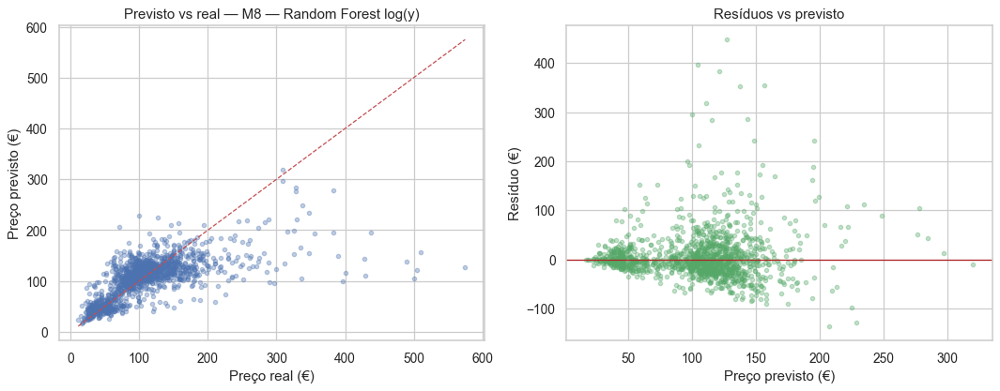

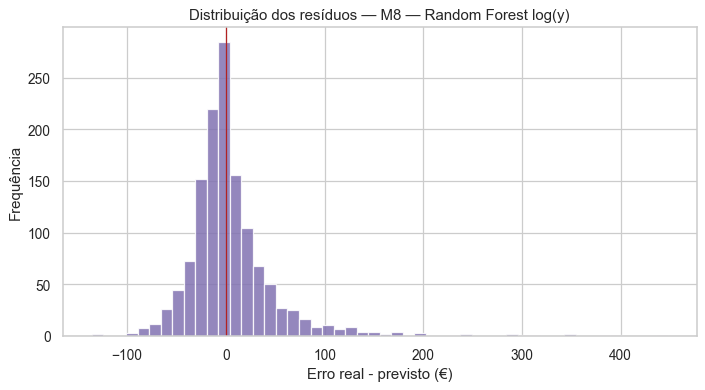

In [69]:
# Diagnóstico visual do melhor modelo preditivo.
residuals_best = y_test - best_predictive_pred

fig, axes = plt.subplots(1, 2, figsize=(12, 4.8))
axes[0].scatter(y_test, best_predictive_pred, alpha=0.35, s=12, color="#4C72B0")
lims = [min(y_test.min(), best_predictive_pred.min()), max(y_test.max(), best_predictive_pred.max())]
axes[0].plot(lims, lims, "r--", linewidth=1)
axes[0].set_xlabel("Preço real (€)")
axes[0].set_ylabel("Preço previsto (€)")
axes[0].set_title(f"Previsto vs real — {best_predictive_name}")

axes[1].scatter(best_predictive_pred, residuals_best, alpha=0.35, s=12, color="#55A868")
axes[1].axhline(0, color="firebrick", linewidth=1)
axes[1].set_xlabel("Preço previsto (€)")
axes[1].set_ylabel("Resíduo (€)")
axes[1].set_title("Resíduos vs previsto")

plt.tight_layout()
plt.savefig(OUTPUT_DIR / "fig_best_model_pred_resid.png", dpi=140, bbox_inches="tight")
plt.show()

fig, ax = plt.subplots(figsize=(8, 4.5))
ax.hist(residuals_best, bins=50, color="#8172B2", edgecolor="white", alpha=0.85)
ax.axvline(0, color="firebrick", linewidth=1)
ax.set_title(f"Distribuição dos resíduos — {best_predictive_name}")
ax.set_xlabel("Erro real - previsto (€)")
ax.set_ylabel("Frequência")
plt.tight_layout()
plt.savefig(OUTPUT_DIR / "fig_best_model_residual_distribution.png", dpi=140, bbox_inches="tight")
plt.show()

## 6.2 Visualização avançada dos modelos não lineares

Random Forest, HistGradientBoosting e SVR RBF não têm uma equação simples como a regressão linear. Por isso, a interpretação gráfica não deve limitar-se à comparação entre valores reais e previstos. Esta secção usa dependência parcial, ICE plots, importância das variáveis, curvas de aprendizagem, curvas de validação e análise segmentada dos erros para compreender não linearidades, interações e padrões de erro.

### 6.2.1 Preparação dos modelos e diretórios

São analisados os modelos não lineares principais: Random Forest, Random Forest regularizado, HistGradientBoosting e SVR RBF. Para controlar o custo computacional, os gráficos de interpretação usam amostras fixas e reprodutíveis.

In [70]:
ADV_DIR = OUTPUT_DIR / "advanced_nonlinear_visualizations"
ADV_DIR.mkdir(exist_ok=True)

nonlinear_models = {
    "Random Forest": "M8 — Random Forest log(y)",
    "Random Forest regularizado": "M8b — Random Forest regularizado log(y)",
    "HistGradientBoosting": "M9 — HistGradientBoosting log(y)",
    "SVR RBF": "M10 — SVR RBF log(y)",
}
nonlinear_models = {
    label: name for label, name in nonlinear_models.items()
    if name in fitted_models and name in test_predictions
}

pdp_feature_candidates = [
    "log_minimum_nights",
    "reviews_per_month",
    "availability_rate",
    "calculated_host_listings_count",
    "number_of_reviews_ltm",
    "location_cluster_2",
]
pdp_features = [feature for feature in pdp_feature_candidates if feature in X_train.columns]

feature_display_names = {
    "log_minimum_nights": "log(minimum_nights + 1)",
    "reviews_per_month": "reviews_per_month",
    "availability_rate": "availability_365 / 365",
    "calculated_host_listings_count": "calculated_host_listings_count",
    "number_of_reviews_ltm": "number_of_reviews_ltm",
    "location_cluster_2": "location_cluster_2",
    "room_type_Private room": "room_type_Private room",
}

interaction_pairs = [
    ("log_minimum_nights", "availability_rate"),
    ("reviews_per_month", "calculated_host_listings_count"),
    ("number_of_reviews_ltm", "availability_rate"),
    ("location_cluster_2", "room_type_Private room"),
]
interaction_pairs = [
    pair for pair in interaction_pairs
    if pair[0] in X_train.columns and pair[1] in X_train.columns
]

X_interpret = X_train.sample(n=min(900, len(X_train)), random_state=RANDOM_STATE)
y_interpret = y_train.loc[X_interpret.index]
X_curve = X_train.sample(n=min(1400, len(X_train)), random_state=RANDOM_STATE)
y_curve = y_train.loc[X_curve.index]

nonlinear_error_rows = []
for label, model_name in nonlinear_models.items():
    pred = np.asarray(test_predictions[model_name])
    residual = y_test.to_numpy() - pred
    abs_error = np.abs(residual)
    for idx, real_value, pred_value, err, signed_err in zip(y_test.index, y_test, pred, abs_error, residual):
        nonlinear_error_rows.append({
            "index": idx,
            "Modelo": label,
            "Nome_modelo": model_name,
            "real_price": float(real_value),
            "pred_price": float(pred_value),
            "residual": float(signed_err),
            "abs_error": float(err),
        })

nonlinear_error_df = pd.DataFrame(nonlinear_error_rows)
nonlinear_error_df.to_excel(ADV_DIR / "nonlinear_model_errors_long.xlsx", index=False)
display(nonlinear_error_df.groupby("Modelo")[["abs_error"]].agg(["mean", "median", "max"]).round(3))

abs_error                 
                                mean  median      max
Modelo                                               
HistGradientBoosting          29.861  18.302  444.842
Random Forest                 29.419  17.919  447.724
Random Forest regularizado    30.509  19.050  451.026
SVR RBF                       32.263  20.219  466.709

### 6.2.2 Partial Dependence Plots 1D

Os Partial Dependence Plots mostram como a previsão média muda quando uma variável varia, mantendo a distribuição das restantes variáveis controlada. Isto ajuda a interpretar relações não lineares sem impor uma forma linear fixa.

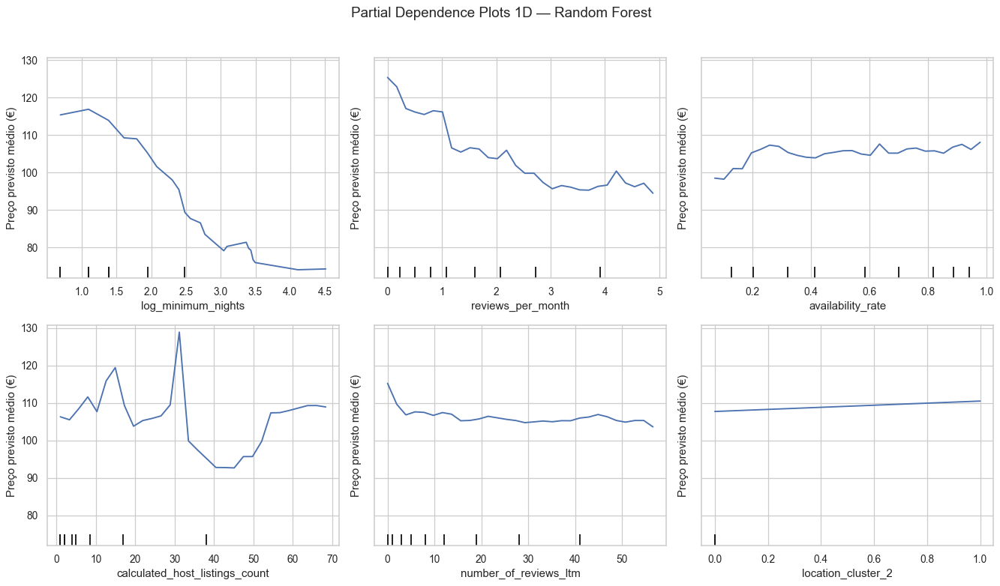

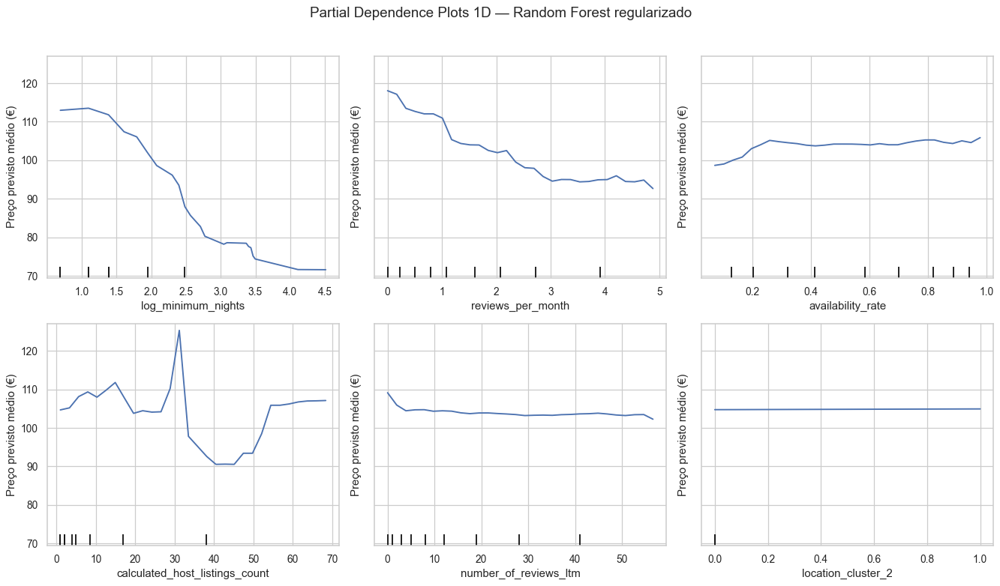

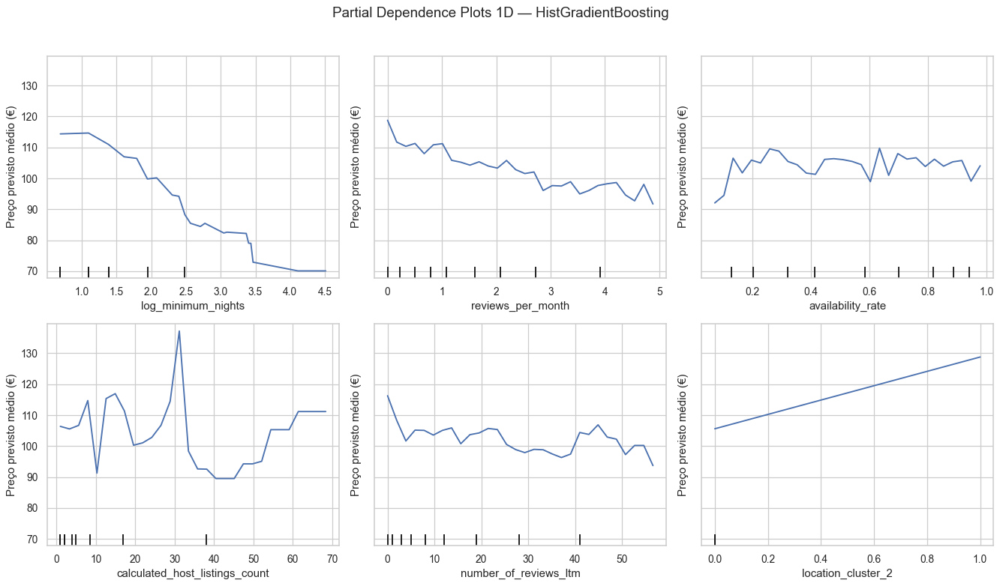

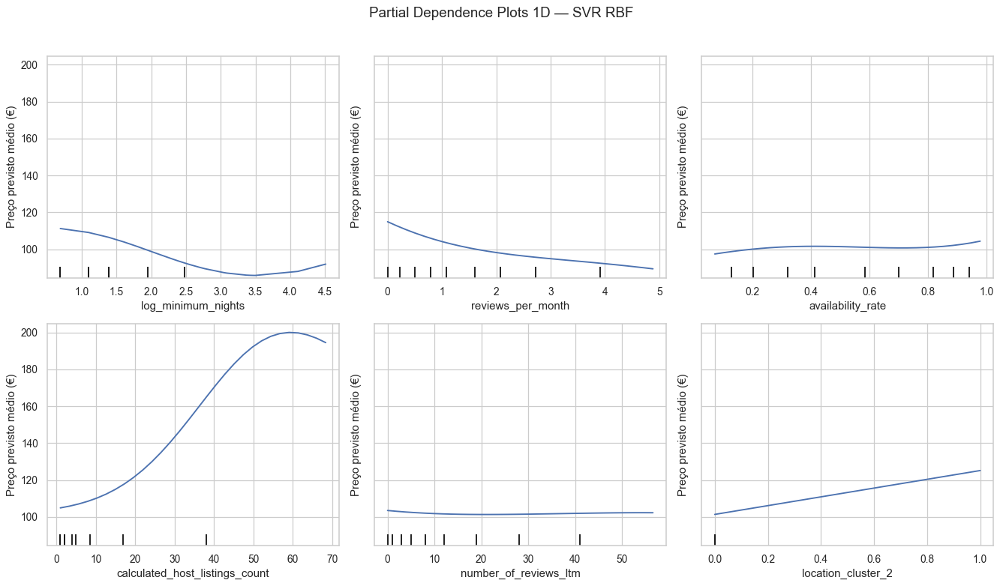

In [71]:
for label, model_name in nonlinear_models.items():
    estimator = fitted_models[model_name]
    features_for_model = pdp_features[:6]
    try:
        fig, ax = plt.subplots(2, 3, figsize=(15, 8.5))
        display_obj = PartialDependenceDisplay.from_estimator(
            estimator,
            X_interpret,
            features=features_for_model,
            kind="average",
            grid_resolution=30,
            ax=ax,
        )
        for axis in np.array(display_obj.axes_).ravel():
            if axis is not None:
                axis.set_ylabel("Preço previsto médio (€)")
        fig.suptitle(f"Partial Dependence Plots 1D — {label}", fontsize=15, y=1.02)
        plt.tight_layout()
        plt.savefig(ADV_DIR / f"pdp_1d_{safe_model_filename(model_name)}.png", dpi=140, bbox_inches="tight")
        plt.show()
    except Exception as exc:
        print(f"PDP 1D não gerado para {label}: {exc}")

### 6.2.3 Partial Dependence Plots 2D

Os PDPs 2D representam interações: o efeito de uma variável pode mudar conforme o valor de outra. Mapas de calor ou contornos indicam regiões de maior ou menor preço previsto.

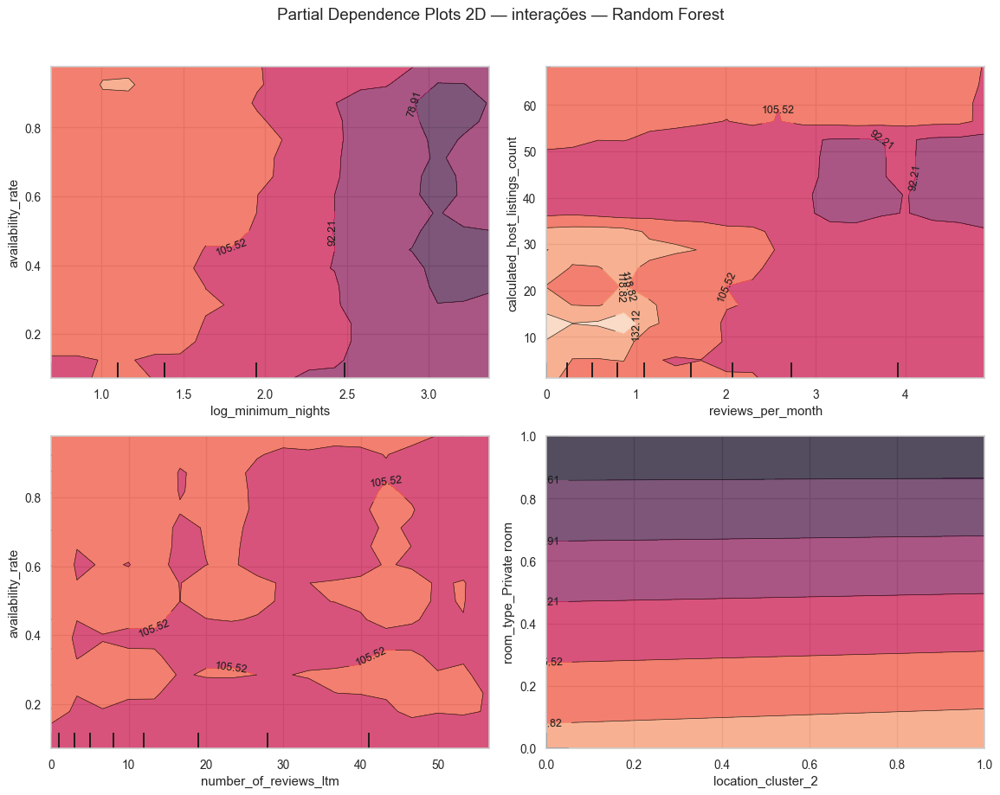

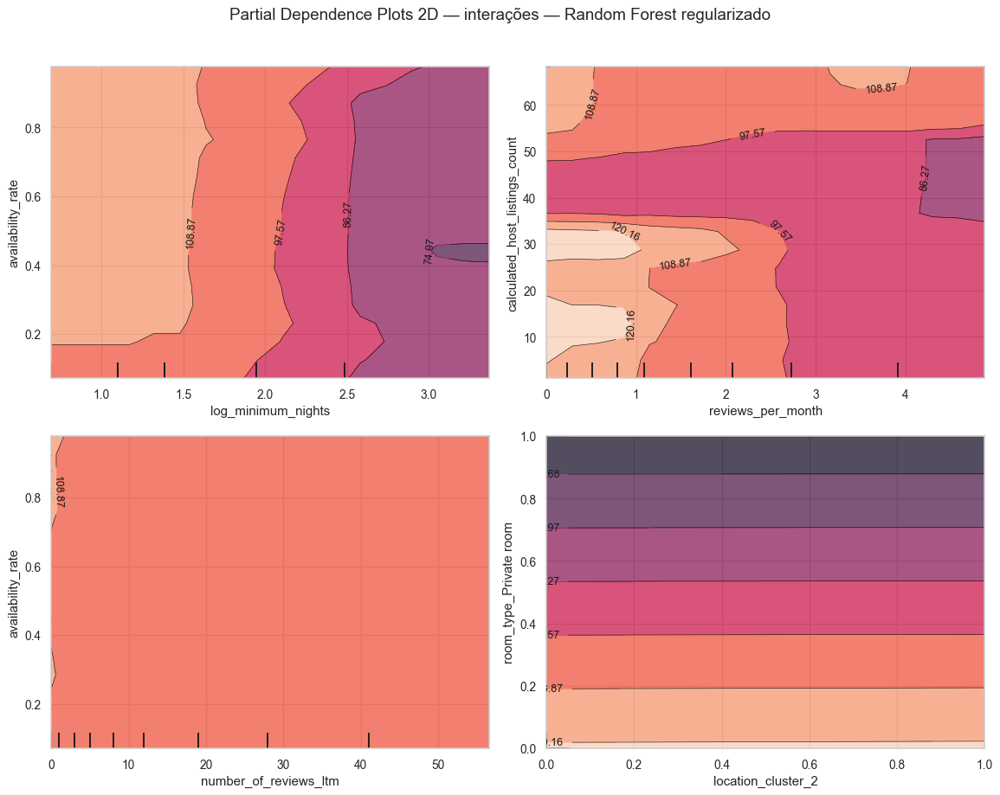

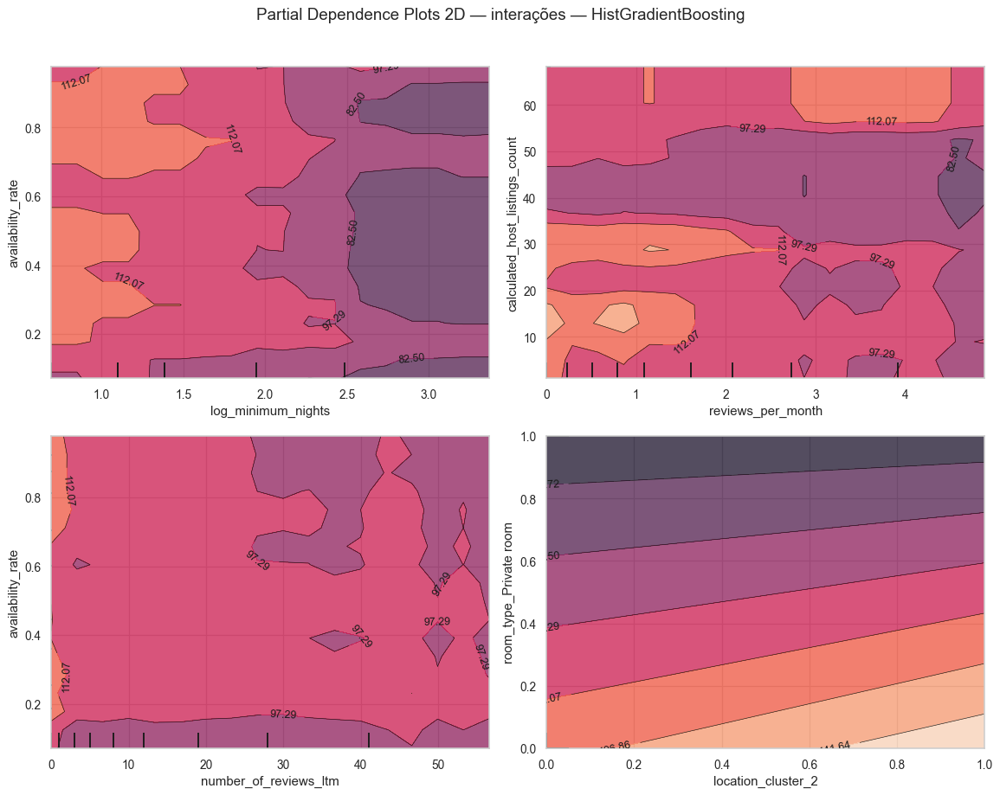

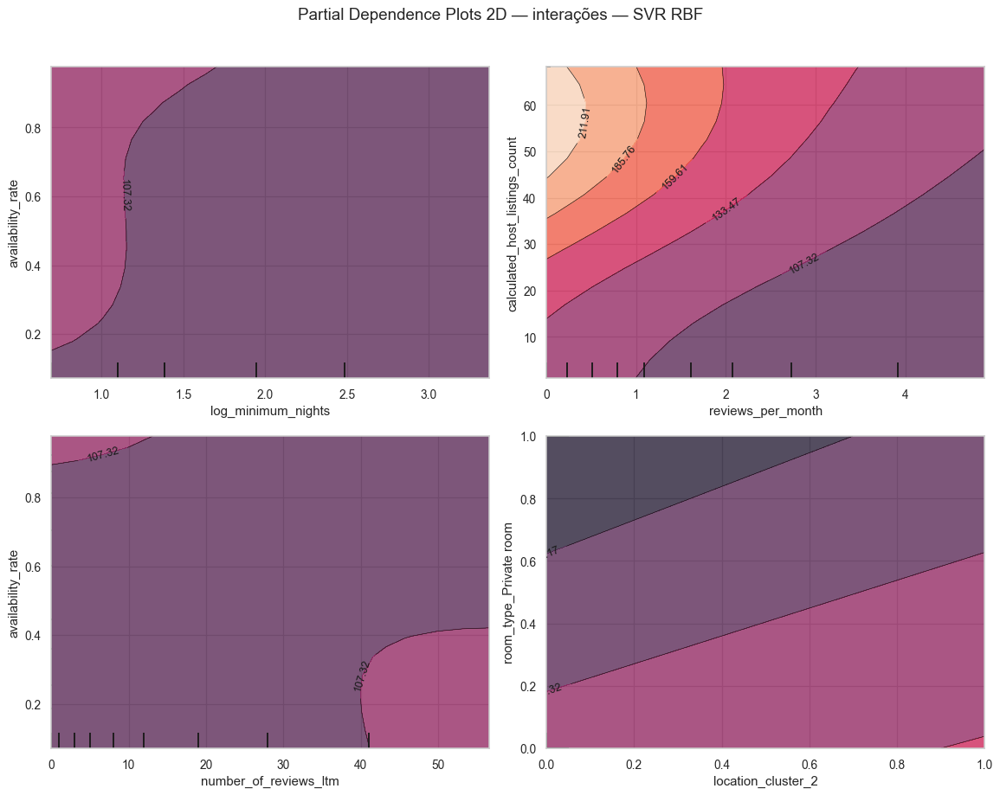

In [72]:
for label, model_name in nonlinear_models.items():
    estimator = fitted_models[model_name]
    try:
        n_pairs = min(4, len(interaction_pairs))
        fig, ax = plt.subplots(2, 2, figsize=(13, 10))
        display_obj = PartialDependenceDisplay.from_estimator(
            estimator,
            X_interpret,
            features=interaction_pairs[:n_pairs],
            kind="average",
            grid_resolution=18,
            ax=ax,
        )
        fig.suptitle(f"Partial Dependence Plots 2D — interações — {label}", fontsize=15, y=1.02)
        plt.tight_layout()
        plt.savefig(ADV_DIR / f"pdp_2d_interactions_{safe_model_filename(model_name)}.png", dpi=140, bbox_inches="tight")
        plt.show()
    except Exception as exc:
        print(f"PDP 2D não gerado para {label}: {exc}")

### 6.2.4 ICE plots

Os ICE plots mostram trajetórias individuais. Ao contrário do PDP médio, revelam se a relação estimada é semelhante para todos os alojamentos ou se varia entre perfis diferentes.

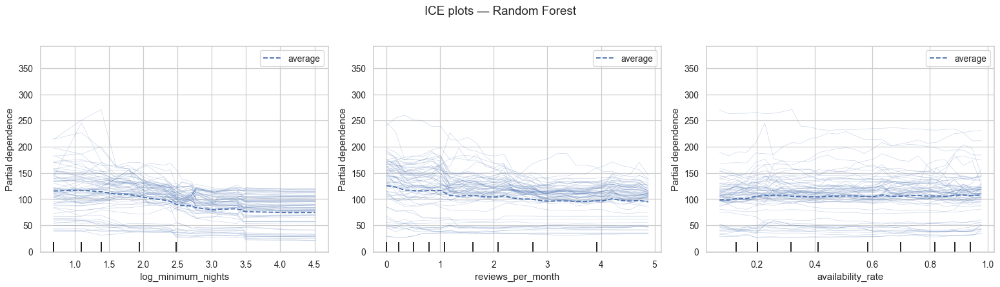

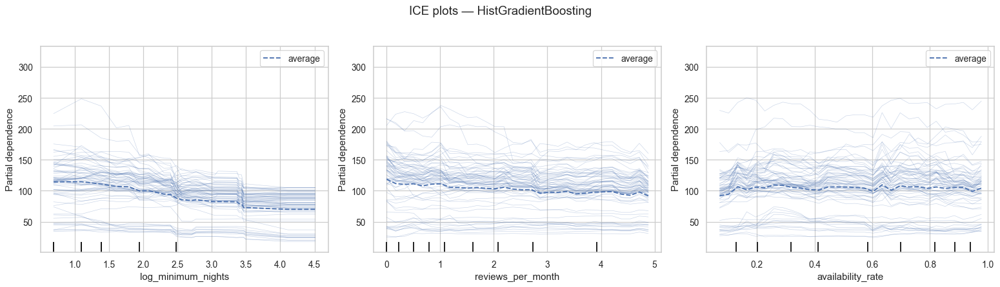

In [73]:
ice_features = [
    feature for feature in ["log_minimum_nights", "reviews_per_month", "availability_rate"]
    if feature in X_train.columns
]

for label, model_name in {
    "Random Forest": nonlinear_models.get("Random Forest"),
    "HistGradientBoosting": nonlinear_models.get("HistGradientBoosting"),
}.items():
    if model_name is None:
        continue
    estimator = fitted_models[model_name]
    try:
        fig, ax = plt.subplots(1, len(ice_features), figsize=(5.8 * len(ice_features), 4.8))
        PartialDependenceDisplay.from_estimator(
            estimator,
            X_interpret,
            features=ice_features,
            kind="both",
            subsample=70,
            grid_resolution=30,
            random_state=RANDOM_STATE,
            ax=ax,
        )
        fig.suptitle(f"ICE plots — {label}", fontsize=15, y=1.03)
        plt.tight_layout()
        plt.savefig(ADV_DIR / f"ice_plots_{safe_model_filename(model_name)}.png", dpi=140, bbox_inches="tight")
        plt.show()
    except Exception as exc:
        print(f"ICE plots não gerados para {label}: {exc}")

### 6.2.5 SHAP summary, bar, dependence e waterfall plots

SHAP permite analisar direção e magnitude das contribuições das variáveis para uma previsão. Quando a biblioteca não está disponível, mantém-se a interpretação por permutation importance, PDP e ICE. O SVR RBF não é analisado com SHAP por custo computacional; nele usam-se PDP e permutation importance.

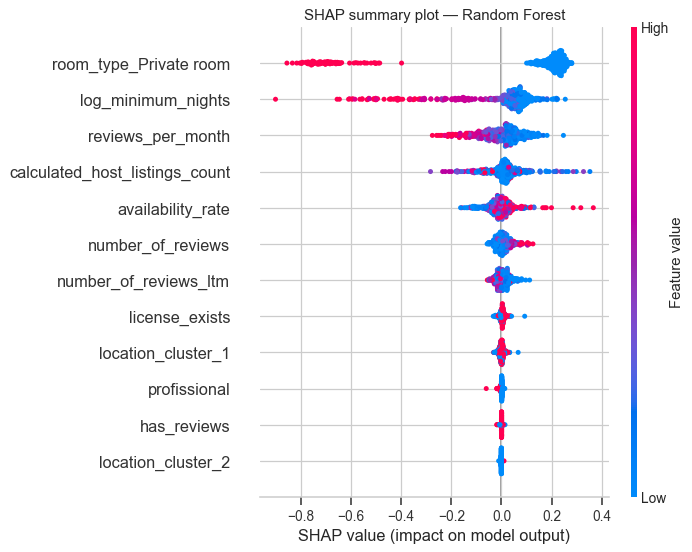

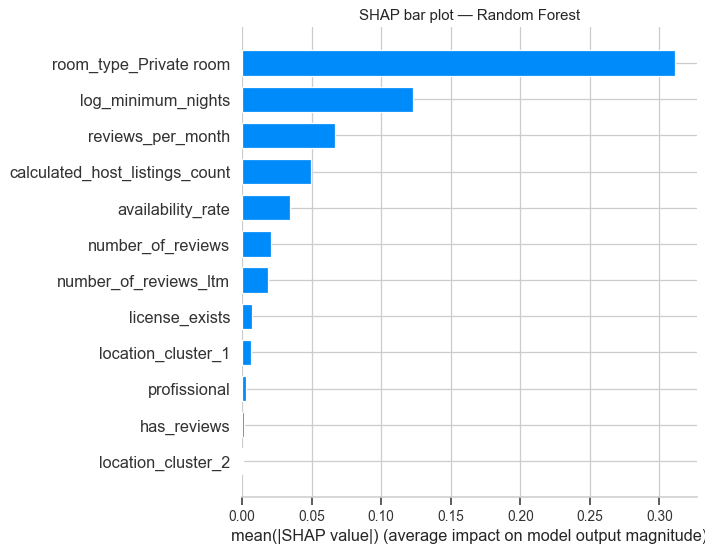

<Figure size 675x450 with 0 Axes>

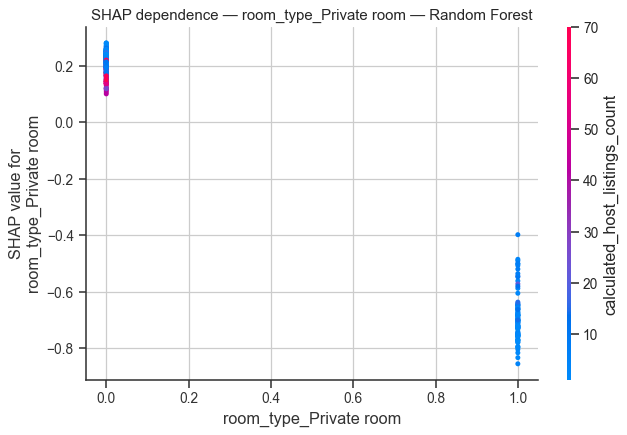

<Figure size 675x450 with 0 Axes>

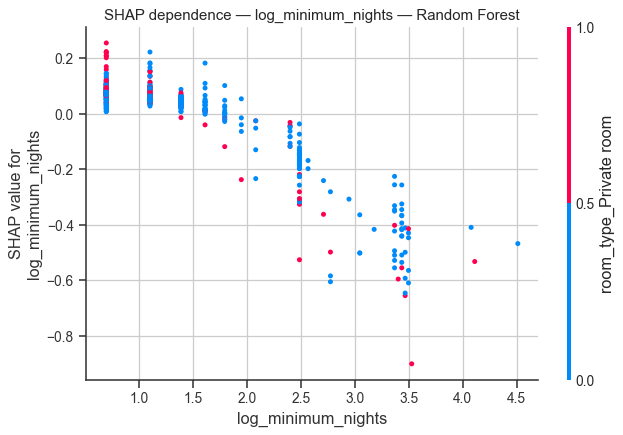

<Figure size 675x450 with 0 Axes>

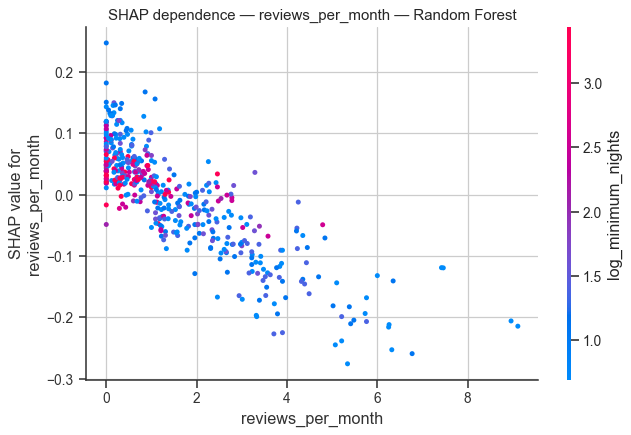

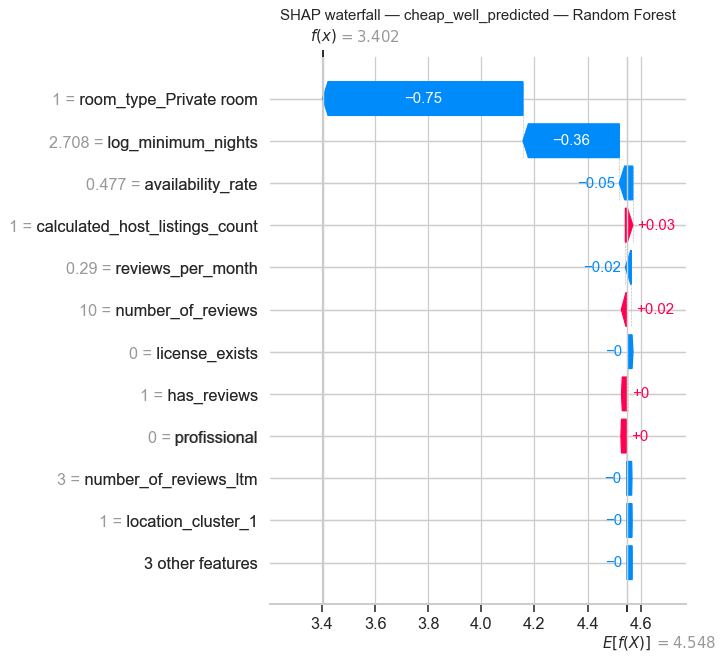

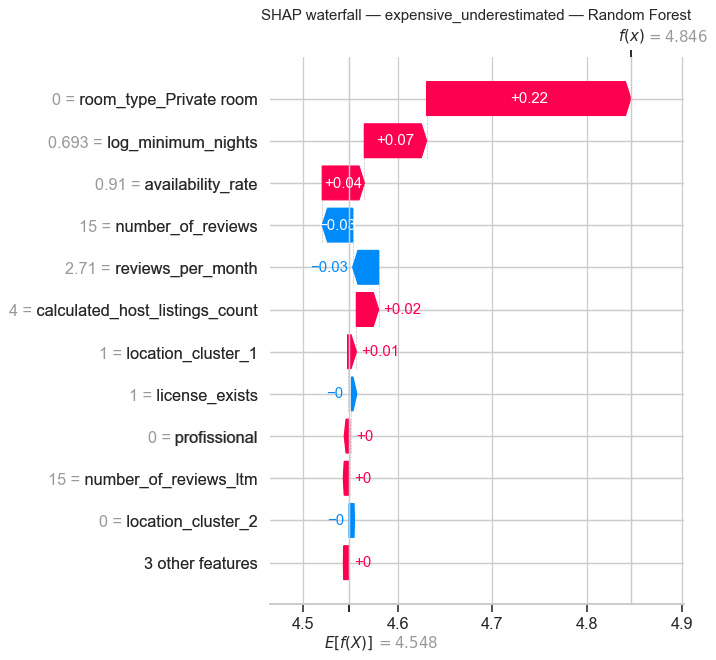

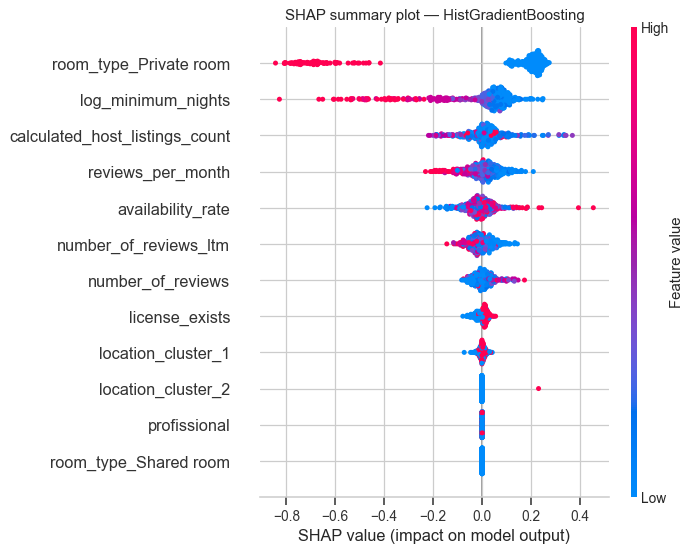

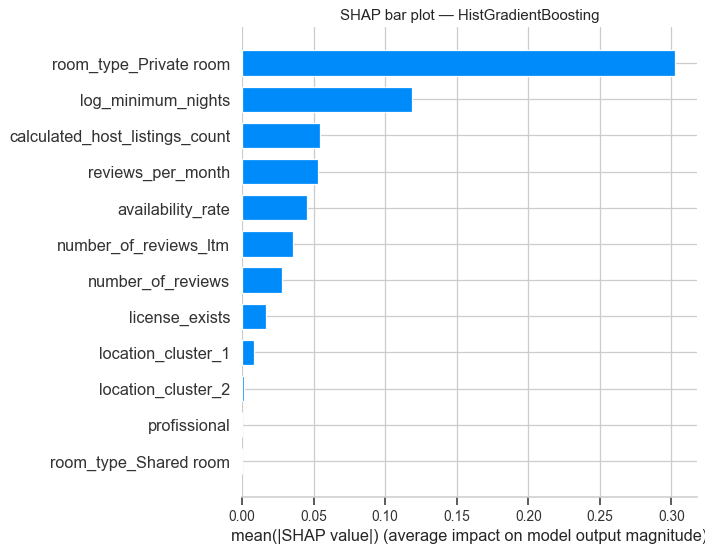

<Figure size 675x450 with 0 Axes>

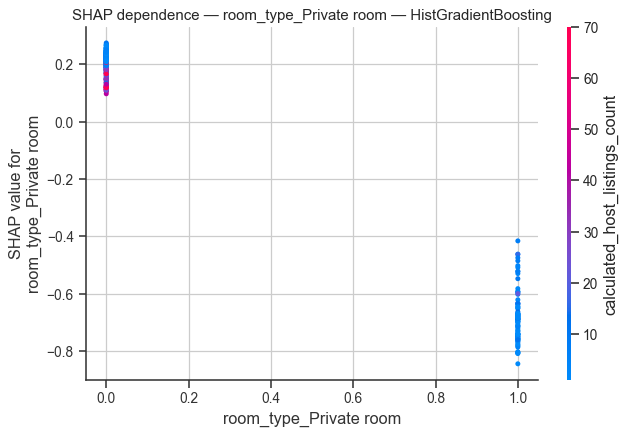

<Figure size 675x450 with 0 Axes>

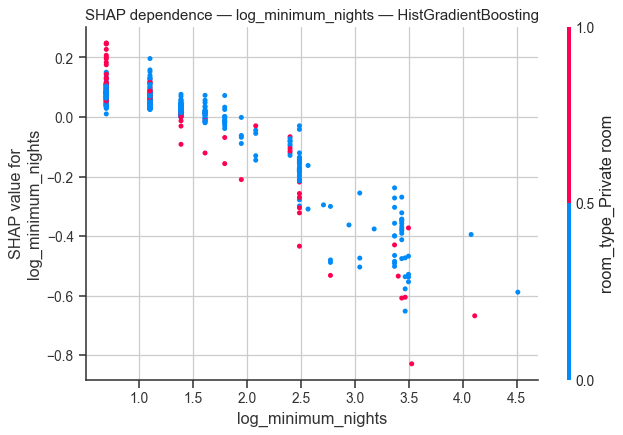

<Figure size 675x450 with 0 Axes>

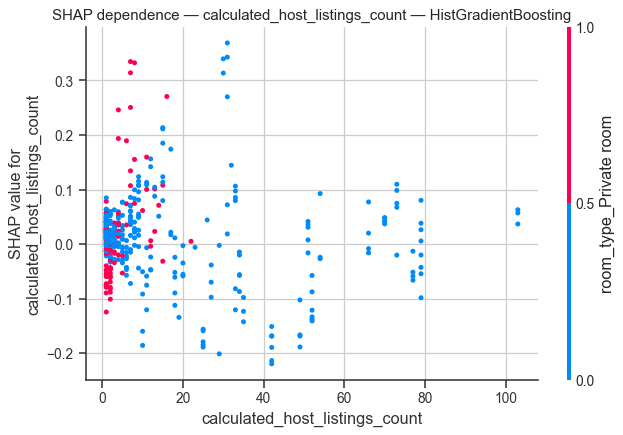

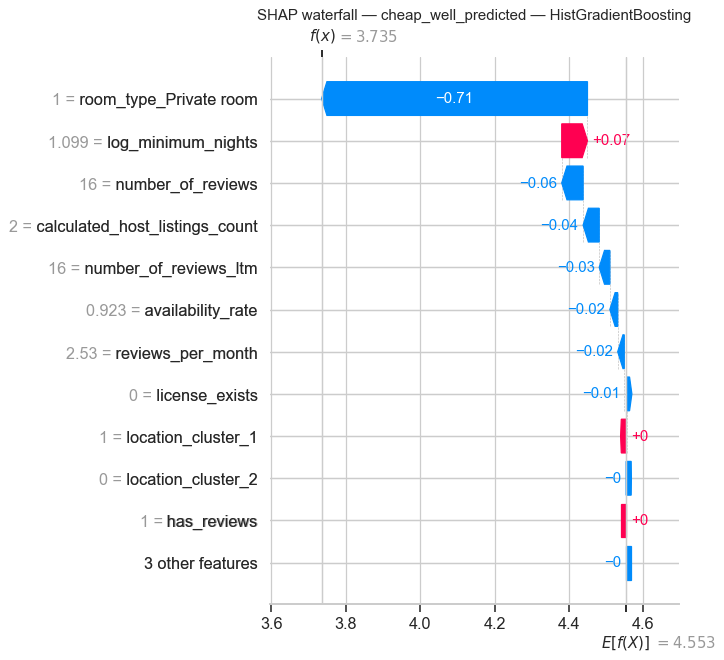

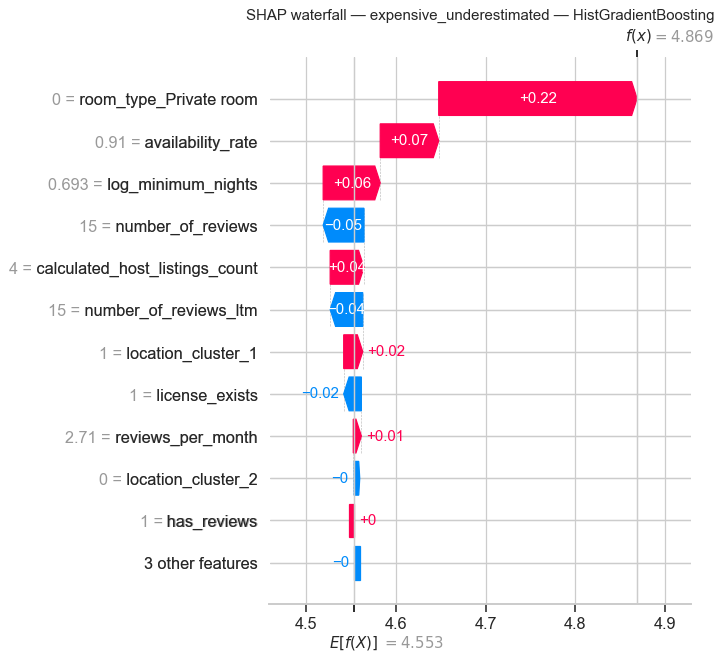

,Modelo,Estado,Top_features
0,Random Forest,SHAP gerado,"room_type_Private room, log_minimum_nights, re..."
1,HistGradientBoosting,SHAP gerado,"room_type_Private room, log_minimum_nights, ca..."


In [74]:
advanced_shap_available = True
advanced_shap_error = ""

advanced_shap_status_rows = []

if advanced_shap_available:
    for label, model_name in [
        ("Random Forest", nonlinear_models.get("Random Forest")),
        ("HistGradientBoosting", nonlinear_models.get("HistGradientBoosting")),
    ]:
        if model_name is None:
            continue
        try:
            model_inner = fitted_models[model_name].regressor_.named_steps["model"]
            sample_base = X_test.sample(n=min(450, len(X_test)), random_state=RANDOM_STATE)

            # Garantir que os casos de interesse entram na amostra SHAP.
            pred_model = np.asarray(test_predictions[model_name])
            tmp_err = pd.DataFrame({
                "real": y_test,
                "pred": pred_model,
                "abs_error": np.abs(y_test.to_numpy() - pred_model),
                "residual": y_test.to_numpy() - pred_model,
            }, index=y_test.index)
            cheap_pool = tmp_err[tmp_err["real"] <= tmp_err["real"].quantile(0.25)]
            cheap_good_idx = cheap_pool.sort_values("abs_error").index[:1]
            expensive_under_idx = tmp_err[
                (tmp_err["real"] >= tmp_err["real"].quantile(0.90)) & (tmp_err["residual"] > 0)
            ].sort_values("abs_error", ascending=False).index[:1]
            high_error_idx = tmp_err.sort_values("abs_error", ascending=False).index[:1]
            case_indices = list(dict.fromkeys(list(cheap_good_idx) + list(expensive_under_idx) + list(high_error_idx)))

            shap_sample = pd.concat([sample_base, X_test.loc[case_indices]], axis=0)
            shap_sample = shap_sample[~shap_sample.index.duplicated(keep="last")]

            explainer = shap.TreeExplainer(model_inner)
            shap_values = explainer.shap_values(shap_sample)
            shap_values_array = np.asarray(shap_values)
            if shap_values_array.ndim == 3:
                shap_values_array = shap_values_array[:, :, 0]

            mean_abs = pd.Series(np.abs(shap_values_array).mean(axis=0), index=shap_sample.columns)
            top_shap_features = mean_abs.sort_values(ascending=False).head(3).index.tolist()

            plt.figure(figsize=(8, 6))
            shap.summary_plot(shap_values_array, shap_sample, show=False, max_display=12)
            plt.title(f"SHAP summary plot — {label}")
            plt.tight_layout()
            plt.savefig(ADV_DIR / f"shap_summary_{safe_model_filename(model_name)}.png", dpi=140, bbox_inches="tight")
            plt.show()

            plt.figure(figsize=(8, 5.5))
            shap.summary_plot(shap_values_array, shap_sample, plot_type="bar", show=False, max_display=12)
            plt.title(f"SHAP bar plot — {label}")
            plt.tight_layout()
            plt.savefig(ADV_DIR / f"shap_bar_{safe_model_filename(model_name)}.png", dpi=140, bbox_inches="tight")
            plt.show()

            for feature in top_shap_features:
                plt.figure(figsize=(7.5, 5))
                shap.dependence_plot(feature, shap_values_array, shap_sample, show=False)
                plt.title(f"SHAP dependence — {feature} — {label}")
                plt.tight_layout()
                plt.savefig(ADV_DIR / f"shap_dependence_{safe_model_filename(model_name)}_{feature}.png", dpi=140, bbox_inches="tight")
                plt.show()

            expected_value = explainer.expected_value
            if isinstance(expected_value, (list, np.ndarray)):
                expected_value = np.asarray(expected_value).ravel()[0]

            for case_label, case_idx in [
                ("cheap_well_predicted", case_indices[0] if len(case_indices) > 0 else None),
                ("expensive_underestimated", case_indices[1] if len(case_indices) > 1 else None),
                ("high_absolute_error", case_indices[2] if len(case_indices) > 2 else None),
            ]:
                if case_idx is None or case_idx not in shap_sample.index:
                    continue
                pos = shap_sample.index.get_loc(case_idx)
                explanation = shap.Explanation(
                    values=shap_values_array[pos],
                    base_values=expected_value,
                    data=shap_sample.iloc[pos],
                    feature_names=shap_sample.columns,
                )
                plt.figure(figsize=(8, 5.5))
                shap.plots.waterfall(explanation, show=False, max_display=12)
                plt.title(f"SHAP waterfall — {case_label} — {label}")
                plt.tight_layout()
                plt.savefig(ADV_DIR / f"shap_waterfall_{safe_model_filename(model_name)}_{case_label}.png", dpi=140, bbox_inches="tight")
                plt.show()

            advanced_shap_status_rows.append({
                "Modelo": label,
                "Estado": "SHAP gerado",
                "Top_features": ", ".join(top_shap_features),
            })
        except Exception as exc:
            advanced_shap_status_rows.append({
                "Modelo": label,
                "Estado": f"SHAP falhou: {exc}",
                "Top_features": "",
            })
else:
    advanced_shap_status_rows.append({
        "Modelo": "Random Forest / HistGradientBoosting",
        "Estado": f"SHAP não disponível no ambiente: {advanced_shap_error}",
        "Top_features": "",
    })

advanced_shap_status = pd.DataFrame(advanced_shap_status_rows)
advanced_shap_status.to_excel(ADV_DIR / "advanced_shap_status.xlsx", index=False)
with open(ADV_DIR / "advanced_shap_status.txt", "w", encoding="utf-8") as f:
    f.write(advanced_shap_status.to_string(index=False))
display(advanced_shap_status)

### 6.2.6 Erro por quantil de preço

Ao dividir `price` por quantis, verifica-se se o modelo é mais fiável em alojamentos baratos/médios e menos fiável em alojamentos caros.

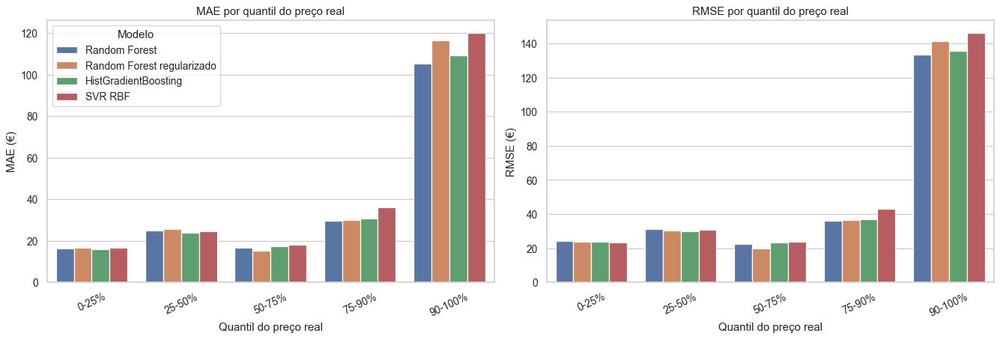

,Modelo,Quantil_preço,N,MAE,RMSE,WAPE_%
0,Random Forest,0-25%,335,16.345,24.222,35.994
1,Random Forest,25-50%,335,24.991,31.206,28.834
2,Random Forest,50-75%,335,16.598,22.687,14.245
3,Random Forest,75-90%,201,29.485,36.050,19.066
4,Random Forest,90-100%,134,105.130,133.633,41.650
5,Random Forest regularizado,0-25%,335,16.663,23.841,36.693
6,Random Forest regularizado,25-50%,335,25.698,30.255,29.648
7,Random Forest regularizado,50-75%,335,15.089,19.990,12.950
8,Random Forest regularizado,75-90%,201,29.962,36.323,19.375
9,Random Forest regularizado,90-100%,134,116.520,141.196,46.163


In [75]:
quantile_labels = ["0-25%", "25-50%", "50-75%", "75-90%", "90-100%"]
price_quantile = pd.cut(
    y_test.rank(method="first", pct=True),
    bins=[0, 0.25, 0.50, 0.75, 0.90, 1.0],
    labels=quantile_labels,
    include_lowest=True,
)

quantile_error_rows = []
for label, model_name in nonlinear_models.items():
    pred = np.asarray(test_predictions[model_name])
    tmp = pd.DataFrame({
        "Quantil_preço": price_quantile,
        "real": y_test.to_numpy(),
        "pred": pred,
    })
    for q_label, group in tmp.groupby("Quantil_preço", observed=True):
        quantile_error_rows.append({
            "Modelo": label,
            "Quantil_preço": q_label,
            "N": len(group),
            "MAE": mean_absolute_error(group["real"], group["pred"]),
            "RMSE": rmse(group["real"], group["pred"]),
            "WAPE_%": wape(group["real"], group["pred"]),
        })

quantile_error_df = pd.DataFrame(quantile_error_rows)
quantile_error_df.to_excel(ADV_DIR / "error_by_price_quantile.xlsx", index=False)

fig, axes = plt.subplots(1, 2, figsize=(15, 5.2), sharex=True)
sns.barplot(data=quantile_error_df, x="Quantil_preço", y="MAE", hue="Modelo", ax=axes[0])
axes[0].set_title("MAE por quantil do preço real")
axes[0].set_xlabel("Quantil do preço real")
axes[0].set_ylabel("MAE (€)")
axes[0].tick_params(axis="x", rotation=25)

sns.barplot(data=quantile_error_df, x="Quantil_preço", y="RMSE", hue="Modelo", ax=axes[1])
axes[1].set_title("RMSE por quantil do preço real")
axes[1].set_xlabel("Quantil do preço real")
axes[1].set_ylabel("RMSE (€)")
axes[1].tick_params(axis="x", rotation=25)
axes[1].legend([], [], frameon=False)
plt.tight_layout()
plt.savefig(ADV_DIR / "error_by_price_quantile.png", dpi=140, bbox_inches="tight")
plt.show()

display(quantile_error_df.round(3))

### 6.2.7 Erro absoluto por preço real

Este gráfico testa visualmente se o erro cresce com o preço real. A linha de tendência ajuda a identificar subestimação sistemática nos alojamentos mais caros.

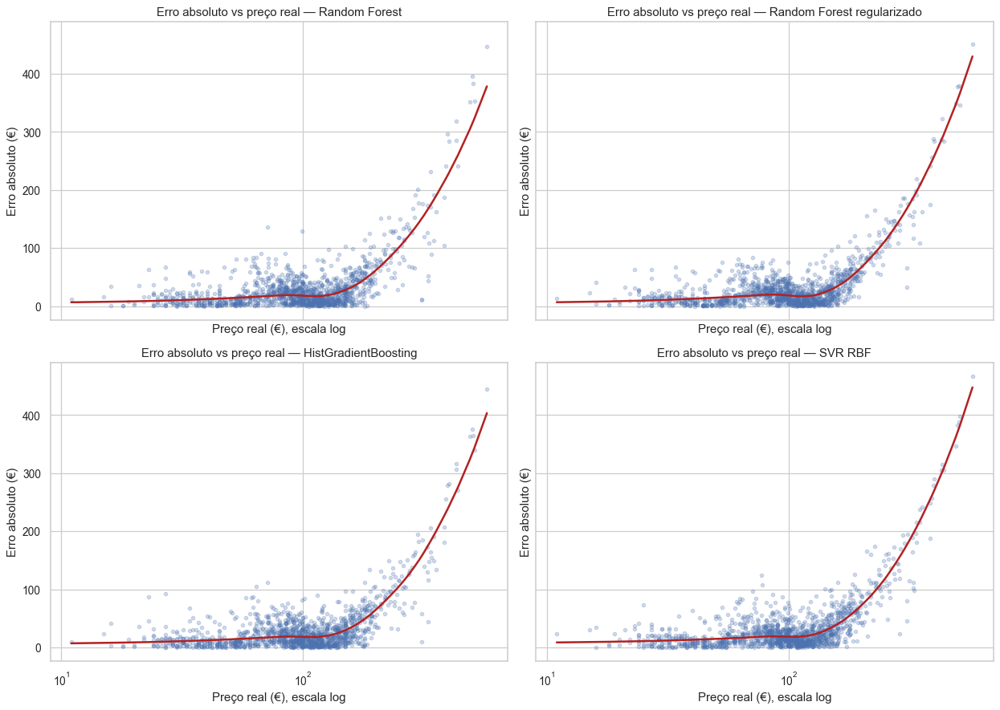

In [76]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharex=True, sharey=True)
axes = axes.ravel()

for ax, (label, model_name) in zip(axes, nonlinear_models.items()):
    model_err = nonlinear_error_df[nonlinear_error_df["Modelo"].eq(label)]
    sns.regplot(
        data=model_err,
        x="real_price",
        y="abs_error",
        lowess=True,
        scatter_kws={"alpha": 0.25, "s": 12},
        line_kws={"color": "firebrick", "linewidth": 2},
        ax=ax,
    )
    ax.set_xscale("log")
    ax.set_title(f"Erro absoluto vs preço real — {label}")
    ax.set_xlabel("Preço real (€), escala log")
    ax.set_ylabel("Erro absoluto (€)")

plt.tight_layout()
plt.savefig(ADV_DIR / "absolute_error_by_real_price.png", dpi=140, bbox_inches="tight")
plt.show()

### 6.2.8 Boxplots dos erros absolutos por modelo

Os boxplots comparam dispersão, mediana e erros extremos, complementando MAE e RMSE.

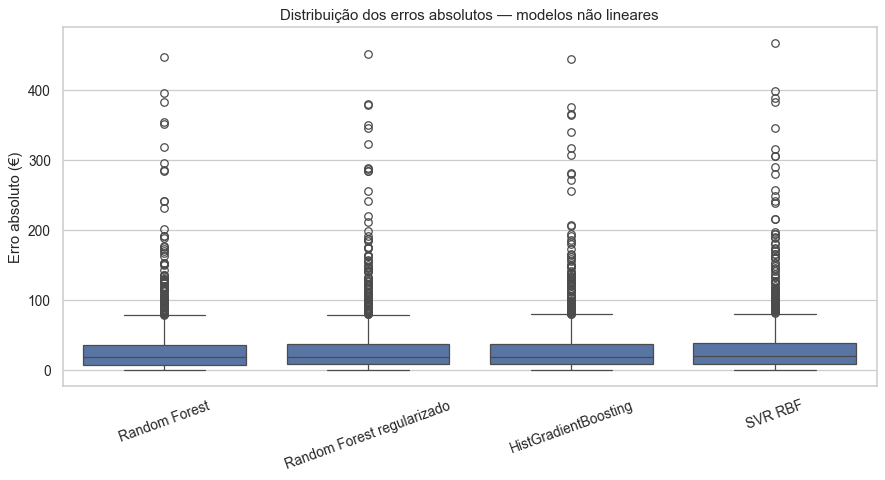

In [77]:
fig, ax = plt.subplots(figsize=(10, 5.5))
sns.boxplot(data=nonlinear_error_df, x="Modelo", y="abs_error", ax=ax, showfliers=True)
ax.set_title("Distribuição dos erros absolutos — modelos não lineares")
ax.set_xlabel("")
ax.set_ylabel("Erro absoluto (€)")
ax.tick_params(axis="x", rotation=20)
plt.tight_layout()
plt.savefig(ADV_DIR / "absolute_error_boxplots_nonlinear_models.png", dpi=140, bbox_inches="tight")
plt.show()

### 6.2.9 Calibration plot para regressão

As previsões são agrupadas em bins. Se o modelo estiver bem calibrado, o preço médio previsto e o preço médio real devem ficar próximos da linha ideal.

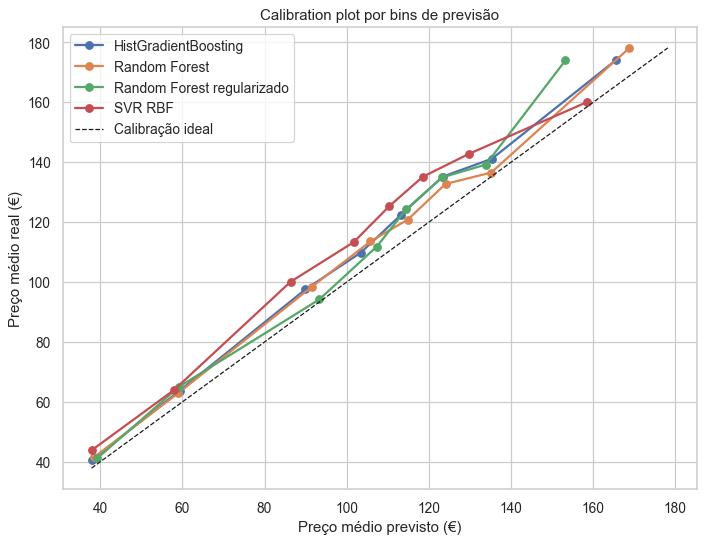

In [78]:
calibration_rows = []
n_bins = 8
for label, model_name in nonlinear_models.items():
    pred = np.asarray(test_predictions[model_name])
    tmp = pd.DataFrame({"real": y_test.to_numpy(), "pred": pred})
    tmp["bin"] = pd.qcut(tmp["pred"].rank(method="first"), q=n_bins, labels=False)
    grouped = tmp.groupby("bin").agg(
        pred_mean=("pred", "mean"),
        real_mean=("real", "mean"),
        n=("real", "size"),
    ).reset_index()
    grouped["Modelo"] = label
    calibration_rows.append(grouped)

calibration_df = pd.concat(calibration_rows, ignore_index=True)
calibration_df.to_excel(ADV_DIR / "calibration_by_prediction_bins.xlsx", index=False)

fig, ax = plt.subplots(figsize=(8, 6.2))
for label, group in calibration_df.groupby("Modelo"):
    ax.plot(group["pred_mean"], group["real_mean"], marker="o", linewidth=1.8, label=label)
lims = [
    min(calibration_df["pred_mean"].min(), calibration_df["real_mean"].min()),
    max(calibration_df["pred_mean"].max(), calibration_df["real_mean"].max()),
]
ax.plot(lims, lims, "k--", linewidth=1, label="Calibração ideal")
ax.set_title("Calibration plot por bins de previsão")
ax.set_xlabel("Preço médio previsto (€)")
ax.set_ylabel("Preço médio real (€)")
ax.legend()
plt.tight_layout()
plt.savefig(ADV_DIR / "calibration_plot_regression_bins.png", dpi=140, bbox_inches="tight")
plt.show()

### 6.2.10 Learning curves

As learning curves comparam erro de treino e validação à medida que cresce a dimensão da amostra. Quando ambas as curvas estabilizam longe de erro baixo, há indício de limitação pelas variáveis disponíveis; quando há grande distância entre treino e validação, há risco de overfitting.

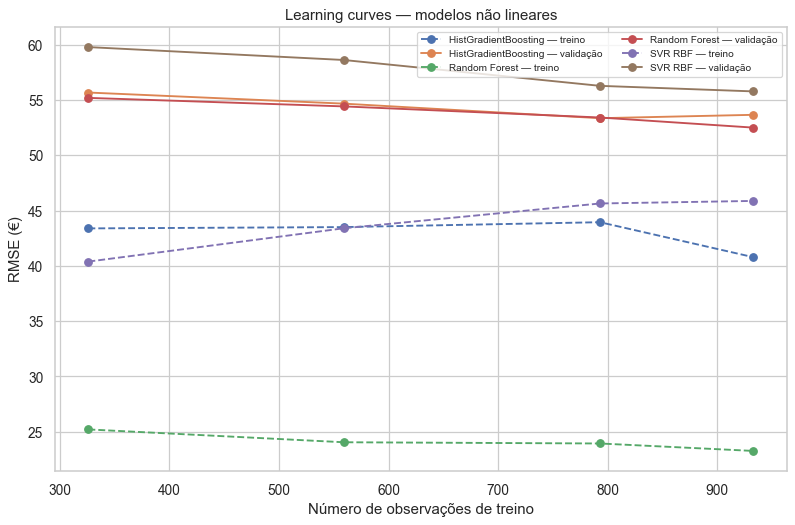

In [79]:
curve_cv = KFold(n_splits=3, shuffle=True, random_state=RANDOM_STATE)
curve_sample_size = min(1400, len(X_train))
X_lc = X_train.sample(n=curve_sample_size, random_state=RANDOM_STATE)
y_lc = y_train.loc[X_lc.index]
train_sizes = np.array([0.35, 0.60, 0.85, 1.00])

learning_rows = []
for label, model_name in nonlinear_models.items():
    if label == "Random Forest regularizado":
        # Mantém a figura focada nos três modelos pedidos para learning curves.
        continue
    estimator = clone(fitted_models[model_name])
    try:
        sizes_abs, train_scores, val_scores = learning_curve(
            estimator,
            X_lc,
            y_lc,
            train_sizes=train_sizes,
            cv=curve_cv,
            scoring=make_scorer(rmse, greater_is_better=False),
            n_jobs=1,
            shuffle=True,
            random_state=RANDOM_STATE,
        )
        for size, tr_scores, va_scores in zip(sizes_abs, train_scores, val_scores):
            learning_rows.append({
                "Modelo": label,
                "N_treino": int(size),
                "RMSE_treino": float(-np.mean(tr_scores)),
                "RMSE_validação": float(-np.mean(va_scores)),
                "RMSE_treino_std": float(np.std(-tr_scores)),
                "RMSE_validação_std": float(np.std(-va_scores)),
            })
    except Exception as exc:
        print(f"Learning curve não gerada para {label}: {exc}")

learning_curve_df = pd.DataFrame(learning_rows)
learning_curve_df.to_excel(ADV_DIR / "learning_curves_nonlinear_models.xlsx", index=False)

fig, ax = plt.subplots(figsize=(9, 6))
for label, group in learning_curve_df.groupby("Modelo"):
    ax.plot(group["N_treino"], group["RMSE_treino"], marker="o", linestyle="--", label=f"{label} — treino")
    ax.plot(group["N_treino"], group["RMSE_validação"], marker="o", label=f"{label} — validação")
ax.set_title("Learning curves — modelos não lineares")
ax.set_xlabel("Número de observações de treino")
ax.set_ylabel("RMSE (€)")
ax.legend(fontsize=8, ncol=2)
plt.tight_layout()
plt.savefig(ADV_DIR / "learning_curves_nonlinear_models.png", dpi=140, bbox_inches="tight")
plt.show()

### 6.2.11 Validation curves

As validation curves mostram como alterações em hiperparâmetros de complexidade afetam o erro. Aumentos de complexidade que reduzem erro de treino mas não validação sugerem sobreajustamento.

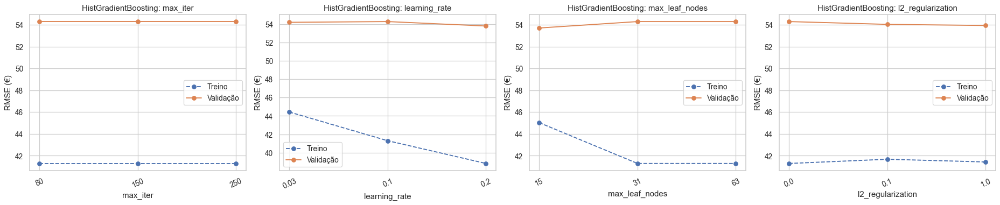

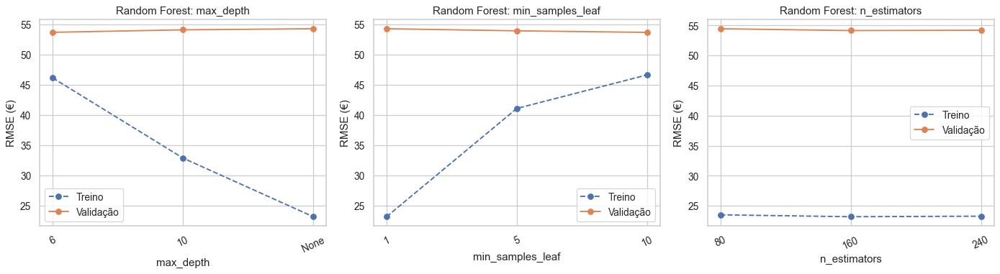

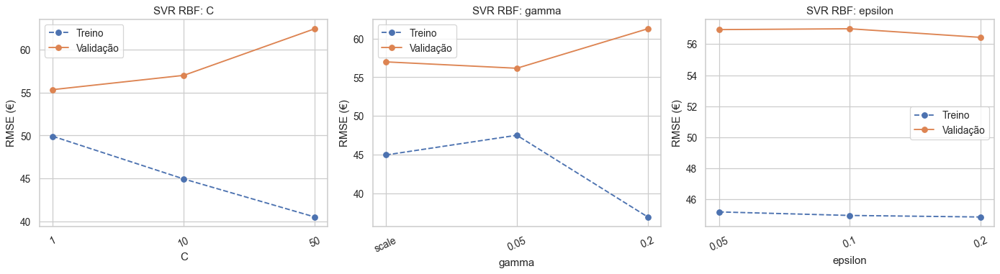

,Modelo,Parâmetro,Valor,RMSE_treino,RMSE_validação,RMSE_validação_std
0,Random Forest,max_depth,6,46.130,53.666,2.211
1,Random Forest,max_depth,10,32.888,54.074,1.526
2,Random Forest,max_depth,None,23.201,54.253,1.323
3,Random Forest,min_samples_leaf,1,23.201,54.253,1.323
4,Random Forest,min_samples_leaf,5,41.084,53.913,1.762
5,Random Forest,min_samples_leaf,10,46.630,53.653,1.952
6,Random Forest,n_estimators,80,23.513,54.459,1.579
7,Random Forest,n_estimators,160,23.198,54.157,1.288
8,Random Forest,n_estimators,240,23.284,54.212,1.237
9,HistGradientBoosting,max_iter,80,41.294,54.292,1.711


In [80]:
validation_sample_size = min(1200, len(X_train))
X_val_curve = X_train.sample(n=validation_sample_size, random_state=RANDOM_STATE)
y_val_curve = y_train.loc[X_val_curve.index]
validation_cv = KFold(n_splits=3, shuffle=True, random_state=RANDOM_STATE)

validation_specs = {
    "Random Forest": {
        "model_name": nonlinear_models.get("Random Forest"),
        "params": {
            "regressor__model__max_depth": [6, 10, None],
            "regressor__model__min_samples_leaf": [1, 5, 10],
            "regressor__model__n_estimators": [80, 160, 240],
        },
    },
    "HistGradientBoosting": {
        "model_name": nonlinear_models.get("HistGradientBoosting"),
        "params": {
            "regressor__model__max_iter": [80, 150, 250],
            "regressor__model__learning_rate": [0.03, 0.10, 0.20],
            "regressor__model__max_leaf_nodes": [15, 31, 63],
            "regressor__model__l2_regularization": [0.0, 0.1, 1.0],
        },
    },
    "SVR RBF": {
        "model_name": nonlinear_models.get("SVR RBF"),
        "params": {
            "regressor__model__C": [1, 10, 50],
            "regressor__model__gamma": ["scale", 0.05, 0.20],
            "regressor__model__epsilon": [0.05, 0.10, 0.20],
        },
    },
}

validation_rows = []
for label, spec in validation_specs.items():
    model_name = spec["model_name"]
    if model_name is None:
        continue
    for param_name, values in spec["params"].items():
        for value in values:
            estimator = clone(fitted_models[model_name])
            estimator.set_params(**{param_name: value})
            try:
                scores = cross_validate(
                    estimator,
                    X_val_curve,
                    y_val_curve,
                    cv=validation_cv,
                    scoring={"RMSE": make_scorer(rmse, greater_is_better=False)},
                    n_jobs=1,
                    return_train_score=True,
                    error_score="raise",
                )
                validation_rows.append({
                    "Modelo": label,
                    "Parâmetro": param_name.split("__")[-1],
                    "Valor": str(value),
                    "RMSE_treino": float(-scores["train_RMSE"].mean()),
                    "RMSE_validação": float(-scores["test_RMSE"].mean()),
                    "RMSE_validação_std": float(np.std(-scores["test_RMSE"])),
                })
            except Exception as exc:
                validation_rows.append({
                    "Modelo": label,
                    "Parâmetro": param_name.split("__")[-1],
                    "Valor": str(value),
                    "RMSE_treino": np.nan,
                    "RMSE_validação": np.nan,
                    "RMSE_validação_std": np.nan,
                    "Erro": str(exc),
                })

validation_curve_df = pd.DataFrame(validation_rows)
validation_curve_df.to_excel(ADV_DIR / "validation_curves_nonlinear_models.xlsx", index=False)

for label, group_model in validation_curve_df.dropna(subset=["RMSE_validação"]).groupby("Modelo"):
    params = group_model["Parâmetro"].unique()
    fig, axes = plt.subplots(1, len(params), figsize=(5.2 * len(params), 4.4))
    if len(params) == 1:
        axes = [axes]
    for ax, param in zip(axes, params):
        group_param = group_model[group_model["Parâmetro"].eq(param)].copy()
        ax.plot(group_param["Valor"], group_param["RMSE_treino"], marker="o", linestyle="--", label="Treino")
        ax.plot(group_param["Valor"], group_param["RMSE_validação"], marker="o", label="Validação")
        ax.set_title(f"{label}: {param}")
        ax.set_xlabel(param)
        ax.set_ylabel("RMSE (€)")
        ax.tick_params(axis="x", rotation=25)
        ax.legend()
    plt.tight_layout()
    plt.savefig(ADV_DIR / f"validation_curves_{safe_model_filename(label)}.png", dpi=140, bbox_inches="tight")
    plt.show()

display(validation_curve_df.round(3))

### 6.2.12 Erro por categoria e geografia

A análise por categoria identifica segmentos onde o modelo falha mais: tipo de alojamento, cluster de localização, licença e perfil profissional do anfitrião.

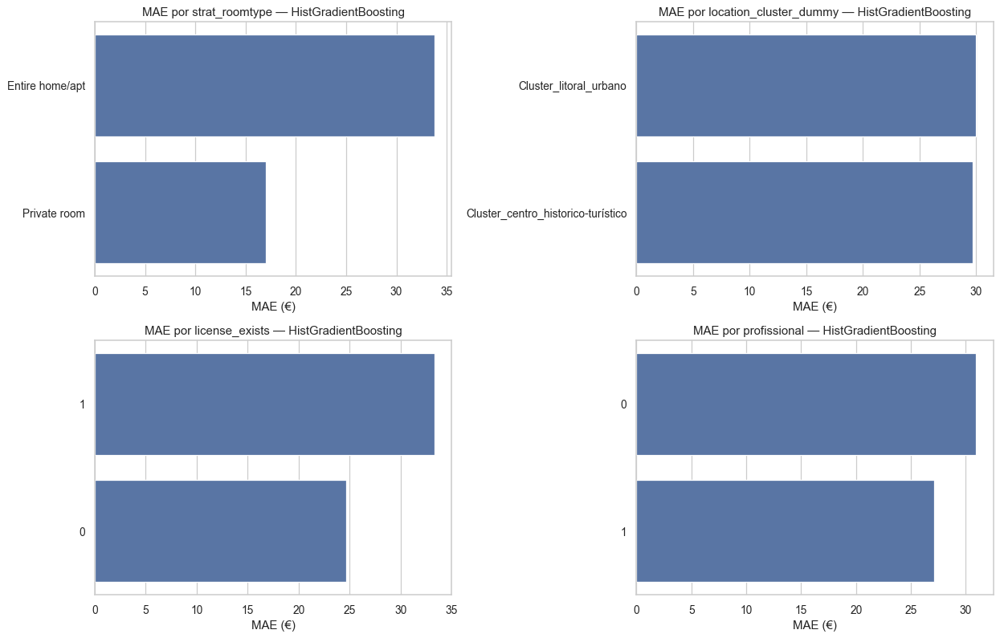

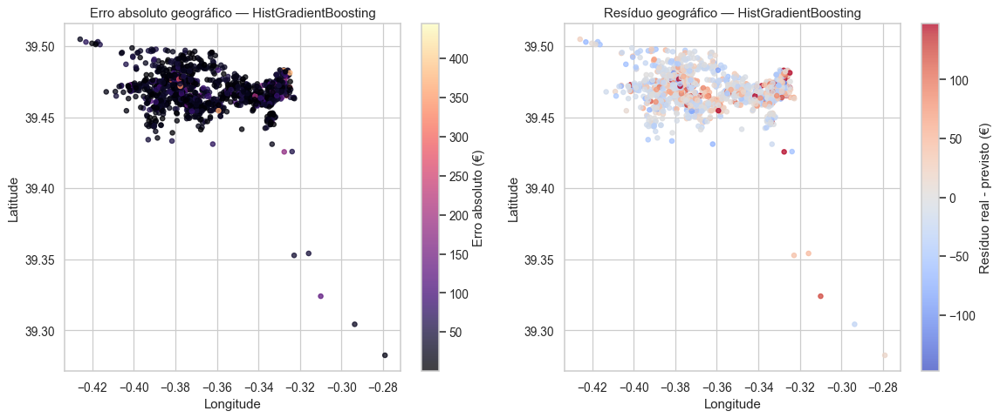

,Modelo,Categoria,Grupo,N,MAE,RMSE
0,Random Forest,strat_roomtype,Entire home/apt,1027,33.308,55.248
1,Random Forest,strat_roomtype,Private room,312,16.648,26.198
2,Random Forest,location_cluster_dummy,Cluster_centro_historico-turístico,864,28.821,47.711
3,Random Forest,location_cluster_dummy,Cluster_litoral_urbano,471,30.184,53.662
4,Random Forest,license_exists,0,538,24.352,38.408
5,Random Forest,license_exists,1,802,32.819,56.451
6,Random Forest,profissional,0,962,30.587,52.225
7,Random Forest,profissional,1,378,26.449,43.811
8,Random Forest,neighbourhood_group,ALGIROS,54,26.661,43.837
9,Random Forest,neighbourhood_group,BENICALAP,21,33.082,37.473


In [81]:
context_for_errors = df.loc[y_test.index, [
    col for col in [
        "strat_roomtype", "location_cluster_dummy", "license_exists", "profissional",
        "neighbourhood_group", "latitude", "longitude"
    ]
    if col in df.columns
]].copy()

segment_rows = []
for label, model_name in nonlinear_models.items():
    pred = np.asarray(test_predictions[model_name])
    tmp = context_for_errors.copy()
    tmp["real"] = y_test.to_numpy()
    tmp["pred"] = pred
    tmp["abs_error"] = np.abs(tmp["real"] - tmp["pred"])
    for category in ["strat_roomtype", "location_cluster_dummy", "license_exists", "profissional", "neighbourhood_group"]:
        if category not in tmp.columns:
            continue
        for group_value, group in tmp.groupby(category, observed=True):
            if len(group) < 20:
                continue
            segment_rows.append({
                "Modelo": label,
                "Categoria": category,
                "Grupo": str(group_value),
                "N": len(group),
                "MAE": mean_absolute_error(group["real"], group["pred"]),
                "RMSE": rmse(group["real"], group["pred"]),
            })

segment_error_df = pd.DataFrame(segment_rows)
segment_error_df.to_excel(ADV_DIR / "error_by_category_nonlinear_models.xlsx", index=False)

final_label = "HistGradientBoosting" if "HistGradientBoosting" in nonlinear_models else list(nonlinear_models.keys())[0]
plot_categories = ["strat_roomtype", "location_cluster_dummy", "license_exists", "profissional"]
fig, axes = plt.subplots(2, 2, figsize=(14, 9))
axes = axes.ravel()
for ax, category in zip(axes, plot_categories):
    data = segment_error_df[
        segment_error_df["Modelo"].eq(final_label) & segment_error_df["Categoria"].eq(category)
    ].sort_values("MAE", ascending=False)
    if data.empty:
        ax.axis("off")
        continue
    sns.barplot(data=data, x="MAE", y="Grupo", ax=ax, color="#4C72B0")
    ax.set_title(f"MAE por {category} — {final_label}")
    ax.set_xlabel("MAE (€)")
    ax.set_ylabel("")
plt.tight_layout()
plt.savefig(ADV_DIR / "error_by_category_final_model.png", dpi=140, bbox_inches="tight")
plt.show()

# Mapa geográfico do erro para o modelo final recomendado.
if {"latitude", "longitude"}.issubset(context_for_errors.columns):
    final_model_name = nonlinear_models.get("HistGradientBoosting", list(nonlinear_models.values())[0])
    final_label_geo = "HistGradientBoosting" if "HistGradientBoosting" in nonlinear_models else list(nonlinear_models.keys())[0]
    pred_geo = np.asarray(test_predictions[final_model_name])
    geo_error_df = context_for_errors.copy()
    geo_error_df["real"] = y_test.to_numpy()
    geo_error_df["pred"] = pred_geo
    geo_error_df["residual"] = geo_error_df["real"] - geo_error_df["pred"]
    geo_error_df["abs_error"] = geo_error_df["residual"].abs()
    geo_error_df.to_excel(ADV_DIR / "geographic_error_final_model.xlsx", index=True)

    fig, axes = plt.subplots(1, 2, figsize=(13, 5.5))
    sc0 = axes[0].scatter(
        geo_error_df["longitude"],
        geo_error_df["latitude"],
        c=geo_error_df["abs_error"],
        cmap="magma",
        s=18,
        alpha=0.75,
    )
    axes[0].set_title(f"Erro absoluto geográfico — {final_label_geo}")
    axes[0].set_xlabel("Longitude")
    axes[0].set_ylabel("Latitude")
    plt.colorbar(sc0, ax=axes[0], label="Erro absoluto (€)")

    vmax = np.nanpercentile(np.abs(geo_error_df["residual"]), 98)
    sc1 = axes[1].scatter(
        geo_error_df["longitude"],
        geo_error_df["latitude"],
        c=geo_error_df["residual"].clip(-vmax, vmax),
        cmap="coolwarm",
        s=18,
        alpha=0.75,
        vmin=-vmax,
        vmax=vmax,
    )
    axes[1].set_title(f"Resíduo geográfico — {final_label_geo}")
    axes[1].set_xlabel("Longitude")
    axes[1].set_ylabel("Latitude")
    plt.colorbar(sc1, ax=axes[1], label="Resíduo real - previsto (€)")
    plt.tight_layout()
    plt.savefig(ADV_DIR / "geographic_error_final_model.png", dpi=140, bbox_inches="tight")
    plt.show()

display(segment_error_df.head(12).round(3))

### 6.2.13 Comparação visual final dos modelos não lineares

A figura final sintetiza desempenho, dispersão dos erros, erro por quantil, importância das variáveis e calibração. Serve como apoio visual à escolha do modelo final.

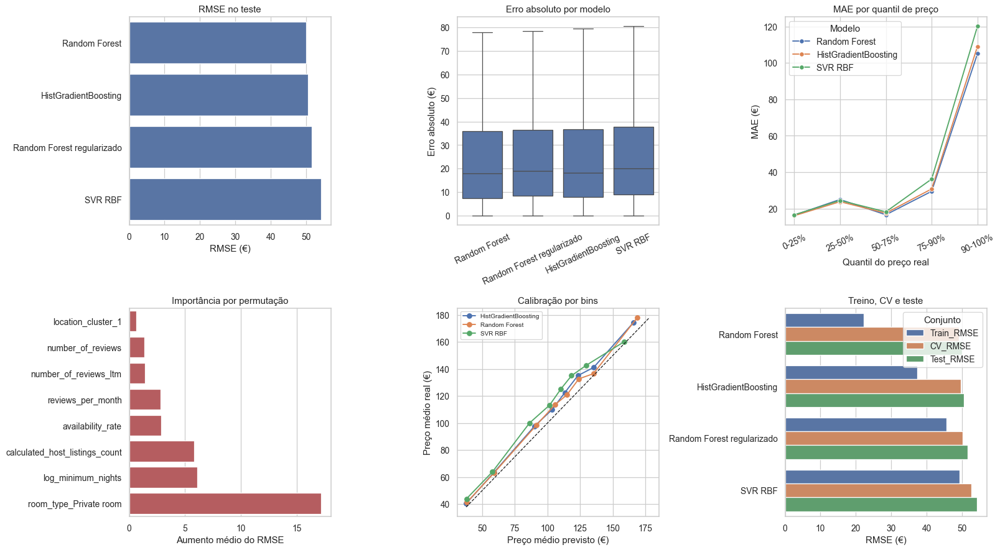

In [82]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# 1. Métricas principais.
metric_summary = advanced_results[
    advanced_results["Modelo"].isin(nonlinear_models.values())
].copy()
metric_summary["Modelo_curto"] = metric_summary["Modelo"].map({v: k for k, v in nonlinear_models.items()})
sns.barplot(data=metric_summary.sort_values("Test_RMSE"), x="Test_RMSE", y="Modelo_curto", ax=axes[0, 0], color="#4C72B0")
axes[0, 0].set_title("RMSE no teste")
axes[0, 0].set_xlabel("RMSE (€)")
axes[0, 0].set_ylabel("")

# 2. Boxplot dos erros absolutos.
sns.boxplot(data=nonlinear_error_df, x="Modelo", y="abs_error", ax=axes[0, 1], showfliers=False)
axes[0, 1].set_title("Erro absoluto por modelo")
axes[0, 1].set_xlabel("")
axes[0, 1].set_ylabel("Erro absoluto (€)")
axes[0, 1].tick_params(axis="x", rotation=25)

# 3. Erro por quantil.
q_focus = quantile_error_df[quantile_error_df["Modelo"].isin(["Random Forest", "HistGradientBoosting", "SVR RBF"])]
sns.lineplot(data=q_focus, x="Quantil_preço", y="MAE", hue="Modelo", marker="o", ax=axes[0, 2])
axes[0, 2].set_title("MAE por quantil de preço")
axes[0, 2].set_xlabel("Quantil do preço real")
axes[0, 2].set_ylabel("MAE (€)")
axes[0, 2].tick_params(axis="x", rotation=25)

# 4. Importância das variáveis no modelo final.
if "hgb_importance_df" in globals():
    imp_plot = hgb_importance_df.head(8).sort_values("Importância_RMSE")
else:
    imp_plot = importance_df.head(8).sort_values("Importância_RMSE")
sns.barplot(data=imp_plot, x="Importância_RMSE", y="Variável", ax=axes[1, 0], color="#C44E52")
axes[1, 0].set_title("Importância por permutação")
axes[1, 0].set_xlabel("Aumento médio do RMSE")
axes[1, 0].set_ylabel("")

# 5. Calibração por bins.
for label, group in calibration_df.groupby("Modelo"):
    if label in ["Random Forest", "HistGradientBoosting", "SVR RBF"]:
        axes[1, 1].plot(group["pred_mean"], group["real_mean"], marker="o", label=label)
lims = [
    min(calibration_df["pred_mean"].min(), calibration_df["real_mean"].min()),
    max(calibration_df["pred_mean"].max(), calibration_df["real_mean"].max()),
]
axes[1, 1].plot(lims, lims, "k--", linewidth=1)
axes[1, 1].set_title("Calibração por bins")
axes[1, 1].set_xlabel("Preço médio previsto (€)")
axes[1, 1].set_ylabel("Preço médio real (€)")
axes[1, 1].legend(fontsize=8)

# 6. Treino/CV/teste.
tree_summary = advanced_results[
    advanced_results["Modelo"].isin([
        nonlinear_models.get("Random Forest"),
        nonlinear_models.get("Random Forest regularizado"),
        nonlinear_models.get("HistGradientBoosting"),
        nonlinear_models.get("SVR RBF"),
    ])
][["Modelo", "Train_RMSE", "CV_RMSE", "Test_RMSE"]].copy()
tree_summary["Modelo"] = tree_summary["Modelo"].map({v: k for k, v in nonlinear_models.items()})
tree_melt = tree_summary.melt(id_vars="Modelo", var_name="Conjunto", value_name="RMSE")
sns.barplot(data=tree_melt, x="RMSE", y="Modelo", hue="Conjunto", ax=axes[1, 2])
axes[1, 2].set_title("Treino, CV e teste")
axes[1, 2].set_xlabel("RMSE (€)")
axes[1, 2].set_ylabel("")

plt.tight_layout()
plt.savefig(ADV_DIR / "final_visual_comparison_nonlinear_models.png", dpi=140, bbox_inches="tight")
plt.show()

## 6.3 Análise dos maiores erros absolutos

O erro máximo absoluto deve ser analisado, porque pode revelar segmentos onde o modelo é menos fiável: alojamentos de luxo, zonas específicas, alojamentos com poucas reviews ou preços extremos.

In [83]:
final_recommended_name = "M9 — HistGradientBoosting log(y)"
final_model = fitted_models[final_recommended_name]
final_pred = test_predictions[final_recommended_name]

error_df = pd.DataFrame({
    "real_price": y_test,
    "pred_price": final_pred,
})
error_df["abs_error"] = (error_df["real_price"] - error_df["pred_price"]).abs()
error_df["signed_error"] = error_df["real_price"] - error_df["pred_price"]

context_cols = [
    "strat_roomtype", "neighbourhood_group", "neighbourhood", "price",
    "number_of_reviews", "reviews_per_month", "availability_365",
    "minimum_nights", "calculated_host_listings_count", "license_exists"
]
context_cols = [c for c in context_cols if c in df.columns]
max_error_cases = error_df.join(df.loc[error_df.index, context_cols], how="left")
max_error_cases = max_error_cases.sort_values("abs_error", ascending=False)
max_error_cases.head(20).to_excel(OUTPUT_DIR / "max_error_cases_final_model.xlsx", index=True)

top20 = max_error_cases.head(20)
max_error_summary = pd.DataFrame({
    "Indicador": [
        "Erro absoluto máximo",
        "Preço real mediano top 20 erros",
        "Preço previsto mediano top 20 erros",
        "N top 20 Entire home/apt",
        "N top 20 Private room",
        "N top 20 sem reviews",
        "N top 20 preço real acima P95",
        "Bairro/grupo mais frequente no top 20",
    ],
    "Valor": [
        top20["abs_error"].max(),
        top20["real_price"].median(),
        top20["pred_price"].median(),
        int((top20.get("strat_roomtype") == "Entire home/apt").sum()) if "strat_roomtype" in top20 else None,
        int((top20.get("strat_roomtype") == "Private room").sum()) if "strat_roomtype" in top20 else None,
        int((top20.get("number_of_reviews", pd.Series(index=top20.index)) == 0).sum()),
        int((top20["real_price"] > y_train.quantile(0.95)).sum()),
        top20["neighbourhood_group"].mode().iloc[0] if "neighbourhood_group" in top20 and not top20["neighbourhood_group"].mode().empty else "",
    ],
})
max_error_summary.to_excel(OUTPUT_DIR / "max_error_summary_final_model.xlsx", index=False)
display(max_error_summary)
display(max_error_cases.head(10))

,Indicador,Valor
0,Erro absoluto máximo,444.841943
1,Preço real mediano top 20 erros,393.0
2,Preço previsto mediano top 20 erros,130.592976
3,N top 20 Entire home/apt,20
4,N top 20 Private room,0
5,N top 20 sem reviews,1
6,N top 20 preço real acima P95,20
7,Bairro/grupo mais frequente no top 20,POBLATS MARITIMS


,real_price,pred_price,abs_error,signed_error,strat_roomtype,neighbourhood_group,neighbourhood,price,number_of_reviews,reviews_per_month,availability_365,minimum_nights,calculated_host_listings_count,license_exists
6729,575.0,130.158057,444.841943,444.841943,Entire home/apt,L'EIXAMPLE,RUSSAFA,575.0,15,2.71,332,1,4,1
987,500.0,124.093728,375.906272,375.906272,Entire home/apt,POBLATS MARITIMS,LA MALVA-ROSA,500.0,109,1.26,90,3,4,1
2209,505.0,139.915131,365.084869,365.084869,Entire home/apt,POBLATS MARITIMS,LA MALVA-ROSA,505.0,51,1.18,274,3,3,1
5048,489.0,125.492723,363.507277,363.507277,Entire home/apt,QUATRE CARRERES,CIUTAT DE LES ARTS I DE LES CIENCIES,489.0,4,0.34,129,2,9,1
2057,510.0,170.639678,339.360322,339.360322,Entire home/apt,CIUTAT VELLA,EL MERCAT,510.0,95,1.96,92,2,30,1
2996,430.0,113.025152,316.974848,316.974848,Entire home/apt,QUATRE CARRERES,MONT-OLIVET,430.0,90,2.98,59,2,1,1
256,428.0,121.416812,306.583188,306.583188,Entire home/apt,CIUTAT VELLA,EL CARME,428.0,18,0.16,44,3,1,0
1308,400.0,118.086830,281.913170,281.913170,Entire home/apt,POBLATS MARITIMS,CABANYAL-CANYAMELAR,400.0,23,1.10,309,9,3,1
5049,396.0,116.529571,279.470429,279.470429,Entire home/apt,QUATRE CARRERES,MONT-OLIVET,396.0,56,3.84,115,2,1,1
4424,437.0,165.999349,271.000651,271.000651,Entire home/apt,CIUTAT VELLA,EL CARME,437.0,37,2.07,351,11,9,1


## 6.4 SHAP values: tentativa e limitação técnica

O SHAP summary plot seria uma forma útil de interpretar modelos de árvores. A célula seguinte tenta usar `shap`; se o pacote não estiver instalado, regista a limitação e mantém a importância por permutação como alternativa.

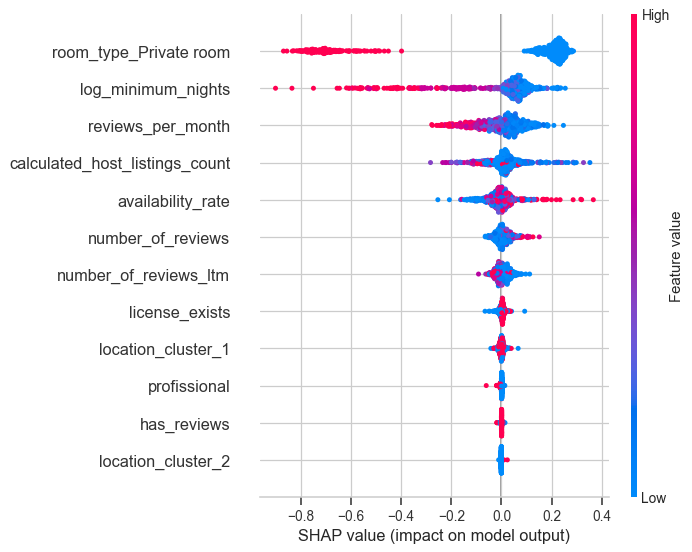

SHAP disponível e gráfico gerado para Random Forest.


In [84]:
shap_available = True
shap_error = ""

if shap_available:
    try:
        # Interpretar o Random Forest interno no espaço log(price).
        rf_model = fitted_models["M8 — Random Forest log(y)"].regressor_.named_steps["model"]
        sample_shap = X_test.sample(n=min(700, len(X_test)), random_state=RANDOM_STATE)
        explainer = shap.TreeExplainer(rf_model)
        shap_values = explainer.shap_values(sample_shap)
        plt.figure()
        shap.summary_plot(shap_values, sample_shap, show=False, max_display=12)
        plt.tight_layout()
        plt.savefig(OUTPUT_DIR / "fig_shap_summary_random_forest.png", dpi=140, bbox_inches="tight")
        plt.show()
        shap_status = "SHAP disponível e gráfico gerado para Random Forest."
    except Exception as exc:
        shap_status = f"SHAP instalado, mas a geração falhou: {exc}"
else:
    shap_status = "SHAP não está instalado no ambiente; foi usada importância por permutação como alternativa."

with open(OUTPUT_DIR / "shap_status.txt", "w", encoding="utf-8") as f:
    f.write(shap_status)
print(shap_status)

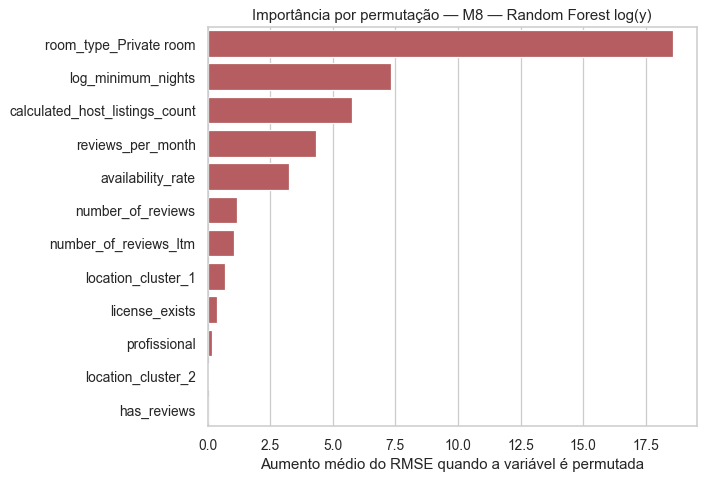

,Variável,Importância_RMSE,Desvio
9,room_type_Private room,18.6000,0.8431
3,log_minimum_nights,7.3088,0.6489
4,calculated_host_listings_count,5.7650,0.2601
0,reviews_per_month,4.3208,0.5136
5,availability_rate,3.2601,0.3315
2,number_of_reviews,1.1965,0.0997
1,number_of_reviews_ltm,1.0430,0.2708
12,location_cluster_1,0.7134,0.1561
6,license_exists,0.3791,0.1050
8,profissional,0.1890,0.0481


In [85]:
# Importância por permutação do melhor modelo.
perm = permutation_importance(
    best_predictive_model,
    X_test,
    y_test,
    scoring=make_scorer(rmse, greater_is_better=False),
    n_repeats=8,
    random_state=RANDOM_STATE,
    n_jobs=-1,
)
importance_df = pd.DataFrame({
    "Variável": X_test.columns,
    "Importância_RMSE": perm.importances_mean,
    "Desvio": perm.importances_std,
}).sort_values("Importância_RMSE", ascending=False)
importance_df.to_excel(OUTPUT_DIR / "permutation_importance_best_model.xlsx", index=False)

top_imp = importance_df.head(12).copy()
fig, ax = plt.subplots(figsize=(8, 5.5))
sns.barplot(data=top_imp, x="Importância_RMSE", y="Variável", ax=ax, color="#C44E52")
ax.set_title(f"Importância por permutação — {best_predictive_name}")
ax.set_xlabel("Aumento médio do RMSE quando a variável é permutada")
ax.set_ylabel("")
plt.tight_layout()
plt.savefig(OUTPUT_DIR / "fig_permutation_importance_best_model.png", dpi=140, bbox_inches="tight")
plt.show()

importance_df.head(12).round(4)

## 6.5 Interpretação crítica da comparação

A tabela e os gráficos anteriores permitem separar três fenómenos:

- se o modelo tem baixo erro em treino mas erro muito maior em validação/teste, há risco de overfitting;
- se treino, validação cruzada e teste são próximos, o desempenho é mais robusto;
- se um modelo não linear melhora pouco face a Ridge/Lasso/Elastic Net, a vantagem preditiva pode não justificar a perda de interpretabilidade.

O Lasso é particularmente útil para interpretação porque pode reduzir coeficientes exatamente para zero. As variáveis com coeficiente zero são tratadas como removidas pelo modelo; as restantes são as variáveis mantidas para previsão na escala logarítmica.

## 6.6 Exemplo aplicado: previsão para um alojamento artificial

Para ilustrar a utilização prática dos modelos, é criado um alojamento artificial com características plausíveis para Valência. O objectivo não é validar o modelo num caso individual, porque não existe preço real observado, mas mostrar como um mesmo perfil é avaliado por um modelo clássico e por um modelo não linear.

O exemplo compara um modelo interpretável, preferencialmente Lasso com `log(price)`, com o HistGradientBoosting, que é o modelo final recomendado pelo compromisso entre desempenho e risco de sobreajustamento. As previsões são apresentadas em euros porque os modelos com alvo logarítmico foram ajustados com `TransformedTargetRegressor`, que aplica automaticamente a transformação inversa no método `predict()`.


In [86]:
# Perfil artificial plausível de um alojamento em Valência.
alojamento_artificial_perfil = {
    "room_type": "Entire home/apt",
    "minimum_nights": 2,
    "number_of_reviews": 45,
    "reviews_per_month": 1.8,
    "calculated_host_listings_count": 3,
    "availability_365": 180,
    "number_of_reviews_ltm": 12,
    "license_exists": 1,
    "latitude": 39.47,
    "longitude": -0.37,
    "neighbourhood_group": "CIUTAT VELLA",
    "location_cluster_interpretado": "Cluster centro histórico-turístico",
}

display(pd.DataFrame([alojamento_artificial_perfil]))


def construir_features_alojamento_artificial(colunas_modelo):
    """Cria uma observação artificial com exactamente as colunas esperadas pelos modelos."""
    features = pd.DataFrame(0.0, index=[0], columns=colunas_modelo)

    valores_continuos = {
        "minimum_nights": alojamento_artificial_perfil["minimum_nights"],
        "log_minimum_nights": np.log1p(alojamento_artificial_perfil["minimum_nights"]),
        "number_of_reviews": alojamento_artificial_perfil["number_of_reviews"],
        "reviews_per_month": alojamento_artificial_perfil["reviews_per_month"],
        "number_of_reviews_ltm": alojamento_artificial_perfil["number_of_reviews_ltm"],
        "calculated_host_listings_count": alojamento_artificial_perfil["calculated_host_listings_count"],
        "availability_365": alojamento_artificial_perfil["availability_365"],
        "availability_rate": alojamento_artificial_perfil["availability_365"] / 365,
        "review_intensity": alojamento_artificial_perfil["number_of_reviews"] * alojamento_artificial_perfil["reviews_per_month"],
        "days_since_last_review": 30,
        "license_exists": alojamento_artificial_perfil["license_exists"],
        "has_reviews": 1,
        "profissional": int(alojamento_artificial_perfil["calculated_host_listings_count"] >= 10),
        "latitude": alojamento_artificial_perfil["latitude"],
        "longitude": alojamento_artificial_perfil["longitude"],
    }

    for coluna, valor in valores_continuos.items():
        if coluna in features.columns:
            features.loc[0, coluna] = valor

    # O tipo Entire home/apt é a categoria de referência quando existem dummies de room_type.
    for coluna in features.columns:
        if coluna.startswith("room_type_"):
            features.loc[0, coluna] = 0.0

    # CIUTAT VELLA é tratado como alojamento do cluster central/turístico no modelo com clusters.
    for coluna in features.columns:
        if coluna.startswith("location_cluster_"):
            features.loc[0, coluna] = 1.0 if coluna == "location_cluster_1" else 0.0

    # Compatibilidade com versões que usem bairros agregados em vez de clusters.
    bairro_alvo = alojamento_artificial_perfil["neighbourhood_group"].upper()
    neigh_cols = [col for col in features.columns if col.startswith("neigh_")]
    if neigh_cols:
        match = None
        for col in neigh_cols:
            nome = col.replace("neigh_", "").upper()
            if nome == bairro_alvo or "CIUTAT" in nome:
                match = col
                break
        if match is not None:
            features.loc[0, match] = 1.0

    return features.apply(pd.to_numeric, errors="coerce").fillna(0.0)


alojamento_artificial_modelo = construir_features_alojamento_artificial(X_train.columns)

print("Colunas usadas pelo modelo para o alojamento artificial:")
display(alojamento_artificial_modelo.loc[:, alojamento_artificial_modelo.ne(0).any(axis=0)].round(4))


modelo_classico_nome = (
    "M6 — Lasso log(y)" if "M6 — Lasso log(y)" in fitted_models
    else "M2 — Linear múltipla log(y)" if "M2 — Linear múltipla log(y)" in fitted_models
    else best_interpretable_name
)
modelo_nao_classico_nome = (
    "M9 — HistGradientBoosting log(y)" if "M9 — HistGradientBoosting log(y)" in fitted_models
    else best_predictive_name
)

modelos_exemplo = [
    (
        modelo_classico_nome,
        "Clássico / interpretável",
        "Modelo linear regularizado com alvo logarítmico; permite leitura por coeficientes e selecção de variáveis.",
    ),
    (
        modelo_nao_classico_nome,
        "Não clássico / não linear",
        "Modelo flexível que capta relações não lineares e interacções sem as especificar manualmente.",
    ),
]

previsoes_exemplo = []
for nome_modelo, tipo_modelo, interpretacao in modelos_exemplo:
    preco_previsto = float(np.asarray(fitted_models[nome_modelo].predict(alojamento_artificial_modelo))[0])
    previsoes_exemplo.append({
        "Modelo": nome_modelo,
        "Tipo": tipo_modelo,
        "Preço previsto (€)": preco_previsto,
        "Interpretação": interpretacao,
    })

df_previsao_alojamento_artificial = pd.DataFrame(previsoes_exemplo)
df_previsao_alojamento_artificial.to_excel(
    OUTPUT_DIR / "previsao_alojamento_artificial.xlsx",
    index=False,
)

display(df_previsao_alojamento_artificial.round({"Preço previsto (€)": 2}))


metricas_cols = ["Modelo", "Test_RMSE", "Test_MAE", "Test_WAPE_%", "Test_R2"]
df_metricas_alojamento_artificial = (
    advanced_results[advanced_results["Modelo"].isin([modelo_classico_nome, modelo_nao_classico_nome])]
    .loc[:, metricas_cols]
    .merge(df_previsao_alojamento_artificial[["Modelo", "Preço previsto (€)"]], on="Modelo", how="left")
    .rename(columns={
        "Test_RMSE": "RMSE teste",
        "Test_MAE": "MAE teste",
        "Test_WAPE_%": "WAPE teste (%)",
        "Test_R2": "R² teste",
    })
)

df_metricas_alojamento_artificial.to_excel(
    OUTPUT_DIR / "metricas_e_previsao_alojamento_artificial.xlsx",
    index=False,
)

display(df_metricas_alojamento_artificial.round(3))


diferenca_previsao = float(
    abs(
        df_previsao_alojamento_artificial.loc[0, "Preço previsto (€)"]
        - df_previsao_alojamento_artificial.loc[1, "Preço previsto (€)"]
    )
)

if diferenca_previsao <= 10:
    leitura_estabilidade = "As previsões são próximas, sugerindo estabilidade para este perfil de alojamento."
else:
    leitura_estabilidade = (
        "As previsões diferem de forma visível, sugerindo sensibilidade às relações não lineares "
        "captadas pelo modelo avançado."
    )

print(leitura_estabilidade)
print("Nota: por ser um caso artificial, não existe preço real observado e não se calcula erro individual.")

applied_prediction_payload = {
    "perfil": alojamento_artificial_perfil,
    "previsoes": df_previsao_alojamento_artificial.to_dict(orient="records"),
    "metricas_globais": df_metricas_alojamento_artificial.to_dict(orient="records"),
    "diferenca_previsao": diferenca_previsao,
    "leitura": leitura_estabilidade,
}

def json_ready(obj):
    if isinstance(obj, (np.integer,)):
        return int(obj)
    if isinstance(obj, (np.floating,)):
        return float(obj)
    if isinstance(obj, dict):
        return {str(k): json_ready(v) for k, v in obj.items()}
    if isinstance(obj, list):
        return [json_ready(v) for v in obj]
    return obj


with open(OUTPUT_DIR / "previsao_alojamento_artificial.json", "w", encoding="utf-8") as f:
    json.dump(json_ready(applied_prediction_payload), f, ensure_ascii=False, indent=2)


,room_type,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license_exists,latitude,longitude,neighbourhood_group,location_cluster_interpretado
0,Entire home/apt,2,45,1.8,3,180,12,1,39.47,-0.37,CIUTAT VELLA,Cluster centro histórico-turístico


Colunas usadas pelo modelo para o alojamento artificial:


,reviews_per_month,number_of_reviews_ltm,number_of_reviews,log_minimum_nights,calculated_host_listings_count,availability_rate,license_exists,has_reviews,location_cluster_1
0,1.8,12.0,45.0,1.0986,3.0,0.4932,1.0,1.0,1.0


,Modelo,Tipo,Preço previsto (€),Interpretação
0,M6 — Lasso log(y),Clássico / interpretável,130.47,Modelo linear regularizado com alvo logarítmic...
1,M9 — HistGradientBoosting log(y),Não clássico / não linear,128.09,Modelo flexível que capta relações não lineare...


,Modelo,RMSE teste,MAE teste,WAPE teste (%),R² teste,Preço previsto (€)
0,M9 — HistGradientBoosting log(y),50.427,29.861,27.001,0.408,128.095
1,M6 — Lasso log(y),55.995,34.155,30.885,0.270,130.471


As previsões são próximas, sugerindo estabilidade para este perfil de alojamento.
Nota: por ser um caso artificial, não existe preço real observado e não se calcula erro individual.


In [87]:
# Síntese automática para ser usada no relatório.
summary_payload = {
    "n_train": int(len(X_train)),
    "n_test": int(len(X_test)),
    "n_features": int(X_train.shape[1]),
    "removed_by_vif": removed_by_vif,
    "removed_by_cook": int(len(influential_idx)),
    "best_predictive_model": best_predictive_name,
    "best_interpretable_model": best_interpretable_name,
    "geo_comparison": geo_comparison.to_dict(orient="records"),
    "max_error_summary": max_error_summary.to_dict(orient="records"),
    "shap_status": shap_status,
    "best_predictive_metrics": advanced_results.iloc[0].to_dict(),
    "best_interpretable_metrics": interpretable_results.iloc[0].to_dict(),
    "lasso_kept": lasso_table[lasso_table["Estado"].str.startswith("Mantida")]["Variável"].to_list(),
    "lasso_removed": lasso_table[lasso_table["Estado"].str.startswith("Removida")]["Variável"].to_list(),
    "lasso_1se_alpha": float(alpha_1se),
    "lasso_1se_metrics": lasso_sparse_metrics,
    "lasso_1se_kept": lasso_sparse_table[lasso_sparse_table["Estado"].str.startswith("Mantida")]["Variável"].to_list(),
    "lasso_1se_removed": lasso_sparse_table[lasso_sparse_table["Estado"].str.startswith("Removida")]["Variável"].to_list(),
    "artificial_listing_profile": alojamento_artificial_perfil if "alojamento_artificial_perfil" in globals() else {},
    "artificial_listing_predictions": df_previsao_alojamento_artificial.to_dict(orient="records") if "df_previsao_alojamento_artificial" in globals() else [],
    "artificial_listing_metrics": df_metricas_alojamento_artificial.to_dict(orient="records") if "df_metricas_alojamento_artificial" in globals() else [],
    "artificial_listing_reading": leitura_estabilidade if "leitura_estabilidade" in globals() else "",
}

# Converter objetos numpy para tipos Python simples.
def make_jsonable(obj):
    if isinstance(obj, (np.integer,)):
        return int(obj)
    if isinstance(obj, (np.floating,)):
        return float(obj)
    if isinstance(obj, (pd.Timestamp,)):
        return str(obj)
    if isinstance(obj, dict):
        return {str(k): make_jsonable(v) for k, v in obj.items()}
    if isinstance(obj, list):
        return [make_jsonable(v) for v in obj]
    return obj

with open(OUTPUT_DIR / "modeling_summary_advanced.json", "w", encoding="utf-8") as f:
    json.dump(make_jsonable(summary_payload), f, ensure_ascii=False, indent=2)

print(json.dumps(make_jsonable(summary_payload), ensure_ascii=False, indent=2)[:2500])

{
  "n_train": 5360,
  "n_test": 1340,
  "n_features": 14,
  "removed_by_vif": [
    "days_since_last_review"
  ],
  "removed_by_cook": 279,
  "best_predictive_model": "M8 — Random Forest log(y)",
  "best_interpretable_model": "M2 — Linear múltipla log(y)",
  "geo_comparison": [
    {
      "Representação geográfica": "Clusters K-Means",
      "N preditores": 14,
      "CV_RMSE": 49.664808686700084,
      "Test_RMSE": 50.427008811611195,
      "Test_MAE": 29.86058702732579,
      "Test_WAPE_%": 27.001273106563573,
      "Test_R2": 0.4077464363721872
    },
    {
      "Representação geográfica": "Bairros agregados",
      "N preditores": 51,
      "CV_RMSE": 48.564941314935155,
      "Test_RMSE": 49.56352192440057,
      "Test_MAE": 29.043369532248242,
      "Test_WAPE_%": 26.26230863972781,
      "Test_R2": 0.4278556870220819
    }
  ],
  "max_error_summary": [
    {
      "Indicador": "Erro absoluto máximo",
      "Valor": 444.8419431360036
    },
    {
      "Indicador": "Preço real

---
# 7. Conclusão do trabalho

O objetivo do trabalho era estimar o preço por noite (`price`) de alojamentos Airbnb em Valência e perceber que variáveis, dentro do ficheiro resumido `listings.csv`, estavam mais associadas à variação dos preços. A análise confirma que o preço não é explicado de forma plenamente linear pelas variáveis disponíveis: os modelos não lineares captam melhor padrões locais e interações, mas o desempenho máximo continua moderado devido à ausência de variáveis estruturais importantes, como capacidade, número de quartos, casas de banho, amenities, qualidade do imóvel e reputação detalhada.

Em termos preditivos, o melhor modelo por RMSE no conjunto de teste foi o **Random Forest com alvo logarítmico** (`M8 — Random Forest log(y)`), com RMSE ≈ 50,00€, MAE ≈ 29,42€, WAPE ≈ 26,60% e R² ≈ 0,418. No entanto, este modelo apresentou maior diferença entre erro de treino e erro de teste, o que indica maior risco de sobreajustamento. O **HistGradientBoosting** obteve desempenho muito próximo (RMSE ≈ 50,43€, MAE ≈ 29,86€, WAPE ≈ 27,00% e R² ≈ 0,408), com menor sinal de overfitting. Por isso, a leitura metodológica mais equilibrada é: Random Forest vence em desempenho preditivo puro, enquanto HistGradientBoosting é o modelo recomendado quando se considera simultaneamente desempenho, robustez e risco de sobreajustamento.

## Resposta direta às perguntas de investigação

**1. Qual é o impacto da localização no preço do alojamento?**  
A localização tem impacto preditivo e acrescenta informação ao modelo, embora não seja o factor dominante. A comparação entre representações geográficas mostra que os bairros reais agregados são mais informativos do que os clusters K-Means: no HistGradientBoosting, a versão com clusters obteve RMSE de teste de cerca de 50,43€, enquanto a versão com bairros agregados reduziu o RMSE para cerca de 49,56€ e aumentou o R² para cerca de 0,428. Isto sugere que a geografia urbana de Valência contém sinal económico e turístico relevante. Ainda assim, este resultado deve ser lido como associação espacial: estar numa zona valorizada está associado a preços superiores, mas o modelo não prova que a localização, isoladamente, cause esse preço.

**2. Até que ponto o tipo de alojamento explica a variação de preço?**  
O tipo de alojamento é a variável mais relevante entre as disponíveis. A dummy `room_type_Private room` surge como a variável mais importante na análise por permutação, aumentando o RMSE em cerca de 18,60€ quando é baralhada. O seu coeficiente nos modelos logarítmicos é fortemente negativo, indicando que quartos privados estão associados a preços claramente inferiores aos alojamentos inteiros (`Entire home/apt`), mantendo constantes as restantes variáveis observadas. Assim, o tipo de alojamento explica uma parte substancial da variação de preço e é o principal sinal interpretativo do estudo.

**3. As políticas de reserva têm efeito no preço?**  
As políticas de reserva estão associadas ao preço, sobretudo através de `minimum_nights`. A variável `log_minimum_nights` aparece entre as mais relevantes, com aumento médio do RMSE de cerca de 7,31€ quando é permutada, e apresenta associação negativa com `log(price)`: alojamentos com estadias mínimas mais longas tendem a ter preço por noite mais baixo. A disponibilidade anual, representada por `availability_rate`, também contribui para a previsão, mas com peso mais moderado. Como os dados são observacionais, a conclusão correta é que estas políticas estão associadas ao preço, não que alterá-las causaria automaticamente uma alteração do preço.

**4. A atividade passada está correlacionada com preço?**  
A atividade passada em reviews tem correlação com o preço, mas essa relação é mais fraca e menos direta do que a do tipo de alojamento, localização ou noites mínimas. `reviews_per_month` contribui para o modelo não linear, com aumento médio do RMSE de cerca de 4,32€ quando é permutada, mas a sua correlação simples com `log(price)` é fraca e tende a ser negativa. Isto é compatível com a ideia de que alojamentos mais baratos podem ter maior rotação e, por isso, mais reviews, enquanto alojamentos mais caros podem receber reservas menos frequentes. As reviews ajudam a previsão, mas não medem diretamente qualidade nem permitem inferir causalidade.

**5. O perfil do anfitrião está associado a preços mais altos (oferta profissional) ou mais baixos?**  
O perfil do anfitrião está associado a preços mais altos, mas de forma secundária face ao tipo de alojamento e à localização. `calculated_host_listings_count` aparece como variável relevante na análise por permutação, com aumento médio do RMSE de cerca de 5,77€ quando é baralhada, e a variável `profissional` tem sinal positivo, embora menos forte. Isto sugere que anfitriões com maior escala de operação tendem a gerir alojamentos com preços superiores ou melhor posicionados no mercado. Contudo, esta associação pode refletir factores omitidos, como qualidade do imóvel, zona, capacidade e estratégia comercial, pelo que não deve ser interpretada como efeito causal puro.

## Conclusão final

O estudo responde ao problema de negócio com um modelo capaz de estimar preços em euros com erro absoluto médio em torno de 29-30€ nos melhores modelos. Este nível de erro é útil para comparação relativa entre alojamentos e para análise exploratória do mercado, mas não é suficientemente preciso para definir preços finais de forma automática.

Do ponto de vista metodológico, os modelos lineares são úteis para interpretação, especialmente com `log(price)`, Lasso e análise de coeficientes. No entanto, os modelos não lineares, em particular Random Forest e HistGradientBoosting, apresentam melhor capacidade preditiva porque captam relações não lineares e interações entre variáveis. A escolha recomendada é o **HistGradientBoosting** como modelo final académico, complementado pela interpretação do Lasso, da regressão logarítmica e da importância por permutação.

Por fim, todas as conclusões devem ser entendidas como **associações condicionais**, não como efeitos causais. A regressão permite controlar estatisticamente pelas variáveis observadas, mas não permite afirmar que alterar uma variável causaria diretamente uma alteração no preço. Essa interpretação exigiria uma estratégia causal própria, como experiência, dados longitudinais, diferenças-em-diferenças, variáveis instrumentais ou matching. O modelo estima padrões presentes nos dados observáveis, mas não controla variáveis omitidas essenciais, como dimensão do alojamento, amenities, qualidade, reputação detalhada e distância a pontos turísticos. A principal limitação do desempenho não está apenas no algoritmo, mas sobretudo na informação limitada do ficheiro `listings.csv` resumido.


---
# 8. Referências

- Bruce, P., Bruce, A., & Gedeck, P. (2020). *Practical Statistics for Data Scientists* (2nd ed.). O'Reilly.
- Chapman, P., Clinton, J., Kerber, R., Khabaza, T., Reinartz, T., Shearer, C., & Wirth, R. (2000). *CRISP-DM 1.0: Step-by-step data mining guide*. SPSS Inc.
- Friedman, J. H. (2001). Greedy function approximation: A gradient boosting machine. *The Annals of Statistics*, 29(5), 1189-1232.
- Hoerl, A. E., & Kennard, R. W. (1970). Ridge regression: Biased estimation for nonorthogonal problems. *Technometrics*, 12(1), 55-67.
- Inside Airbnb. (2025). *Get the Data: Valencia, Spain* [Dataset]. http://insideairbnb.com/get-the-data/
- Lancaster, K. J. (1966). A new approach to consumer theory. *Journal of Political Economy*, 74(2), 132-157.
- Rosen, S. (1974). Hedonic prices and implicit markets. *Journal of Political Economy*, 82(1), 34-55.
- Tibshirani, R. (1996). Regression shrinkage and selection via the Lasso. *Journal of the Royal Statistical Society: Series B*, 58(1), 267-288.
- Zou, H., & Hastie, T. (2005). Regularization and variable selection via the Elastic Net. *Journal of the Royal Statistical Society: Series B*, 67(2), 301-320.